# Assignment 1
**Credits**: Federico Ruggeri, Eleonora Mancini, Paolo Torroni

**Keywords**: Sexism Detection, Multi-class Classification, RNNs, Transformers, Huggingface



# Introduction
You are asked to address the [EXIST 2023 Task 2](https://clef2023.clef-initiative.eu/index.php?page=Pages/labs.html#EXIST) on sexism detection.

## Problem Definition

This task aims to categorize the sexist messages according to the intention of the author in one of the following categories: (i) direct sexist message, (ii) reported sexist message and (iii) judgemental message.

### Examples:



1.   DIRECT: The intention was to write a message that is sexist by itself or incites to be sexist, as in: ''*A woman needs love, to fill the fridge, if a man can give this to her in return for her services (housework, cooking, etc), I don’t see what else she needs.*''
2.  REPORTED: The intention is to report and share a sexist situation suffered by a woman or women in first or third person, as in: ''*Today, one of my year 1 class pupils could not believe he’d lost a race against a girl.*''
3. JUDGEMENTAL: The intention was to judge, since the tweet describes sexist situations or behaviours with the aim of condemning them e.g. ''*As usual, the woman was the one quitting her job for the family’s welfare…*''






# Preliminaries

## Install Packages

In [1]:
!pip install gensim
!pip install emoji spacy
!pip install torchinfo

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 64.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.4/608.4 kB 14.5 MB/s eta 0:00:00


## Mount Drive

In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## Import Libraries

In [3]:
# Standard library imports
import json
import os
import random
import re
import math
import html
from pathlib import Path
from itertools import chain
from collections import Counter, defaultdict

# Scientific computing and data manipulation
import numpy as np
import pandas as pd
from scipy.special import softmax
from scipy.spatial.distance import cosine

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

# Progress bar
from tqdm import tqdm

# Natural Language Processing - NLTK
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize, WhitespaceTokenizer, wordpunct_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from nltk.corpus import wordnet

# Emoji handling
import emoji

# Word embeddings - Gensim
import gensim
import gensim.downloader as gloader

# Machine learning - Scikit-learn
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    confusion_matrix, multilabel_confusion_matrix,
    precision_recall_curve, average_precision_score
)
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight
from sklearn.decomposition import TruncatedSVD


# Dimensionality reduction
import umap

# Deep learning - TensorFlow/Keras
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Deep learning - PyTorch and Transformers
import torch
import torch.nn as nn

from datasets import Dataset
from transformers import (
    AutoModelForSequenceClassification,
    AutoTokenizer,
    AutoConfig,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    TrainerCallback,
    set_seed
)
from torchinfo import summary

## NLTK Resources Setup

In [4]:
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


True

## Global Variables

In [5]:
#Label Mapping
mapping = {
        "-": 0,
        "DIRECT": 1,
        "JUDGEMENTAL": 2,
        "REPORTED": 3
    }

mapping_inverse = {v: k for k, v in mapping.items()}

#Path of the data
path = "A1/data"

#Name of the classes
class_names = ["NON-sexist", "DIRECT", "JUDGEMENTAL", "REPORTED"]

#Random seeds for robust evaluation
seeds = [111, 222, 333]

#Function to obtain deterministic behaviour
def set_global_seed(seed):
    # Python
    random.seed(seed)

    tf.config.experimental.enable_op_determinism()

    # NumPy
    np.random.seed(seed)

    # TensorFlow
    tf.random.set_seed(seed)

    # TensorFlow determinism
    os.environ["PYTHONHASHSEED"] = str(seed)

    #Hugging Face Transformers
    set_seed(seed)

train_notebook = True


## Utility Functions

### Task 1

In [6]:
def load_json_splits(path):

    path = Path(path)
    required_files = {"training.json", "validation.json", "test.json"}

    # Check existing json files in directory
    existing_files = {f.name for f in path.glob("*.json")}

    # Check if any required file is missing
    missing = required_files - existing_files
    if missing:
        raise FileNotFoundError(
            f"Missing required JSON files: {missing}. "
            f"Expected files: {required_files}"
        )

    def load_json_file(file_path):
        with open(file_path, "r", encoding="utf-8") as f:
            data = json.load(f)
        return pd.DataFrame.from_dict(data, orient="index")

    # Load and concatenate all splits
    dfs = []
    for filename in required_files:
        dfs.append(load_json_file(path / filename))

    df_all = pd.concat(dfs, axis=0, ignore_index=True)

    return df_all

def summarize_df(df, name):
    print("="*80)
    print(f"DATASET: {name}")
    print("="*80)

    # Basic info
    print(f"Shape: {df.shape[0]} rows  |  {df.shape[1]} columns\n")

    # Columns
    print("Columns:")
    for col in df.columns:
        print(f"   - {col}")
    print()

    # Missing values
    print("Missing values per column:")
    print(df.isna().sum(), "\n")

    # Language distribution (if exists)
    if "lang" in df.columns:
        print("Language distribution:")
        print(df["lang"].value_counts(), "\n")

    # Avg text length
    text_column = None
    for candidate in ["text", "tweet", "sentence", "message"]:
        if candidate in df.columns:
            text_column = candidate
            break

    if text_column:
        avg_len = df[text_column].astype(str).apply(len).mean()
        print(f"Average {text_column} length: {avg_len:.2f} characters\n")

        print("Example entries:")
        print(df[text_column].head(3), "\n")

def plot_tweet_char_distributions(df):
    df = df.copy()
    df['len_chars'] = df['tweet'].str.len()

    plt.figure()
    plt.hist(df['len_chars'], bins=30)
    plt.title("Tweet length distribution (characters)")
    plt.xlabel("Characters")
    plt.ylabel("Frequency")
    plt.show()


def plot_tweet_word_distributions(df):
    df = df.copy()
    df['len_word'] = df['tweet'].str.split().str.len()

    plt.figure()
    plt.hist(df['len_word'], bins=30)
    plt.title("Tweet length distribution (words)")
    plt.xlabel("words")
    plt.ylabel("Frequency")
    plt.show()

def plot_task1_distribution(df):

    labels = list(chain.from_iterable(df['labels_task1']))
    dist = pd.Series(Counter(labels)).sort_values(ascending=False)

    plt.figure()
    dist.plot(kind='bar')
    plt.title("Task 1 label distribution (YES / NO)")
    plt.xlabel("Label")
    plt.ylabel("Frequency")
    plt.show()


def plot_task2_distribution(df):
    labels = list(chain.from_iterable(df['labels_task2']))
    dist =  pd.Series(Counter(labels)).sort_values(ascending=False)

    plt.figure()
    dist.plot(kind='bar')
    plt.title("Task 2 label distribution")
    plt.xlabel("Label")
    plt.ylabel("Frequency")
    plt.show()


def plot_annotator_demographics(df):

    genders = list(chain.from_iterable(df['gender_annotators']))
    gender_dist = pd.Series(Counter(genders)).sort_values(ascending=False)

    ages = list(chain.from_iterable(df['age_annotators']))
    age_dist = pd.Series(Counter(ages)).sort_values(ascending=False)

    plt.figure()
    gender_dist.plot(kind='bar')
    plt.title("Annotator gender distribution")
    plt.xlabel("Gender")
    plt.ylabel("Frequency")
    plt.show()

    plt.figure()
    age_dist.plot(kind='bar')
    plt.title("Annotator age distribution")
    plt.xlabel("Age range")
    plt.ylabel("Frequency")
    plt.show()

def plot_annotator_demographics(df):
    df_exploded = df.explode(['annotators', 'gender_annotators', 'age_annotators'])

    unique_annotators = df_exploded.drop_duplicates(subset=['annotators'])

    print(f"Total unique annotators: {len(unique_annotators)}")

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    sns.countplot(data=unique_annotators, x='gender_annotators', ax=axes[0])
    axes[0].set_title('Annotator Distribution by Gender')
    axes[0].set_xlabel('Gender')
    axes[0].set_ylabel('Count')

    age_order = sorted(unique_annotators['age_annotators'].unique())
    sns.countplot(data=unique_annotators, x='age_annotators', ax=axes[1], order=age_order)
    axes[1].set_title('Annotator Distribution by Age Group')
    axes[1].set_xlabel('Age Group')
    axes[1].set_ylabel('Count')

    plt.tight_layout()
    plt.show()

def calculate_agreement(labels_list):
    """
    Calculates the normalized agreement score.
    Score = (Max_Count - 1) / (Total_Count - 1)
    """
    if not isinstance(labels_list, list) or len(labels_list) < 2:
        return None

    #(majority vote)
    counts = Counter(labels_list)
    max_count = counts.most_common(1)[0][1]
    total_count = len(labels_list)

    # Compute score
    score = (max_count - 1) / (total_count - 1)

    return round(score, 2)

def plot_agreement_histogram(df, col_name='labels_task2'):

    df['agreement_score'] = df[col_name].apply(calculate_agreement)
    valid_scores = df.dropna(subset=['agreement_score'])
    plt.figure(figsize=(10, 6))

    ax = sns.countplot(
        data=valid_scores,
        x='agreement_score',
        edgecolor='black'
    )

    # Add count labels on top of bars for clarity
    ax.bar_label(ax.containers[0])

    plt.title('Distribution of Agreement Scores', fontsize=15)
    plt.xlabel('Agreement Score (0 = Disagreement, 1 = Unanimity)', fontsize=12)
    plt.ylabel('Number of Tweets (Frequency)', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.5)

    plt.show()

def summarize_splits(train_df, dev_df, test_df):

    summarize_df(train_df, "TRAIN")
    summarize_df(dev_df, "DEV / VALIDATION")
    summarize_df(test_df, "TEST")

    print("="*80)
    print("Summary completed.")
    print("="*80)

def split_dataset(path):

    path = Path(path)

    # Required filenames
    required_files = {"training.json", "validation.json","test.json"}

    # Check existing json files in directory
    existing_files = {f.name for f in path.glob("*.json")}

    # Check if any required file is missing
    missing = required_files - existing_files
    if missing:
        raise FileNotFoundError( f"Missing required JSON files: {missing}. " f"Expected files: {required_files}" )

    # Function to load a single JSON file into a dataframe
    def load_json_file(file_path):
        with open(file_path, "r", encoding="utf-8") as f:
          data = json.load(f)
          return pd.DataFrame.from_dict(data, orient="index")

    # Load each split
    train_df = load_json_file(path / "training.json")
    dev_df = load_json_file(path / "validation.json")
    test_df = load_json_file(path / "test.json")

    return train_df, dev_df, test_df


def process_task2_labels(df, verbose=False):
    """
    This function removes 'UNKNOWN' labels from the annotators' list
    before calculating the majority vote.
    """

    allowed_labels = {"-", "DIRECT", "JUDGEMENTAL", "REPORTED"}

    df = df.copy()  # avoid modifying original dataframe

    #   PREPROCESSING: remove 'UNKNOWN'
    # We iterate through the dataframe and update the list by filtering out 'UNKNOWN'
    for idx, labels in df["labels_task2"].items():
        if not isinstance(labels, list):
            raise ValueError(f"Row {idx}: labels_task2 must be a list, got {type(labels)}")

        if "UNKNOWN" in labels:
            if verbose:
                print(f"[INFO] Removing 'UNKNOWN' from row {idx}")
            # Filter the list to keep only labels that are NOT 'UNKNOWN'
            df.at[idx, "labels_task2"] = [x for x in labels if x != "UNKNOWN"]

    #   VALIDATION
    # Check if any invalid labels remain after removal
    for idx, labels in df["labels_task2"].items():
        invalid = set(labels) - allowed_labels
        if invalid:
            raise ValueError(f"Row {idx}: invalid labels found: {invalid}")

        # Check if the list became empty (e.g., all annotators said UNKNOWN)
        if not labels:
             if verbose:
                print(f"[WARNING] Row {idx} has empty labels after removing UNKNOWN.")

    #   MAJORITY VOTING
    def majority_vote(label_list):
        if not label_list: # Handle empty lists resulted from full UNKNOWN removal
            return None

        counts = Counter(label_list)
        most_common = counts.most_common()

        if len(most_common) == 1:
            return most_common[0][0]

        top_label, top_count = most_common[0]
        second_label, second_count = most_common[1]

        # No clear majority (tie)
        if top_count == second_count:
            return None

        return top_label

    df["label"] = df["labels_task2"].apply(majority_vote)

    # Remove rows without clear majority (or empty lists)
    df = df[df["label"].notna()]

    return df

def filter_english(df):
  return df[df["lang"] == "en"]

def plot_dataset_pie(train_df, dev_df, test_df):
    sizes = [len(train_df), len(dev_df), len(test_df)]
    labels = ['Train', 'Dev', 'Test']
    colors = ['#66c2a5', '#fc8d62', '#8da0cb']

    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90)
    plt.title("Dataset composition")
    plt.show()

def filter_columns(df):
  cols_to_keep = ["id_EXIST", "lang", "tweet", "label"]

  #Remove unwanted columns: Keep only `id_EXIST`, `lang`, `tweet`, and `label`.
  df = df[cols_to_keep]

  return df

def encode_label(df, mapping):
    df["label"] = df["label"].map(mapping)
    return df

def plot_label_distribution(train_df, val_df, test_df, mapping):

    # Count labels in each split
    train_counts = train_df["label"].value_counts()
    val_counts = val_df["label"].value_counts()
    test_counts = test_df["label"].value_counts()

    # Unified label order (sorted and consistent)
    all_labels = sorted(set(train_counts.index) |
                        set(val_counts.index) |
                        set(test_counts.index))

    # Convert counts into aligned lists
    train_vals = [train_counts.get(lbl, 0) for lbl in all_labels]
    val_vals   = [val_counts.get(lbl, 0) for lbl in all_labels]
    test_vals  = [test_counts.get(lbl, 0) for lbl in all_labels]

    # X-axis labels using mapping
    x_labels = [mapping.get(lbl, lbl) for lbl in all_labels]

    # Create bar positions
    x = np.arange(len(all_labels))
    width = 0.25  # width of each bar

    plt.figure(figsize=(12, 6))

    # Plot bars
    bars_train = plt.bar(x - width, train_vals, width, label="Train")
    bars_val   = plt.bar(x, val_vals, width, label="Validation")
    bars_test  = plt.bar(x + width, test_vals, width, label="Test")

    # Add values on top of each bar
    for bars in [bars_train, bars_val, bars_test]:
        for bar in bars:
            height = bar.get_height()
            plt.text(
                bar.get_x() + bar.get_width()/2,
                height + 0.01,
                f"{int(height)}",
                ha='center',
                va='bottom',
                fontsize=9
            )

    # Configure axes
    plt.xlabel("Labels")
    plt.ylabel("Count")
    plt.title("Label distribution in Train / Validation / Test")
    plt.xticks(x, x_labels, rotation=0)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_tweet_length_analysis(df_train, df_val, df_test, mode="words", bins=20):
    """
    Parameters:
    - mode: "words" for number of words, "chars" for number of characters
    """
    def tweet_lengths(df):
        if mode == "words":
            return df["tweet"].str.split().str.len()
        elif mode == "chars":
            return df["tweet"].str.len()
        else:
            raise ValueError("mode must be 'words' or 'chars'")

    train_lengths = tweet_lengths(df_train)
    val_lengths = tweet_lengths(df_val)
    test_lengths = tweet_lengths(df_test)

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    #   Train
    axes[0].hist(train_lengths, bins=bins)
    axes[0].set_title(f"Train – Tweet length ({mode})")
    axes[0].set_xlabel(f"Tweet length ({mode})")
    axes[0].set_ylabel("Frequency")

    #   Validation
    axes[1].hist(val_lengths, bins=bins)
    axes[1].set_title(f"Validation – Tweet length ({mode})")
    axes[1].set_xlabel(f"Tweet length ({mode})")
    axes[1].set_ylabel("Frequency")

    #  Test
    axes[2].hist(test_lengths, bins=bins)
    axes[2].set_title(f"Test – Tweet length ({mode})")
    axes[2].set_xlabel(f"Tweet length ({mode})")
    axes[2].set_ylabel("Frequency")

    #  Normalized comparison
    axes[3].hist(train_lengths, bins=bins, density=True, alpha=0.6, label="Train")
    axes[3].hist(val_lengths, bins=bins, density=True, alpha=0.6, label="Validation")
    axes[3].hist(test_lengths, bins=bins, density=True, alpha=0.6, label="Test")
    axes[3].set_title(f"Normalized tweet length distribution ({mode})")
    axes[3].set_xlabel(f"Tweet length ({mode})")
    axes[3].set_ylabel("Density")
    axes[3].legend()

    plt.tight_layout()
    plt.show()

def plot_tweet_length_by_class_with_density(train_df, label_col, inv_mapping, mode="words", bins=20):

    def tweet_length(series):
        if mode == "words":
            return series.str.split().str.len()
        elif mode == "chars":
            return series.str.len()
        else:
            raise ValueError("mode must be 'words' or 'chars'")

    all_lengths = tweet_length(train_df["tweet"])
    x_max = all_lengths.max()

    classes = sorted(train_df[label_col].unique())

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    for i, cls in enumerate(classes):
        cls_df = train_df[train_df[label_col] == cls]
        lengths = tweet_length(cls_df['tweet'])

        counts, bins_edges, _ = axes[i].hist(lengths, bins=bins, alpha=0.6, color=f"C{i}", density=True, label='Histogram')

        bin_centers = 0.5*(bins_edges[1:] + bins_edges[:-1])
        axes[i].plot(bin_centers, counts, color='k', linestyle='--', label='Density line')

        axes[i].set_title(f"Class: {inv_mapping.get(cls, cls)}")
        axes[i].set_xlabel(f"Tweet length ({mode})")
        axes[i].set_ylabel("Density")
        axes[i].legend()

        axes[i].set_xlim(0, x_max)

    plt.tight_layout()
    plt.show()

### Task 2

In [7]:
lemmatizer = WordNetLemmatizer()

def clean_tweets(df, show_examples=False, pos_aware=True):

    # Lemmatization utilities
    def get_wordnet_pos(treebank_tag):
        if treebank_tag.startswith("J"):
            return wordnet.ADJ
        elif treebank_tag.startswith("V"):
            return wordnet.VERB
        elif treebank_tag.startswith("N"):
            return wordnet.NOUN
        elif treebank_tag.startswith("R"):
            return wordnet.ADV
        else:
            return wordnet.NOUN

    def lemmatize(text):
        tokens = wordpunct_tokenize(text)

        if pos_aware:
            pos_tags = pos_tag(tokens)
            lemmas = [
                lemmatizer.lemmatize(token.lower(), get_wordnet_pos(pos))
                for token, pos in pos_tags
            ]
        else:
            lemmas = [lemmatizer.lemmatize(token.lower()) for token in tokens]

        return " ".join(lemmas)

    # Text transformation functions
    def remove_emojis(text):
        return emoji.replace_emoji(text, replace="")

    def remove_hashtags(text):
        return re.sub(r"#\w+", "", text)

    def remove_mentions(text):
        return re.sub(r"@\w+", "", text)

    def remove_urls(text):
        return re.sub(r"http\S+|www\S+", "", text)

    def remove_curly_quotes(text):
        return text.replace("“", "").replace("”", "").replace("‘", "").replace("’", "")

    def remove_special_chars(text):
        return re.sub(r"[^a-zA-Z0-9\s]", "", text)

    transformations = [
        ("Remove Emojis", remove_emojis),
        ("Remove Hashtags", remove_hashtags),
        ("Remove Mentions", remove_mentions),
        ("Remove URLs", remove_urls),
        ("Remove Curly Quotes", remove_curly_quotes),
        ("Remove Special Characters", remove_special_chars),
        ("Lemmatization", lemmatize),
    ]

    # Apply transformations
    texts = df["tweet"].astype(str)
    for _, func in transformations:
        texts = texts.apply(func)
    df_old = df.copy()
    df = df.copy()
    df["tweet"] = texts.str.strip()
    df_clean = df

    # Build example DataFrame
    examples_df = None

    if show_examples:
        rows = []
        used_texts = set()

        for name, func in transformations:
            for text in df_old["tweet"]:
                if text in used_texts:
                    continue

                transformed = func(text)
                if text != transformed:
                    rows.append({
                        "Transformation": name,
                        "Before": text,
                        "After": transformed
                    })
                    used_texts.add(text)
                    break

        examples_df = pd.DataFrame(rows)

    return df_clean, examples_df

### Task 3

In [8]:
def build_vocab(df, text_column="tweet"):
    """
    Build a vocabulary using ONLY the training set (to avoid data leakage).
    """

    # 1) Tokenize all tweets in the training set
    tokenizer = WhitespaceTokenizer()
    tokenized = [tokenizer.tokenize(t.lower()) for t in tqdm(df[text_column])]

    # 2) Count all tokens in the training set
    token_counts = Counter(tok for sent in tokenized for tok in sent)

    # 3) Initialize vocabulary with special tokens
    token2id = {}
    token2id["<PAD>"] = 0
    token2id["<UNK>"] = 1

    next_id = 2

    # 4) Add all training tokens to the vocabulary
    #    Tokens are sorted for deterministic ordering
    for token in sorted(token_counts.keys()):
        token2id[token] = next_id
        next_id += 1

    # 5) Build reverse mapping (useful for debugging)
    id2token = {i: t for t, i in token2id.items()}

    word_listing = list(id2token.values())

    return token2id, id2token, word_listing

def evaluate_vocabulary(idx_to_word, word_to_idx, word_listing, df, check_default_size= False):
    assert len(idx_to_word) == len(word_to_idx)
    assert len(idx_to_word) == len(word_listing)

    for i in tqdm(range(0, len(idx_to_word))):
        assert idx_to_word[i] in word_to_idx
        assert word_to_idx[idx_to_word[i]] == i

    _, _, first_word_listing = build_vocab(df)
    _, _, second_word_listing = build_vocab(df)
    assert first_word_listing == second_word_listing

def build_embedding_matrix(embedding_model, embedding_dimension, word_to_idx, oov_strategy="random",
                           df=None, text_column=None, k=2, random_range=(-0.05, 0.05), seed=None):
    """
    Build embedding matrix with configurable OOV handling strategy.
    oov_strategy : {"random", "context"}
        Strategy used to generate embeddings for OOV words.
    """

    vocab_size = len(word_to_idx)
    embedding_matrix = np.zeros((vocab_size, embedding_dimension),dtype=np.float32)

    # UNK embedding (shared)
    UNK_EMB = np.random.uniform(random_range[0], random_range[1], embedding_dimension)

    # Contextual OOV precomputation
    contextual_oov_embeddings = {}

    if oov_strategy == "context":

        if df is None or text_column is None:
            raise ValueError(
                "df and text_column must be provided when oov_strategy='context'"
            )

        tokenizer = WhitespaceTokenizer()
        oov_sum = defaultdict(lambda: np.zeros(embedding_dimension, dtype=np.float32))
        oov_count = defaultdict(int)
        observed_oov = set()

        for text in df[text_column]:
            tokens = tokenizer.tokenize(text.lower())

            for i, token in enumerate(tokens):

                if token in embedding_model:
                    continue

                observed_oov.add(token)

                left = max(0, i - k)
                right = min(len(tokens), i + k + 1)

                context_vectors = [
                    embedding_model[tokens[j]]
                    for j in range(left, right)
                    if j != i and tokens[j] in embedding_model
                ]

                if context_vectors:
                    context_mean = np.mean(context_vectors, axis=0)
                    oov_sum[token] += context_mean
                    oov_count[token] += 1

        for word in observed_oov:
            if oov_count[word] > 0:
                contextual_oov_embeddings[word] = (oov_sum[word] / oov_count[word])
            else:
                contextual_oov_embeddings[word] = np.random.uniform(random_range[0], random_range[1], embedding_dimension)

    # Build embedding matrix
    for word, idx in word_to_idx.items():

        if word == "<UNK>":
            embedding_matrix[idx] = UNK_EMB
            continue

        if word in embedding_model:
            embedding_matrix[idx] = embedding_model[word]

        elif oov_strategy == "context" and word in contextual_oov_embeddings:
            embedding_matrix[idx] = contextual_oov_embeddings[word]

        else:
            embedding_matrix[idx] = UNK_EMB

    return embedding_matrix


def check_OOV_terms(embedding_model, word_listing):
    """
    Checks differences between pre-trained embedding model vocabulary
    and dataset specific vocabulary in order to highlight out-of-vocabulary terms.
    """
    embedding_vocabulary = set(embedding_model.key_to_index.keys())
    oov = set(word_listing).difference(embedding_vocabulary)
    return list(oov)

def visualize_embeddings(embeddings, word_annotations=None, word_to_idx=None, n_components=2):
    """
    Plots reduced word embeddings in 2D or 3D.
    """

    if n_components == 2:
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    elif n_components == 3:
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
    else:
        raise ValueError("n_components must be 2 or 3")

    # Helper function to get coordinates based on dimensions
    def get_coords(emb_array):
        if n_components == 2:
            return emb_array[:, 0], emb_array[:, 1]
        else:
            return emb_array[:, 0], emb_array[:, 1], emb_array[:, 2]

    # Plotting Logic
    if word_annotations and word_to_idx:
        print(f"Annotating words in {n_components}D: {word_annotations}")

        word_indexes = []
        for word in word_annotations:
            if word in word_to_idx:
                word_indexes.append(word_to_idx[word])

        word_indexes = np.array(word_indexes)

        # Split target vs background embeddings
        all_indices = np.arange(embeddings.shape[0])
        other_indices = np.setdiff1d(all_indices, word_indexes)

        other_embeddings = embeddings[other_indices]
        target_embeddings = embeddings[word_indexes]

        # Plot Background (Blue, transparent)
        coords_other = get_coords(other_embeddings)
        ax.scatter(*coords_other, alpha=0.1, c='blue', s=20, zorder=1)

        # Plot Target (Red, opaque)
        coords_target = get_coords(target_embeddings)
        ax.scatter(*coords_target, alpha=1.0, c='red', s=50, zorder=5)

        # Plot Halo (Circle around target)
        ax.scatter(*coords_target, alpha=1, facecolors='none', edgecolors='r', s=200, zorder=5)

        # Annotate Text
        for word, word_index in zip(word_annotations, word_indexes):
            coords_word = embeddings[word_index]
            if n_components == 2:
                ax.annotate(word, xy=(coords_word[0], coords_word[1]), fontsize=11, fontweight='bold', zorder=10)
            else:
                ax.text(
                    coords_word[0], coords_word[1], coords_word[2],
                    word,
                    fontsize=10,
                    fontweight='bold',
                    zorder=10
                )

    else:
        # Plot everything if no annotations
        coords_all = get_coords(embeddings)
        ax.scatter(*coords_all, alpha=0.1, c='blue', zorder=1)

    # Limits and Titles
    if n_components == 2:
        # Auto-scale limits avoiding outliers for 2D
        axis_x_limit = (np.percentile(embeddings[:, 0], 1), np.percentile(embeddings[:, 0], 99))
        axis_y_limit = (np.percentile(embeddings[:, 1], 1), np.percentile(embeddings[:, 1], 99))

        # Add margin
        plt.xlim(axis_x_limit[0] - 1, axis_x_limit[1] + 1)
        plt.ylim(axis_y_limit[0] - 1, axis_y_limit[1] + 1)

    ax.set_title(f"{n_components}D Embedding Space Visualization")
    ax.set_xlabel("Component 1")
    ax.set_ylabel("Component 2")
    if n_components == 3:
        ax.set_zlabel("Component 3")

    plt.show()


def reduce_SVD(embeddings, n_components=2):
    """
    Applies SVD dimensionality reduction.
    """
    svd = TruncatedSVD(n_components=n_components, n_iter=10)
    reduced = svd.fit_transform(embeddings)
    return reduced

def reduce_umap(embeddings, n_components=2):
    """
    Applies UMAP dimensionality reduction.
    """
    umap_emb = umap.UMAP(n_components=n_components, metric='cosine')
    reduced = umap_emb.fit_transform(embeddings)
    return reduced


def run_visualization(method_name, words_list, word_to_idx, embedding_matrix, n_components=2):
    method_name = method_name.lower().strip()
    method_map = {
        'svd': reduce_SVD,
        'umap': reduce_umap
    }

    if method_name not in method_map:
        raise RuntimeError(f'Invalid method name! Got {method_name}.')

    print(f"Running {method_name.upper()} reduction to {n_components}D...")

    # Call reduction with dynamic components
    reduced = method_map[method_name](embedding_matrix, n_components=n_components)

    # Call visualization
    visualize_embeddings(reduced, words_list, word_to_idx, n_components=n_components)



def print_top_similar(embedding_matrix, word_to_idx, idx_to_word, target_word, topn=10):
    """
    Prints top-N most similar words to a given word using embedding matrix.
    """
    if target_word not in word_to_idx:
        print(f"'{target_word}' not in vocabulary")
        return

    target_vec = embedding_matrix[word_to_idx[target_word]]
    sims = {}

    for word, idx in word_to_idx.items():
        if word in {"<PAD>", "<UNK>", target_word}:
            continue
        sims[word] = 1 - cosine(target_vec, embedding_matrix[idx])

    top_words = sorted(sims.items(), key=lambda x: x[1], reverse=True)[:topn]

    print(f"Top {topn} words similar to '{target_word}':")
    for w, score in top_words:
        print(f"  {w} : {score:.3f}")

def print_analogy(embedding_matrix, word_to_idx, idx_to_word, a, b, c, topn=5):
    """
    Solves analogy: a is to b as c is to ? using embedding matrix.
    """
    for word in [a, b, c]:
        if word not in word_to_idx:
            print(f"Word '{word}' not in vocabulary")
            return

    vec = embedding_matrix[word_to_idx[b]] - embedding_matrix[word_to_idx[a]] + embedding_matrix[word_to_idx[c]]
    sims = {}

    for word, idx in word_to_idx.items():
        if word in [a, b, c]:
            continue
        if word in {"<PAD>", "<UNK>"}:
            continue

        sims[word] = 1 - cosine(vec, embedding_matrix[idx])

    top_words = sorted(sims.items(), key=lambda x: x[1], reverse=True)[:topn]

    print(f"Analogy: {a} -> {b} :: {c} -> ?")
    for w, score in top_words:
        print(f"  {w} : {score:.3f}")


def similarity_heatmap(embedding_matrix, word_to_idx, words):
    """
    Plots heatmap of cosine similarity among a list of words using embedding matrix.
    """
    n = len(words)
    sim_matrix = np.zeros((n,n))

    for i in range(n):
        for j in range(n):
            if words[i] in word_to_idx and words[j] in word_to_idx:
                sim_matrix[i,j] = 1 - cosine(
                    embedding_matrix[word_to_idx[words[i]]],
                    embedding_matrix[word_to_idx[words[j]]]
                )
            else:
                sim_matrix[i,j] = 0

    plt.figure(figsize=(10,8))
    sns.heatmap(sim_matrix, xticklabels=words, yticklabels=words, annot=True, cmap="coolwarm")
    plt.title("Word Similarity Heatmap")
    plt.show()

def gender_bias_score(embedding_model, word, male_words=["he", "man"], female_words=["she", "woman"]):
    """
    Measures bias as difference in cosine similarity between male vs female sets.
    """

    def avg_similarity(target, words):
        sims = [1 - cosine(embedding_model[target], embedding_model[w]) for w in words if w in embedding_model]
        return np.mean(sims) if sims else 0

    male_sim = avg_similarity(word, male_words)
    female_sim = avg_similarity(word, female_words)

    print(f"Word: {word}")
    print(f"  Male similarity avg: {male_sim:.3f}")
    print(f"  Female similarity avg: {female_sim:.3f}")


def group_bias_scores(embedding_matrix, word_to_idx, target_words, attribute_words, col_name="Similarity Score"):
    """
    Computes cosine similarity of target words against the centroid of attribute words.
    """
    scores = {}

    attr_vecs = [
        embedding_matrix[word_to_idx[w]]
        for w in attribute_words
        if w in word_to_idx and np.linalg.norm(embedding_matrix[word_to_idx[w]]) > 0
    ]

    if not attr_vecs:
        print("Warning: No valid attribute words found in vocabulary.")
        return pd.DataFrame()

    attr_mean = np.mean(attr_vecs, axis=0)

    for word in target_words:
        if word not in word_to_idx:
            continue

        vec = embedding_matrix[word_to_idx[word]]
        if np.linalg.norm(vec) == 0:
            continue

        # Cosine Similarity = 1 - Cosine Distance
        scores[word] = 1 - cosine(vec, attr_mean)

    df_scores = pd.DataFrame(list(scores.items()), columns=["Target Word", col_name])

    return df_scores.sort_values(by=col_name, ascending=False).reset_index(drop=True)

### Task 4

In [9]:
def compute_optimal_seq_len(texts):
    tokenizer = WhitespaceTokenizer()
    lengths = [len(tokenizer.tokenize(t)) for t in texts]
    return {
        "mean": np.mean(lengths),
        "median": np.median(lengths),
        "95percentile": np.percentile(lengths, 95),
        "max": np.max(lengths)
    }

### Task 5

In [10]:
def text_to_ids(text, vocab):
    tokenizer = WhitespaceTokenizer()
    tokens = tokenizer.tokenize(text.lower())

    ids = [
        vocab[token] if token in vocab else vocab["<UNK>"]
        for token in tokens
    ]
    return ids

def prepare_dataset(df, vocab, max_len):
    X = [text_to_ids(t, vocab) for t in df["tweet"]]
    X = pad_sequences(X, maxlen=max_len, padding="post", truncating="post")

    y = df["label"].values  # already integers 0–3
    return X, y

def load_model_weights(model, filepath = "model_weights.h5"):
    model.load_weights(filepath)
    print(f"Weights loaded from: {filepath}")
    return model

def train_models(models_list, seeds, model_name, X_train, y_train, X_val, y_val, epochs, batch_size, verbose=True):

    histories = []

    for i in range(len(models_list)):
        print("="*80)
        print(f"TRAINING: {model_name} with Random Seed {seeds[i]}")
        print("="*80)

        #Setting Random Seed
        set_global_seed(seeds[i])

        #Training the model
        f1_logger = MacroF1Logger( train_data=(X_train, y_train), val_data=(X_val, y_val))
        lr_logger = LearningRateLogger()
        history = models_list[i].fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epochs, batch_size=batch_size, verbose=verbose, callbacks=[f1_logger, lr_logger])

        histories.append(history)

        #Save the weights
        models_list[i].save_weights(f"{model_name.split()[0]}_{i+1}.weights.h5")
        print(f"Weights saved in: {model_name.split()[0]}_{i+1}.weights.h5")

    print("="*80)
    print(f"TRAINING OVER")
    print("="*80)

    return histories

def plot_training_histories(histories, seeds):
    assert len(histories) == len(seeds), "histories and seeds must have the same length"

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle("Training History (Multiple Seeds)", fontsize=16)

    # Get color cycle
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']

    for i, (history, seed) in enumerate(zip(histories, seeds)):
        h = history.history
        epochs = range(1, len(h["loss"]) + 1)
        color = color_cycle[i % len(color_cycle)]

        # Loss
        axes[0, 0].plot(
            epochs, h["loss"],
            color=color, linestyle="-",
            label=f"Train seed {seed}"
        )
        if "val_loss" in h:
            axes[0, 0].plot(
                epochs, h["val_loss"],
                color=color, linestyle="--",
                label=f"Validation seed {seed}"
            )

        # Accuracy
        if "accuracy" in h:
            axes[0, 1].plot(
                epochs, h["accuracy"],
                color=color, linestyle="-",
                label=f"Train seed {seed}"
            )
            if "val_accuracy" in h:
                axes[0, 1].plot(
                    epochs, h["val_accuracy"],
                    color=color, linestyle="--",
                    label=f"Validation seed {seed}"
                )

        # Macro-F1
        if "macro_f1" in h:
            axes[1, 0].plot(
                epochs, h["macro_f1"],
                color=color, linestyle="-",
                label=f"Train seed {seed}"
            )
            if "val_macro_f1" in h:
                axes[1, 0].plot(
                    epochs, h["val_macro_f1"],
                    color=color, linestyle="--",
                    label=f"Validation seed {seed}"
                )

        # Learning rate
        if "lr" in h:
            axes[1, 1].plot(
                epochs, h["lr"],
                color=color,
                label=f"Seed {seed}"
            )

    # Formatting
    axes[0, 0].set_title("Loss over Epochs")
    axes[0, 0].set_xlabel("Epoch")
    axes[0, 0].set_ylabel("Loss")
    axes[0, 0].grid(True)
    axes[0, 0].legend()

    axes[0, 1].set_title("Accuracy over Epochs")
    axes[0, 1].set_xlabel("Epoch")
    axes[0, 1].set_ylabel("Accuracy")
    axes[0, 1].grid(True)
    axes[0, 1].legend()

    axes[1, 0].set_title("Macro F1-score over Epochs")
    axes[1, 0].set_xlabel("Epoch")
    axes[1, 0].set_ylabel("Macro F1")
    axes[1, 0].grid(True)
    axes[1, 0].legend()

    axes[1, 1].set_title("Learning Rate over Epochs")
    axes[1, 1].set_xlabel("Epoch")
    axes[1, 1].set_ylabel("Learning Rate")
    axes[1, 1].grid(True)
    axes[1, 1].legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


def evaluate_models(models, X, y, seeds, class_names=None, display_cm=True, model_name="Model"):

    assert len(models) == len(seeds), "models and seeds must have the same length"

    metrics = {
        "Accuracy": [],
        "Macro F1": [],
        "Macro Precision": [],
        "Macro Recall": []
    }

    confusion_matrices = []

    # Evaluation loop
    for model in models:
        y_pred_probs = model.predict(X)
        y_pred = np.argmax(y_pred_probs, axis=1)

        metrics["Accuracy"].append(accuracy_score(y, y_pred))
        metrics["Macro F1"].append(f1_score(y, y_pred, average="macro"))
        metrics["Macro Precision"].append(precision_score(y, y_pred, average="macro"))
        metrics["Macro Recall"].append(recall_score(y, y_pred, average="macro"))

        confusion_matrices.append(confusion_matrix(y, y_pred))

    # Build metrics DataFrame
    metrics_df = pd.DataFrame(metrics, index=seeds).T
    metrics_df.columns = [f"Seed {s}" for s in seeds]

    metrics_df["Mean"] = metrics_df.mean(axis=1)
    metrics_df["Std"] = metrics_df.std(axis=1)

    # Print report
    print(f"=== Evaluation Report: {model_name} ===")
    for metric in metrics_df.index:
        mean = metrics_df.loc[metric, "Mean"]
        std = metrics_df.loc[metric, "Std"]
        print(f"{metric:17s}: {mean:.4f} ± {std:.4f}")

    # Plot confusion matrices
    if display_cm:
        fig, axes = plt.subplots(1, 3, figsize=(15, 4))

        for ax, cm, seed in zip(axes, confusion_matrices, seeds):
            sns.heatmap(
                cm,
                annot=True,
                fmt="d",
                cmap="Blues",
                xticklabels=class_names,
                yticklabels=class_names,
                ax=ax
            )
            ax.set_title(f"{model_name} – Seed {seed}")
            ax.set_xlabel("Predicted")
            ax.set_ylabel("True")

        plt.tight_layout()
        plt.show()

    return metrics_df

### Task 6

In [11]:
def tokenize_function(examples):
    return tokenizer( examples["tweet"],
                      padding=False,      # We use the DataCollator for dynamic padding
                      truncation=True)

def analyze_raw_vs_tokenized(raw_dataset, tokenized_dataset, text_column="tweet", max_length=512):
    """
    Analyze and visualize differences between raw and tokenized datasets.
    """

    # Raw text lengths
    raw_texts = raw_dataset[text_column]

    raw_char_len = raw_texts.apply(len)
    raw_word_len = raw_texts.apply(lambda x: len(x.split()))

    # Tokenized lengths
    token_lens = [
        len(tokens)
        for tokens in tokenized_dataset["input_ids"]
    ]

    token_lens = np.array(token_lens)

    # Statistics
    stats = pd.DataFrame({
        "Raw (chars)": raw_char_len.describe(percentiles=[.5, .75, .9, .95, .99]),
        "Raw (words)": raw_word_len.describe(percentiles=[.5, .75, .9, .95, .99]),
        "Tokenized": pd.Series(token_lens).describe(percentiles=[.5, .75, .9, .95, .99])
    })

    print("\n=== Length Statistics ===")
    print(stats.round(2))

    # Truncation analysis
    truncated_pct = (token_lens >= max_length).mean() * 100
    print(f"\nPercentage of sequences reaching max_length ({max_length}): "
          f"{truncated_pct:.2f}%")

    # Plots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle("Raw vs Tokenized Dataset Analysis", fontsize=16)

    # Histogram raw words
    axes[0, 0].hist(raw_word_len, bins=50)
    axes[0, 0].set_title("Raw Tweet Length (Words)")
    axes[0, 0].set_xlabel("Words")
    axes[0, 0].set_ylabel("Frequency")
    axes[0, 0].grid(True)

    # Histogram tokenized
    axes[0, 1].hist(token_lens, bins=50)
    axes[0, 1].set_title("Tokenized Tweet Length (Tokens)")
    axes[0, 1].set_xlabel("Tokens")
    axes[0, 1].set_ylabel("Frequency")
    axes[0, 1].grid(True)

    # Scatter raw words vs tokens
    axes[1, 0].scatter(raw_word_len, token_lens, alpha=0.3)
    axes[1, 0].set_title("Raw Words vs Tokenized Length")
    axes[1, 0].set_xlabel("Words")
    axes[1, 0].set_ylabel("Tokens")
    axes[1, 0].grid(True)

    # Boxplot comparison
    axes[1, 1].boxplot(
        [raw_word_len, token_lens],
        tick_labels=["Raw (Words)", "Tokenized (Tokens)"]
    )
    axes[1, 1].set_title("Length Distribution Comparison")
    axes[1, 1].grid(True)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    return stats

def load_hf_trainers(base_path, filename, seeds, batch_size=64):

    trainers = []
    print(f"Starting restoration of Trainers from: {base_path}")

    for seed in seeds:
        model_path = os.path.join(base_path, f"{filename}_{seed}")

        if os.path.exists(model_path):
            print(f"Loading seed {seed}...", end=" ")
            try:
                # Load Tokenizer and Model
                tokenizer = AutoTokenizer.from_pretrained(model_path)
                model = AutoModelForSequenceClassification.from_pretrained(model_path)

                # Minimal arguments for inference
                eval_args = TrainingArguments(
                    output_dir="/tmp/dummy_eval",
                    per_device_eval_batch_size=batch_size,
                    report_to="none"
                )

                # Create Trainer wrapper
                trainer = Trainer(
                    model=model,
                    args=eval_args,
                    processing_class=tokenizer
                )

                trainers.append(trainer)
                print("OK.")

            except Exception as e:
                print(f"\nERROR loading seed {seed}: {e}")
        else:
            print(f"\nWARNING: Path not found: {model_path}")

    print(f"\nTotal Trainers restored: {len(trainers)}")
    return trainers

def compute_metrics(eval_pred):
    """
    Computes accuracy and macro F1-score for Hugging Face Trainer.
    """
    logits, labels = eval_pred

    # If the model returns a tuple (e.g., loss, logits), extract the logits
    if isinstance(logits, tuple):
        logits = logits[0]

    # Convert logits to class predictions (index of max value)
    predictions = np.argmax(logits, axis=-1)

    acc = accuracy_score(labels, predictions)
    f1 = f1_score(labels, predictions, average='macro')

    return {
        'accuracy': acc,
        'f1_macro': f1
    }

class MetricsHistoryCallback(TrainerCallback):
    def __init__(self):
        self.history = {
            "train_loss": [],
            "eval_loss": [],
            "train_accuracy": [],
            "eval_accuracy": [],
            "train_f1_macro": [],
            "eval_f1_macro": [],
            "learning_rate": []
        }

    def on_log(self, args, state, control, logs=None, **kwargs):
        if logs is None:
            return

        # Training loss & LR
        if "loss" in logs:
            self.history["train_loss"].append(logs["loss"])

        if "learning_rate" in logs:
            self.history["learning_rate"].append(logs["learning_rate"])

        # Evaluation metrics
        if "eval_loss" in logs:
            self.history["eval_loss"].append(logs["eval_loss"])

        if "eval_accuracy" in logs:
            self.history["eval_accuracy"].append(logs["eval_accuracy"])

        if "eval_f1_macro" in logs:
            self.history["eval_f1_macro"].append(logs["eval_f1_macro"])


def train_models_transformer(trainers, seeds, model_name):

    for i in range(len(trainers)):
        print("="*80)
        print(f"TRAINING: {model_name} with Random Seed {seeds[i]}")
        print("="*80)

        #Setting Random Seed
        set_global_seed(seeds[i])

        #Train the model
        trainers[i].train()

        #Save the weights
        final_save_path = f"./final_model_seed_{seeds[i]}"
        trainers[i].save_model(final_save_path)
        print(f"Model seed {seeds[i]} saved in {final_save_path}")


    print("="*80)
    print(f"TRAINING OVER")
    print("="*80)

def plot_compare_trainers(trainers, seeds):

    assert len(trainers) == len(seeds), "Trainer list and seed list must have the same length"

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle("Training Comparison (Multiple Seeds)", fontsize=16)

    # Cycle over colors for different seeds
    prop_cycle = plt.rcParams['axes.prop_cycle']
    colors = prop_cycle.by_key()['color']

    for i, (trainer, seed) in enumerate(zip(trainers, seeds)):
        # Data Extraction and Cleaning
        history = trainer.state.log_history
        df_raw = pd.DataFrame(history)

        # Group by epoch taking the last valid value.
        if 'epoch' in df_raw.columns:
            df = df_raw.groupby('epoch').last().reset_index()
            # Keep only integer epochs (end of epoch) for cleanliness
            df = df[df['epoch'] % 1 == 0]
        else:
            print(f"Warning: Trainer with seed {seed} has no valid data.")
            continue

        epochs = df['epoch']
        color = colors[i % len(colors)]

        #  PLOT 1: LOSS
        ax = axes[0, 0]
        # Train Loss
        if 'loss' in df.columns:
            ax.plot(epochs, df['loss'], color=color, linestyle="-", label=f"Train seed {seed}")
        elif 'train_loss' in df.columns: # Fallback custom name
            ax.plot(epochs, df['train_loss'], color=color, linestyle="-", label=f"Train seed {seed}")

        # Val Loss
        if 'eval_loss' in df.columns:
            ax.plot(epochs, df['eval_loss'], color=color, linestyle="--", label=f"Val seed {seed}")

        # PLOT 2: ACCURACY
        ax = axes[0, 1]
        # Train Accuracy (if available)
        if 'train_accuracy' in df.columns:
            ax.plot(epochs, df['train_accuracy'], color=color, linestyle="-", label=f"Train seed {seed}")
        # Val Accuracy
        if 'eval_accuracy' in df.columns:
            ax.plot(epochs, df['eval_accuracy'], color=color, linestyle="--", label=f"Val seed {seed}")

        #  PLOT 3: MACRO F1
        ax = axes[1, 0]
        # Train F1 (if available)
        if 'train_f1_macro' in df.columns:
            ax.plot(epochs, df['train_f1_macro'], color=color, linestyle="-", label=f"Train seed {seed}")
        # Val F1
        if 'eval_f1_macro' in df.columns:
            ax.plot(epochs, df['eval_f1_macro'], color=color, linestyle="--", label=f"Val seed {seed}")

        # PLOT 4: LEARNING RATE
        ax = axes[1, 1]
        df_lr = df_raw.dropna(subset=['learning_rate'])
        if not df_lr.empty:
            if 'learning_rate' in df.columns:
                ax.plot(epochs, df['learning_rate'], color=color, linestyle="-", label=f"Seed {seed}")
            else:
                ax.plot(df_lr['epoch'], df_lr['learning_rate'], color=color, linestyle="-", label=f"Seed {seed}")

    # FINAL FORMATTING
    # Loss
    axes[0, 0].set_title("Loss over Epochs")
    axes[0, 0].set_xlabel("Epoch")
    axes[0, 0].set_ylabel("Loss")
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].legend()

    # Accuracy
    axes[0, 1].set_title("Accuracy over Epochs")
    axes[0, 1].set_xlabel("Epoch")
    axes[0, 1].set_ylabel("Accuracy")
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].legend()

    # F1
    axes[1, 0].set_title("Macro F1-score over Epochs")
    axes[1, 0].set_xlabel("Epoch")
    axes[1, 0].set_ylabel("Macro F1")
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].legend()

    # Learning Rate
    axes[1, 1].set_title("Learning Rate over Epochs")
    axes[1, 1].set_xlabel("Epoch")
    axes[1, 1].set_ylabel("Learning Rate")
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def evaluate_hf_trainers(trainers, test_dataset, seeds, class_names=None, display_cm=True, model_name="HF Model"):

    assert len(trainers) == len(seeds), "Trainers and seeds must have the same length"

    metrics = {
        "Accuracy": [],
        "Macro F1": [],
        "Macro Precision": [],
        "Macro Recall": []
    }

    confusion_matrices = []

    #  Evaluation loop
    print(f"Starting evaluation for {model_name}...")

    for i, trainer in enumerate(trainers):
        print(f"  Evaluating seed {seeds[i]}...")

        # 1. Prediction on the test set
        # trainer.predict returns a PredictionOutput object containing predictions and label_ids
        output = trainer.predict(test_dataset)

        logits = output.predictions
        y_true = output.label_ids

        # Argmax to get the predicted classes
        y_pred = np.argmax(logits, axis=1)

        # 2. Calculate Metrics
        metrics["Accuracy"].append(accuracy_score(y_true, y_pred))
        metrics["Macro F1"].append(f1_score(y_true, y_pred, average="macro"))
        # zero_division=0 prevents warnings if a class is never predicted
        metrics["Macro Precision"].append(precision_score(y_true, y_pred, average="macro", zero_division=0))
        metrics["Macro Recall"].append(recall_score(y_true, y_pred, average="macro", zero_division=0))

        # 3. Confusion Matrix
        confusion_matrices.append(confusion_matrix(y_true, y_pred))

    # Build metrics DataFrame
    metrics_df = pd.DataFrame(metrics, index=seeds).T
    metrics_df.columns = [f"Seed {s}" for s in seeds]

    # Calculate statistics on numeric columns (excluding the index)
    metrics_df["Mean"] = metrics_df.mean(axis=1)
    metrics_df["Std"] = metrics_df.std(axis=1)

    #  Print report
    print(f"\n=== Evaluation Report: {model_name} ===")
    print("-" * 50)
    for metric in metrics_df.index:
        mean = metrics_df.loc[metric, "Mean"]
        std = metrics_df.loc[metric, "Std"]
        print(f"{metric:17s}: {mean:.4f} ± {std:.4f}")
    print("-" * 50)

    # Plot confusion matrices
    if display_cm:
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        fig.suptitle(f"Confusion Matrices - {model_name}", fontsize=16)

        # If class_names is not provided, try to infer it or use numbers
        if class_names is None:
            num_classes = confusion_matrices[0].shape[0]
            class_names = [str(i) for i in range(num_classes)]

        for ax, cm, seed in zip(axes, confusion_matrices, seeds):
            sns.heatmap(
                cm,
                annot=True,
                fmt="d",
                cmap="Blues",
                xticklabels=class_names,
                yticklabels=class_names,
                cbar=False, # Remove colorbar for cleaner small subplots
                ax=ax
            )
            ax.set_title(f"Seed {seed}")
            ax.set_xlabel("Predicted Label")
            ax.set_ylabel("True Label")

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    return metrics_df

### Task 7

In [12]:
def evaluate_ensemble_confidence_selection(models, X_test, y_test, tweets, label_mapping, model_name="Ensemble Model"):
    """
    Evaluate an ensemble of models (Keras OR Hugging Face Trainers) using confidence-based selection.

    Args:
        models: List of model instances (or HF Trainers).
        X_test: Input data (tokenized dataset for HF, arrays for Keras).
        y_test: True labels (optional if HF Trainer can extract them).
        tweets: Original text data for the report.
        label_mapping: Dictionary mapping indices to label names {0: "Label A", ...}.
        model_name: Name for the report title.
    """

    n_models = len(models)

    # Detect framework type based on the first model
    # Checks for specific HF Trainer attributes
    is_hf = hasattr(models[0], "predict") and hasattr(models[0], "args")
    print(f"Detected framework: {'Hugging Face (Transformers Trainer)' if is_hf else 'Keras/Sklearn'}")

    # 1. Collect probabilities and predictions
    all_probs = []
    all_preds = []
    all_confidences = []
    extracted_y_true = None

    for i, model in enumerate(models):
        if is_hf:
            # Hugging Face Trainer prediction
            output = model.predict(X_test)
            logits = output.predictions

            # Robustness fix: specific config/models might return a tuple (logits, hidden_states)
            if isinstance(logits, tuple):
                logits = logits[0]

            # Extract ground truth from the first model if available and needed
            if extracted_y_true is None and output.label_ids is not None:
                extracted_y_true = output.label_ids

            # Apply softmax to convert logits to probabilities
            probs = softmax(logits, axis=1)
        else:
            # Keras / Sklearn prediction
            if hasattr(model, "verbose"):
                 probs = model.predict(X_test, verbose=0)
            else:
                 probs = model.predict(X_test)

        # Get class predictions and max confidence scores
        preds = np.argmax(probs, axis=1)
        confidences = np.max(probs, axis=1)

        all_probs.append(probs)
        all_preds.append(preds)
        all_confidences.append(confidences)

    # Convert lists to numpy arrays for vectorized operations
    all_probs = np.array(all_probs)
    all_preds = np.array(all_preds)
    all_confidences = np.array(all_confidences)

    # Handle ground truth labels
    if y_test is None:
        if is_hf and extracted_y_true is not None:
            y_test = extracted_y_true
        else:
            raise ValueError("y_test is None and could not be automatically extracted from the Trainer.")

    # 2. Confidence-based selection
    # Select the model index with the highest confidence for each sample
    best_model_idx = np.argmax(all_confidences, axis=0)

    # Build the final ensemble predictions array
    ensemble_preds = np.array([
        all_preds[best_model_idx[i], i]
        for i in range(len(y_test))
    ])

    # 3. Global Metrics
    metrics = {
        "Accuracy": accuracy_score(y_test, ensemble_preds),
        "Macro F1": f1_score(y_test, ensemble_preds, average="macro"),
        "Macro Precision": precision_score(y_test, ensemble_preds, average="macro", zero_division=0),
        "Macro Recall": recall_score(y_test, ensemble_preds, average="macro", zero_division=0),
    }

    # 4. Print Report
    print(f"\n=== Evaluation Report: {model_name} ===")
    print("-" * 50)
    for metric_name, value in metrics.items():
        print(f"{metric_name:17s}: {value:.4f}")
    print("-" * 50)

    # 5. Visualization A: Main Global Confusion Matrix
    cm = confusion_matrix(y_test, ensemble_preds)
    classes = sorted(list(label_mapping.keys()))
    class_names = [label_mapping[i] for i in classes]
    n_classes = len(classes)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Global Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show() # Display Plot A

    print("\n\n")

    # 6. Visualization B: Per-Class Subplots
    mcm = multilabel_confusion_matrix(y_test, ensemble_preds)

    # Dynamic layout calculation
    cols = min(n_classes, 3)
    rows = (n_classes + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4.5 * rows))

    # Ensure axes is iterable even if there is only 1 class/plot
    if n_classes == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, class_idx in enumerate(classes):
        if i >= len(axes): break
        ax = axes[i]

        # Extract binary CM for this class: [[TN, FP], [FN, TP]]
        binary_cm = mcm[i]
        tn, fp, fn, tp = binary_cm.ravel()

        # Calculate per-class metrics
        prec = tp / (tp + fp) if (tp + fp) > 0 else 0
        rec = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1 = 2 * (prec * rec) / (prec + rec) if (prec + rec) > 0 else 0

        # Plot Binary Heatmap
        sns.heatmap(binary_cm, annot=True, fmt='d', cmap='Oranges', cbar=False,
                    xticklabels=['Not ' + class_names[i], class_names[i]],
                    yticklabels=['Not ' + class_names[i], class_names[i]], ax=ax)

        # Styling
        ax.set_title(f"Class: {class_names[i]}", fontsize=12, fontweight='bold')
        ax.set_xlabel("Predicted")
        if i % cols == 0:
            ax.set_ylabel("True")

        # Add metrics text below the plot
        stats_text = (
            f"Precision: {prec:.3f}\n"
            f"Recall:    {rec:.3f}\n"
            f"F1-Score:  {f1:.3f}"
        )
        ax.text(0.5, -0.35, stats_text, ha='center', va='center',
                transform=ax.transAxes, fontsize=10,
                bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.9))

    # Turn off empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show() # Display Plot B

    print("\n\n")

    # 7. Build DataFrame for analysis
    data = {
        "tweet": tweets.tolist() if isinstance(tweets, pd.Series) else tweets,
        "true_label": [label_mapping[y] for y in y_test],
    }

    for i in range(n_models):
        data[f"model_{i+1}_scores"] = [
            [f"{p:.3f}" for p in sample]
            for sample in all_probs[i]
        ]
        data[f"model_{i+1}_pred"] = [
            label_mapping[p] for p in all_preds[i]
        ]
        data[f"model_{i+1}_confidence"] = [
            f"{c:.3f}" for c in all_confidences[i]
        ]

    data["ensemble_pred"] = [label_mapping[p] for p in ensemble_preds]
    data["selected_model"] = [f"Model {idx+1}" for idx in best_model_idx]

    raw_df = pd.DataFrame(data)

    # Style function to color matches (green) and mismatches (red)
    def color_predictions(row):
        styles = []
        for col in raw_df.columns:
            if col.endswith("_pred") or col == "ensemble_pred":
                val = row[col]
                true_val = row["true_label"]
                if val == true_val:
                    styles.append("color: green; font-weight: bold;")
                else:
                    styles.append("color: red; font-weight: bold;")
            else:
                styles.append("")
        return styles

    styled_df = raw_df.style.apply(color_predictions, axis=1)

    # Collect detailed error analysis
    error_indices = np.where(ensemble_preds != y_test)[0]
    error_analysis = {
        "total_errors": len(error_indices),
        "error_indices": error_indices,
        "error_samples": raw_df.iloc[error_indices].copy(),
        "confusion_matrix": cm,
        "multilabel_cm": mcm,
        "y_true": y_test,
        "y_pred": ensemble_preds,
        "probabilities": all_probs,
        "confidences": all_confidences
    }

    return metrics, styled_df, raw_df, error_analysis

def build_confusion_error_table(confusion_matrix, label_mapping):

    rows = []

    n_classes = confusion_matrix.shape[0]

    for true_idx in range(n_classes):
        row = confusion_matrix[true_idx]

        total_samples = row.sum()
        correct = row[true_idx]
        errors = total_samples - correct

        if errors == 0:
            most_confused = "None"
            error_pct = 0.0
        else:
            # Ignore correct prediction (diagonal)
            row_no_diag = row.copy()
            row_no_diag[true_idx] = 0

            confused_idx = np.argmax(row_no_diag)
            most_confused = label_mapping[confused_idx]
            error_pct = (errors / total_samples) * 100

        rows.append({
            "True class": label_mapping[true_idx],
            "Most confused with": most_confused,
            "Error %": round(error_pct, 2)
        })

    return pd.DataFrame(rows)


def analyze_errors_by_length(raw_df, error_analysis, tokenizer=None):
    """
    Analyzes the relationship between text length (words and tokens) and prediction errors.
    """

    print("\n=== Error Analysis: Text Length Impact ===")

    # 1. Data Preparation
    raw_df['is_error'] = False
    raw_df.iloc[error_analysis['error_indices'], raw_df.columns.get_loc('is_error')] = True

    # Calculate Word Count
    raw_df['word_count'] = raw_df['tweet'].apply(lambda x: len(str(x).split()))

    # Calculate Token Count
    if tokenizer:
        print("Calculating token counts using the provided tokenizer...")
        raw_df['token_count'] = raw_df['tweet'].apply(lambda x: len(tokenizer.encode(str(x), truncation=False)))

    # Define which length metric to use for main plots
    length_metrics = ['word_count']
    if tokenizer:
        length_metrics.append('token_count')

    for metric in length_metrics:
        print(f"\n Statistics for {metric.replace('_', ' ').title()} ---")
        stats = raw_df.groupby('is_error')[metric].describe()
        # Rename indices for clarity
        stats.index = ['Correct Predictions', 'Wrong Predictions']
        print(stats[['count', 'mean', 'std', 'min', '50%', 'max']])

        # Quick mean difference check
        diff = stats.loc['Wrong Predictions', 'mean'] - stats.loc['Correct Predictions', 'mean']
        print(f"Mean Difference (Wrong - Correct): {diff:.2f}")


    # Setup style
    sns.set_style("whitegrid")

    for metric in length_metrics:
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        fig.suptitle(f'Impact of {metric.replace("_", " ").title()} on Errors', fontsize=16)

        # Plot A: Comparative Boxplot
        sns.boxplot(
            x='is_error',
            y=metric,
            hue='is_error',
            data=raw_df,
            ax=axes[0],
            palette="Set2",
            legend=False
        )

        axes[0].set_xticks([0, 1])
        axes[0].set_xticklabels(['Correct', 'Error'])

        axes[0].set_xlabel("Prediction Outcome")
        axes[0].set_ylabel(metric.replace('_', ' ').title())
        axes[0].set_title("Distribution Comparison (Boxplot)")

        # Plot B: KDE Plot (Density)
        sns.kdeplot(data=raw_df[raw_df['is_error'] == False], x=metric,
                    label='Correct', fill=True, ax=axes[1], color='green')
        sns.kdeplot(data=raw_df[raw_df['is_error'] == True], x=metric,
                    label='Error', fill=True, ax=axes[1], color='red')
        axes[1].set_title("Density Distribution (KDE)")
        axes[1].set_xlabel(metric.replace('_', ' ').title())
        axes[1].legend()

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    # 4. Binning Analysis (Error rate by length buckets)
    print("\n=== Error Rate by Length Buckets ===")

    # Use token_count if available, otherwise word_count
    metric_to_bin = 'token_count' if tokenizer else 'word_count'

    max_val = raw_df[metric_to_bin].quantile(0.95) # Cut extreme outliers for plotting
    bins = range(0, int(max_val) + 20, 10)

    raw_df['length_bucket'] = pd.cut(raw_df[metric_to_bin], bins=bins)


    bucket_stats = raw_df.groupby('length_bucket', observed=False)['is_error'].agg(['mean', 'count'])
    bucket_stats.columns = ['error_rate', 'sample_count']

    # Filter buckets with few samples to avoid noise
    bucket_stats = bucket_stats[bucket_stats['sample_count'] > 10]

    # Plot Error Rate
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x=bucket_stats.index, y=bucket_stats['error_rate'], color='salmon')
    plt.xticks(rotation=45)
    plt.xlabel(f"{metric_to_bin.replace('_', ' ').title()} Range")
    plt.ylabel("Error Rate (0-1)")
    plt.title(f"Error Rate by {metric_to_bin.replace('_', ' ').title()}")
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add value labels
    for i, v in enumerate(bucket_stats['error_rate']):
        ax.text(i, v + 0.01, f"{v:.2f}", ha='center', fontsize=9)

    plt.tight_layout()
    plt.show()


def comparative_error_analysis(raw_a, raw_b, model_a_name="Model A", model_b_name="Model B", n_samples_per_case=5, random_state=42):

    def max_confidence(df):
        conf_cols = [c for c in df.columns if c.startswith("model_") and c.endswith("_confidence")]
        return df[conf_cols].astype(float).max(axis=1)

    # Extract confidences
    conf_a = max_confidence(raw_a)
    conf_b = max_confidence(raw_b)

    # Base dataframe
    df = pd.DataFrame({
        "tweet": raw_a["tweet"],
        "true_label": raw_a["true_label"],
        f"{model_a_name}": [
            f"{pred} ({conf:.3f})"
            for pred, conf in zip(raw_a["ensemble_pred"], conf_a)
        ],
        f"{model_b_name}": [
            f"{pred} ({conf:.3f})"
            for pred, conf in zip(raw_b["ensemble_pred"], conf_b)
        ],
        "a_correct": raw_a["ensemble_pred"] == raw_a["true_label"],
        "b_correct": raw_b["ensemble_pred"] == raw_b["true_label"],
    })

    # Error categories
    b_only_correct = df[(~df["a_correct"]) & (df["b_correct"])]
    both_wrong     = df[(~df["a_correct"]) & (~df["b_correct"])]
    a_only_correct = df[(df["a_correct"]) & (~df["b_correct"])]

    # Sampling
    def sample(sub_df):
        if n_samples_per_case == 0 or len(sub_df) <= n_samples_per_case:
            return sub_df
        return sub_df.sample(n_samples_per_case, random_state=random_state)

    b_only_correct = sample(b_only_correct)
    both_wrong     = sample(both_wrong)
    a_only_correct = sample(a_only_correct)

    # Comments
    b_only_correct["comment"] = (
        f"Correctly classified by {model_b_name} "
        f"but misclassified by {model_a_name}."
    )

    both_wrong["comment"] = (
        "Incorrectly classified by both models"
    )

    a_only_correct["comment"] = (
        f"Correctly classified by {model_a_name} "
        f"but misclassified by {model_b_name}."
    )

    # Merge results
    result = pd.concat(
        [b_only_correct, both_wrong, a_only_correct],
        axis=0
    ).reset_index(drop=True)

    return result[
        [
            "tweet",
            "true_label",
            model_a_name,
            model_b_name,
            "comment"
        ]
    ]


def contains_slang(text):
    tokens = re.findall(r"\b\w+\b", text.lower())
    return any(tok in SLANG for tok in tokens)

def slang_error_rate_analysis(raw_df, model_name="Model",  plot=True):
    """
    Computes and plots the error rate on tweets containing slang.
    """

    df = raw_df.copy()

    # Flags
    df["has_slang"] = df["tweet"].apply(contains_slang)
    df["correct"] = df["ensemble_pred"] == df["true_label"]

    # Error rates
    overall_error_rate = 1 - df["correct"].mean()

    slang_df = df[df["has_slang"]]
    slang_error_rate = (
        1 - slang_df["correct"].mean()
        if len(slang_df) > 0 else None
    )

    results = {
        "model": model_name,
        "overall_error_rate": overall_error_rate,
        "slang_error_rate": slang_error_rate,
        "n_total": len(df),
        "n_slang": len(slang_df)
    }

    # Plot
    if plot:
        labels = ["All tweets", "Tweets with slang"]
        values = [
            overall_error_rate,
            slang_error_rate if slang_error_rate is not None else 0
        ]

        plt.figure(figsize=(6, 4))
        plt.bar(labels, values)
        plt.ylim(0, 1)
        plt.ylabel("Error Rate")
        plt.title(f"Error Rate Comparison – {model_name}")
        plt.grid(axis="y")

        for i, v in enumerate(values):
            if v is not None:
                plt.text(i, v + 0.02, f"{v:.2f}", ha="center")

        plt.show()

    return results


def oov_count_error_analysis(raw_lstm_df, raw_transformer_df,  X_lstm_ids,  bins=(0, 1, 3, 5,7,9, 11)):

    df_lstm = raw_lstm_df.copy()
    df_tr = raw_transformer_df.copy()

    # Count absolute OOVs for LSTM
    def count_oov(ids):
        return np.sum(ids == 1)  # <UNK> = 1

    df_lstm["oov_count"] = [count_oov(ids) for ids in X_lstm_ids]

    # Errors
    df_lstm["error_lstm"] = df_lstm["true_label"] != df_lstm["ensemble_pred"]
    df_tr["error_tr"] = df_tr["true_label"] != df_tr["ensemble_pred"]

    # Bin tweets by OOV count
    df_lstm["oov_bin"] = pd.cut(
        df_lstm["oov_count"],
        bins=bins,
        right=False,
        include_lowest=True
    )

    #Aggregate error rates
    grouped = df_lstm.groupby("oov_bin").apply(
        lambda g: pd.Series({
            "n_samples": len(g),
            "LSTM_error_rate": g["error_lstm"].mean(),
            "Transformer_error_rate": df_tr.loc[g.index, "error_tr"].mean()
        })
    ).reset_index()

    return grouped, df_lstm

def plot_oov_count_error_comparison(stats_df):
    plt.figure(figsize=(9, 5))

    stats_long = stats_df.melt(
        id_vars=["oov_bin", "n_samples"],
        value_vars=["LSTM_error_rate", "Transformer_error_rate"],
        var_name="Model",
        value_name="Error Rate"
    )

    sns.barplot(
        data=stats_long,
        x="oov_bin",
        y="Error Rate",
        hue="Model"
    )

    plt.xlabel("Number of OOV tokens per tweet")
    plt.ylabel("Error Rate")
    plt.title("Error Rate vs OOV Count (Same Tweets)")
    plt.legend(title="")
    plt.tight_layout()
    plt.show()


def analyze_human_interpretability(error_analysis, X_test_ids, id2token, tweets_text, label_mapping, unk_id=1,  min_unk_count=1,  n_samples=5):
    """
    Selects samples with OOV tokens to compare model behavior against human interpretability.
    """

    y_true = np.array(error_analysis["y_true"])
    y_pred = np.array(error_analysis["y_pred"])

    # Indices where prediction was WRONG
    wrong_indices = np.where(y_true != y_pred)[0]
    # Indices where prediction was CORRECT
    correct_indices = np.where(y_true == y_pred)[0]

    def get_masked_text(sequence_ids):
        """Reconstructs text from IDs, replacing unk_id with '<UNK>'."""
        words = []
        for token_id in sequence_ids:
            if token_id == 0:  # Skip padding
                continue
            word = id2token.get(token_id, "???")
            words.append(word)
        return " ".join(words)

    results = []

    # Process both groups: Errors (Wrong) and Successes (Correct)
    for group_name, indices in [("Wrong Prediction", wrong_indices), ("Correct Prediction", correct_indices)]:

        # Filter indices that satisfy the minimum UNK count
        valid_indices = []
        for idx in indices:
            if np.count_nonzero(X_test_ids[idx] == unk_id) >= min_unk_count:
                valid_indices.append(idx)

        # Randomly sample if we have more than requested
        if len(valid_indices) > n_samples:
            selected_indices = random.sample(valid_indices, n_samples)
        else:
            selected_indices = valid_indices

        for idx in selected_indices:
            original_tweet = tweets_text[idx]
            masked_tweet = get_masked_text(X_test_ids[idx])

            true_lbl = label_mapping[y_true[idx]]
            pred_lbl = label_mapping[y_pred[idx]]

            # Count actual OOV tokens for info
            n_oov = np.count_nonzero(X_test_ids[idx] == unk_id)

            results.append({
                "Group": group_name,
                "Num <UNK>": n_oov,
                "True Label": true_lbl,
                "Pred Label": pred_lbl,
                "Original Text": original_tweet,
                "Model Input (Masked)": masked_tweet
            })

    df = pd.DataFrame(results)

    if df.empty:
        print("No samples found matching the criteria.")
        return df

    return df

def plot_pr_curves_subplot(error_analysis_list, titles_list, label_mapping, figsize=(20, 6)):
    """
    Plots a 1x3 subplot of Precision-Recall curves
    """

    if len(error_analysis_list) != 3 or len(titles_list) != 3:
        raise ValueError("Please provide exactly 3 error analysis dictionaries and 3 titles.")

    # Create the subplot figure (1 row, 3 columns)
    fig, axes = plt.subplots(1, 3, figsize=figsize, sharey=True)

    # Iterate through the provided data and axes simultaneously
    for ax_idx, (error_analysis, title) in enumerate(zip(error_analysis_list, titles_list)):

        #  1. Extract Data
        y_true = np.array(error_analysis["y_true"])

        # If the subset is empty (e.g., no High Noise tweets), skip plotting
        if len(y_true) == 0:
            ax = axes[ax_idx]
            ax.text(0.5, 0.5, "No Data available", ha='center', va='center')
            ax.set_title(title)
            continue

        all_probs = np.array(error_analysis["probabilities"])
        all_confidences = np.array(error_analysis["confidences"])

        n_samples = len(y_true)

        # Find which model was selected for each sample
        best_model_indices = np.argmax(all_confidences, axis=0)

        # Extract the probability vector of the selected model for each sample
        y_score = np.array([
            all_probs[best_model_indices[i], i, :]
            for i in range(n_samples)
        ])

        # Binarize Labels
        classes = sorted(list(label_mapping.keys()))
        n_classes = len(classes)

        # Handle case where a subset might miss a specific class (e.g., small buckets)
        # label_binarize needs all classes explicitly passed to maintain shape
        Y_binarized = label_binarize(y_true, classes=classes)

        # If Y_binarized ends up being (n_samples, 1) for binary case, fix it to (n_samples, 2)
        if n_classes == 2 and Y_binarized.shape[1] == 1:
             Y_binarized = np.hstack((1 - Y_binarized, Y_binarized))

        # Plot Curves on current Axis
        ax = axes[ax_idx]

        # Per-class curves
        for i in range(n_classes):
            # Check if class exists in this subset to avoid errors
            if np.sum(Y_binarized[:, i]) > 0:
                precision, recall, _ = precision_recall_curve(Y_binarized[:, i], y_score[:, i])
                avg_prec = average_precision_score(Y_binarized[:, i], y_score[:, i])

                class_name = label_mapping[i]
                ax.plot(recall, precision, lw=2,
                        label=f'{class_name} (AP={avg_prec:.2f})')


        # Formatting
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('Recall')
        if ax_idx == 0:
            ax.set_ylabel('Precision') # Only on the first plot
        ax.set_title(title, fontsize=14)
        ax.legend(loc="lower left", fontsize='small')
        ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

def get_high_confidence_errors(error_analysis, label_mapping, n_samples=5):
    """
    Identifies the top-N misclassified tweets for each true class
    where the model had the HIGHEST confidence in its wrong prediction.
    """

    #Reconstruct the confidence score
    all_confidences = np.array(error_analysis["confidences"])
    best_model_idx = np.argmax(all_confidences, axis=0)

    # Vectorized selection of the winning confidence for each sample
    ensemble_confidences = all_confidences[best_model_idx, np.arange(len(best_model_idx))]

    #Extract the error DataFrame provided in the analysis
    error_indices = error_analysis["error_indices"]

    # Make a explicit copy to avoid SettingWithCopy warnings
    df_errors = error_analysis["error_samples"].copy()

    # Add the confidence score corresponding to the error
    df_errors["wrong_confidence"] = ensemble_confidences[error_indices]

    # Iterate through classes to collect top N errors
    collected_frames = []
    classes = sorted(list(label_mapping.keys()))

    for class_id in classes:
        class_name = label_mapping[class_id]

        # Filter for the current TRUE class
        class_subset = df_errors[df_errors["true_label"] == class_name]

        if not class_subset.empty:
            # Sort by confidence descending and take top N
            top_n = class_subset.sort_values(by="wrong_confidence", ascending=False).head(n_samples)

            collected_frames.append(top_n)

    # Concatenate and Formatting
    if not collected_frames:
        print("No errors found in the provided analysis.")
        return pd.DataFrame()

    final_df = pd.concat(collected_frames, ignore_index=True)

    # Select and Rename columns for clarity
    cols_to_keep = ["true_label", "ensemble_pred", "wrong_confidence", "tweet"]

    final_df = final_df[cols_to_keep].rename(columns={"ensemble_pred": "predicted_label", "wrong_confidence": "confidence"})

    # Formatting confidence as string for display (optional, keep float for analysis)
    print(f"Returned top {n_samples} high-confidence errors for {len(collected_frames)} classes.")

    return final_df

### Exstensions

In [78]:
def plot_comparative_f1(metrics_dfs, ensemble_results, metric_name="Macro F1"):

    # Extract model names
    model_names = list(metrics_dfs.keys())

    # Setup plot
    fig, ax = plt.subplots(figsize=(14, 6))

    # Colors
    colors_seeds = ['#a6cee3', '#1f78b4', '#b2df8a'] # Light/Dark Blue, Light Green
    color_mean = '#7f7f7f'   # Grey for the mean
    color_ensemble = '#e31a1c' # Red for ensemble

    # Bar configuration
    bar_width = 0.15
    group_spacing = 0.8 # Space between different model types

    # Initial X position
    current_x = 0

    x_ticks_positions = []
    x_ticks_labels = []

    for model in model_names:
        #  1. Get Data
        df = metrics_dfs[model]

        # Extract seed scores
        seed_cols = [c for c in df.columns if "Seed" in c]
        seed_scores = df.loc[metric_name, seed_cols].values

        # Extract Mean score (calculated in your evaluate_models function)
        mean_score = df.loc[metric_name, "Mean"]

        # Extract Ensemble score
        ensemble_score = ensemble_results[model][metric_name]

        #  2. Plot Seeds
        for i, score in enumerate(seed_scores):
            pos = current_x + (i * bar_width)
            ax.bar(pos, score, width=bar_width, color=colors_seeds[i],
                   edgecolor='white', label=f"Seed {i+1}" if model == model_names[0] else "")

            # Value label
            ax.text(pos, score, f"{score:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

        #  3. Plot Mean (Touching the seeds)
        mean_pos = current_x + (len(seed_scores) * bar_width)
        ax.bar(mean_pos, mean_score, width=bar_width, color=color_mean, alpha=0.8,
               edgecolor='white', hatch='..', label="Mean" if model == model_names[0] else "")

        # Value label for Mean
        ax.text(mean_pos, mean_score, f"{mean_score:.2f}", ha='center', va='bottom', fontsize=8, fontweight='bold', rotation=90)

        #  4. Plot Ensemble
        ens_pos = mean_pos + bar_width + (bar_width * 0.3)
        ax.bar(ens_pos, ensemble_score, width=bar_width, color=color_ensemble,
               edgecolor='black', hatch='//', label="Ensemble" if model == model_names[0] else "")

        # Value label for Ensemble
        ax.text(ens_pos, ensemble_score, f"{ensemble_score:.2f}", ha='center', va='bottom', fontsize=9, fontweight='bold')

        #  5. Handle Labels and Spacing
        # Center the label for the group (approximate center of all bars)
        total_width = ens_pos - current_x
        center_of_group = current_x + (total_width / 2)

        x_ticks_positions.append(center_of_group)
        x_ticks_labels.append(model)

        # Update X for the next model group
        current_x = ens_pos + group_spacing

    #  6. Final Styling
    ax.set_xticks(x_ticks_positions)
    ax.set_xticklabels(x_ticks_labels, fontsize=12, fontweight='bold')
    ax.set_ylabel(metric_name, fontsize=12)
    ax.set_title(f"Models Performance ({metric_name})", fontsize=14)

    # Remove hard limit, but add margins so text fits
    ax.margins(y=0.15)

    # Legend
    ax.legend(loc='lower right', title="Configuration", ncol=3)

    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


def plot_metrics_comparison(metrics_a, metrics_b, model_a_name, model_b_name):

    metric_names = list(metrics_a.keys())
    values_a = [metrics_a[m] for m in metric_names]
    values_b = [metrics_b[m] for m in metric_names]

    x = np.arange(len(metric_names))
    width = 0.35

    plt.figure(figsize=(8, 5))

    # Create bars
    bars_a = plt.bar(x - width / 2, values_a, width, label=model_a_name)
    bars_b = plt.bar(x + width / 2, values_b, width, label=model_b_name)


    for bar in bars_a:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                 f'{height:.2f}', ha='center', va='bottom', fontsize=9)

    for bar in bars_b:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                 f'{height:.2f}', ha='center', va='bottom', fontsize=9)

    plt.xticks(x, metric_names, rotation=30)
    plt.ylabel("Score")
    plt.ylim(0, 1.1)  # Slightly increased limit to fit labels
    plt.legend()
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.title(f"Performance Comparison: {model_a_name} vs {model_b_name}")

    plt.tight_layout()
    plt.show()


def preprocess_dataframe_roberta(df, column_name='tweet'):
    """
    Takes a DataFrame and a target column name, applies RoBERTa-specific
    preprocessing, and returns the modified DataFrame.

    """

    # Create a copy of the dataframe to avoid SettingWithCopyWarning
    # and to ensure the original data remains intact if needed.
    df_processed = df.copy()

    def _clean_text(text):
        """Internal helper function to process a single string."""
        # Handle null or non-string values
        if not isinstance(text, str):
            return ""

        # 1. Decode HTML (e.g., &amp; -> &)
        text = html.unescape(text)

        # 2. URL Substitution
        # Matches http/https or www followed by non-space characters
        text = re.sub(r'http\S+', 'http', text)
        text = re.sub(r'www\.\S+', 'http', text)

        # 3. User Handle Substitution
        # Matches @ followed by alphanumeric characters or underscores
        text = re.sub(r'@\w+', '@user', text)

        # 4. Hashtag Handling (Remove symbol, keep text)
        text = text.replace('#', '')

        # Optional: Remove double spaces
        text = re.sub(r'\s+', ' ', text).strip()

        return text

    # Apply the internal cleaning function to the target column
    df_processed[column_name] = df_processed[column_name].apply(_clean_text)

    return df_processed




# [Task 1 - 1.0 points] Corpus

This section documents the preprocessing and exploratory inspection performed on the provided **dataset**. In particular, we produced additional descriptive summaries and visualizations aimed at improving the interpretability of the data and supporting subsequent modeling choices (e.g., assessment of class balance and basic properties of the textual input).

With respect to label consolidation, instances associated with the `UNKNOWN` category were removed. Consequently, the majority-vote procedure used to derive the final label was computed exclusively on the remaining valid annotations, thereby preventing `UNKNOWN` from affecting the aggregated ground truth.

In addition to the steps required by the assignment, an extended exploratory data analysis (EDA) was carried out. This supplementary analysis includes dedicated routines to:
* Compare label frequencies across train/validation/test splits
* Analyze tweet-length distributions across splits in terms of words or characters (including a normalized comparison)
* Inspect tweet-length distributions per class with a density overlay.


## 1.1 Download the Dataset

In [13]:
# Clean workspace and download dataset from GitHub
!rm -rf A1
!mkdir -p A1
!wget -qO A1_data.zip https://github.com/nlp-unibo/nlp-course-material/archive/4fd2dd8fb9ba4e705d3a377f8d4f99ec04c663a4.zip
!unzip -q A1_data.zip -d A1
!mv "A1/nlp-course-material-4fd2dd8fb9ba4e705d3a377f8d4f99ec04c663a4/2025-2026/Assignment 1/data" A1/data
!rm -rf A1/nlp-course-material-4fd2dd8fb9ba4e705d3a377f8d4f99ec04c663a4 A1_data.zip

# Verify the extracted files
!ls A1/data

test.json  training.json  validation.json


## 1.2 Encode the Dataset as Pandas Dataframe

In [14]:
df_all = load_json_splits(path)

### 1.2.1 Inspecting the Dataset

In [15]:
df_all.head()

,id_EXIST,lang,tweet,number_annotators,annotators,gender_annotators,age_annotators,labels_task1,labels_task2,labels_task3,split
0,100001,es,"@TheChiflis Ignora al otro, es un capullo.El p...",6,"[Annotator_1, Annotator_2, Annotator_3, Annota...","[F, F, F, M, M, M]","[18-22, 23-45, 46+, 46+, 23-45, 18-22]","[YES, YES, NO, YES, YES, YES]","[REPORTED, JUDGEMENTAL, -, REPORTED, JUDGEMENT...","[[OBJECTIFICATION], [OBJECTIFICATION, SEXUAL-V...",TRAIN_ES
1,100002,es,@ultimonomada_ Si comicsgate se parece en algo...,6,"[Annotator_7, Annotator_8, Annotator_9, Annota...","[F, F, F, M, M, M]","[18-22, 23-45, 46+, 46+, 23-45, 18-22]","[NO, NO, NO, NO, YES, NO]","[-, -, -, -, DIRECT, -]","[[-], [-], [-], [-], [OBJECTIFICATION], [-]]",TRAIN_ES
2,100003,es,"@Steven2897 Lee sobre Gamergate, y como eso ha...",6,"[Annotator_7, Annotator_8, Annotator_9, Annota...","[F, F, F, M, M, M]","[18-22, 23-45, 46+, 46+, 23-45, 18-22]","[NO, NO, NO, NO, NO, NO]","[-, -, -, -, -, -]","[[-], [-], [-], [-], [-], [-]]",TRAIN_ES
3,100004,es,@Lunariita7 Un retraso social bastante lamenta...,6,"[Annotator_13, Annotator_14, Annotator_15, Ann...","[F, F, F, M, M, M]","[18-22, 23-45, 46+, 46+, 23-45, 18-22]","[NO, NO, YES, NO, YES, YES]","[-, -, DIRECT, -, REPORTED, REPORTED]","[[-], [-], [IDEOLOGICAL-INEQUALITY], [-], [IDE...",TRAIN_ES
4,100005,es,@novadragon21 @icep4ck @TvDannyZ Entonces como...,6,"[Annotator_19, Annotator_20, Annotator_21, Ann...","[F, F, F, M, M, M]","[18-22, 23-45, 46+, 46+, 23-45, 18-22]","[YES, NO, YES, NO, YES, YES]","[REPORTED, -, JUDGEMENTAL, -, JUDGEMENTAL, DIR...","[[STEREOTYPING-DOMINANCE, OBJECTIFICATION], [-...",TRAIN_ES


In [16]:
summarize_df(df_all, "OVERALL VIEW")

DATASET: OVERALL VIEW
Shape: 7958 rows  |  11 columns

Columns:
   - id_EXIST
   - lang
   - tweet
   - number_annotators
   - annotators
   - gender_annotators
   - age_annotators
   - labels_task1
   - labels_task2
   - labels_task3
   - split

Missing values per column:
id_EXIST             0
lang                 0
tweet                0
number_annotators    0
annotators           0
gender_annotators    0
age_annotators       0
labels_task1         0
labels_task2         0
labels_task3         0
split                0
dtype: int64 

Language distribution:
lang
es    4209
en    3749
Name: count, dtype: int64 

Average tweet length: 177.14 characters

Example entries:
0    @TheChiflis Ignora al otro, es un capullo.El p...
1    @ultimonomada_ Si comicsgate se parece en algo...
2    @Steven2897 Lee sobre Gamergate, y como eso ha...
Name: tweet, dtype: object 



### 1.2.2 Visualization
Please note that theese graphs refer to the overall dataset that includes spanish tweets and tweets without a clear label for task 2.

To understand the structural characteristics of the dataset, we analyzed the length of the tweets in terms of both character and word counts.

*   **Character Distribution:** The distribution of character counts exhibits a right-skewed pattern (long tail). However, the vast majority of tweets fall within the range of **100 to 300 characters**, consistent with standard microblogging lengths (considering the 280-character limit of X/Twitter).
*   **Word Distribution:** The word count distribution is more concentrated, with the bulk of the dataset containing between **10 and 50 words** per tweet.

This analysis confirms that the input texts are generally short, suggesting that models capable of handling concise context (such as BERT-based architectures) are well-suited for this task.

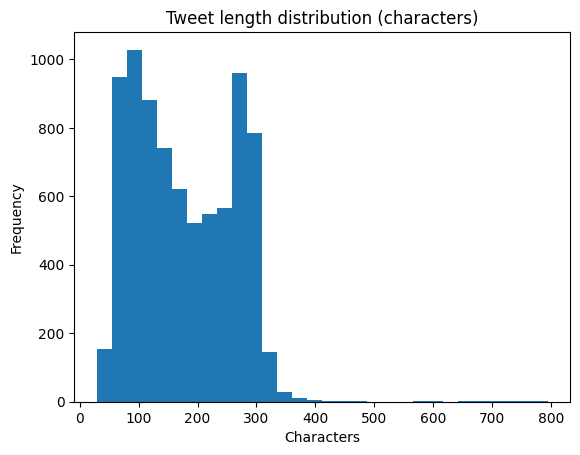

In [17]:
plot_tweet_char_distributions(df_all)

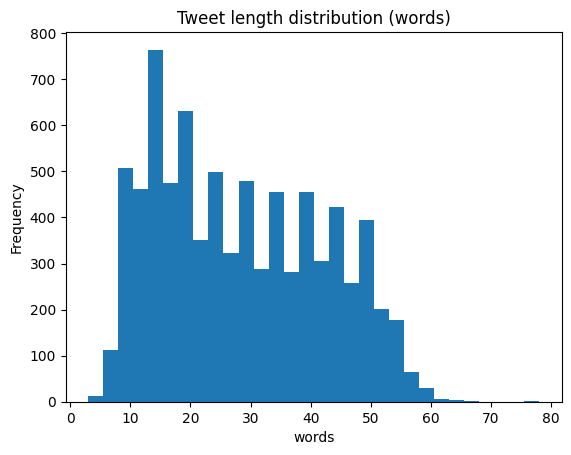

In [18]:
plot_tweet_word_distributions(df_all)

We examined the distribution of ground truth labels for both classification tasks to assess class balance.

*   **Task 1 (Binary Classification):** The dataset shows a relatively balanced distribution between the two classes, with approximately **25,000 instances labeled as 'NO'** (non-sexist) and **22,000 instances labeled as 'YES'** (sexist).
*   **Task 2 (Multi-class Classification):** The distribution is dominated by the non-sexist class (`-`), which corresponds to the 'NO' label in Task 1.
    *   *Note on Anomalies:* The visualization revealed the presence of unexpected `UNKNOWN` labels. These represent instances where annotators could not agree or the label was missing. As per the preprocessing pipeline described earlier, these instances are excluded from the final training set to ensure data quality.

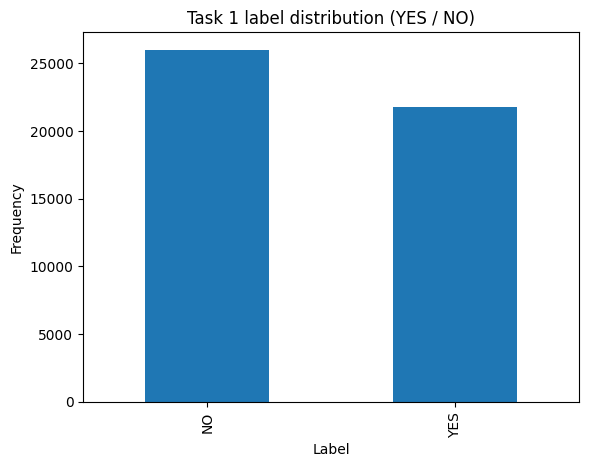

In [19]:
plot_task1_distribution(df_all)

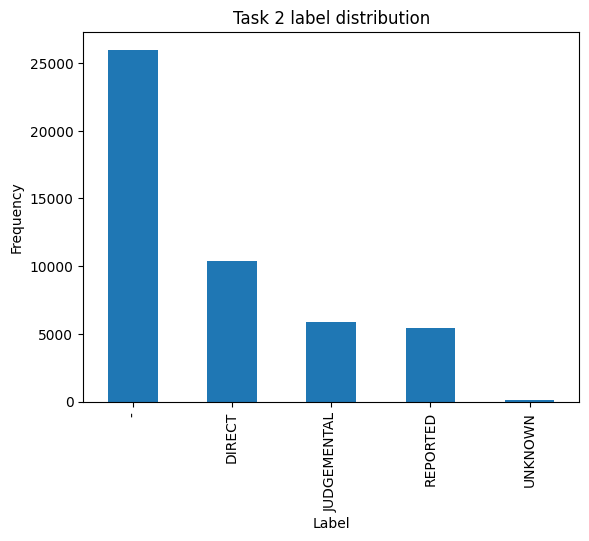

In [20]:
plot_task2_distribution(df_all)

Understanding the demographic profile of the annotators is crucial for detecting potential biases in the labeling process, especially for subjective tasks like sexism detection.

The analysis of the `gender_annotators` and `age_annotators` columns reveals a **remarkably uniform distribution** across both gender and age groups. This balance suggests that the dataset curators made a concerted effort to diversify the pool of annotators, thereby mitigating the risk of demographic bias influencing the ground truth labels.

Total unique annotators: 809


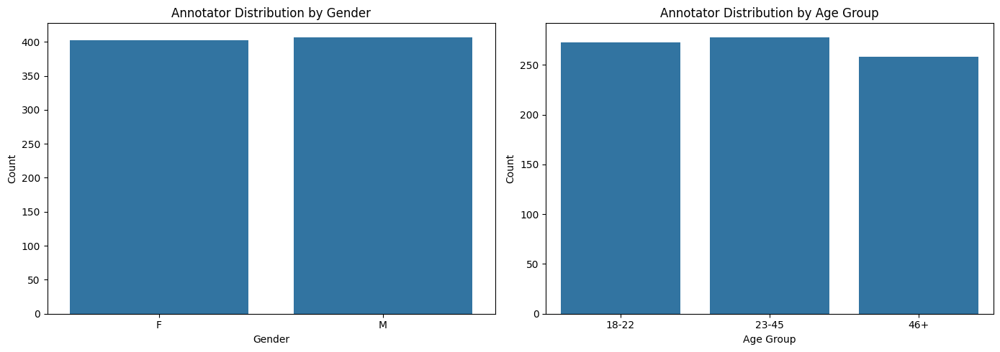

In [21]:
plot_annotator_demographics(df_all)

Finally, we evaluate the consistency of the labels assigned by different annotators for each tweet. To do this, we calculate an **Agreement Score** for every row in the `labels_task2` column.

The score is calculated using a normalized consensus metric:

$$ Score = \frac{C_{max} - 1}{N - 1} $$

Where:
* $C_{max}$ is the count of the most frequent label (majority vote).
* $N$ is the total number of annotators for that tweet.

**Interpretation:**

* **1.0:** Perfect Agreement (Unanimity). All annotators selected the same label.
* **0.0:** Complete Disagreement. Every annotator selected a different label.
* **Intermediate Values:** Partial agreement (e.g., 2 out of 3 annotators agree).

The distribution plot below helps us understand the overall quality of the dataset. As we can see, most of the tweet are above 0.4 agreement score meaning at least 4 equal votes.

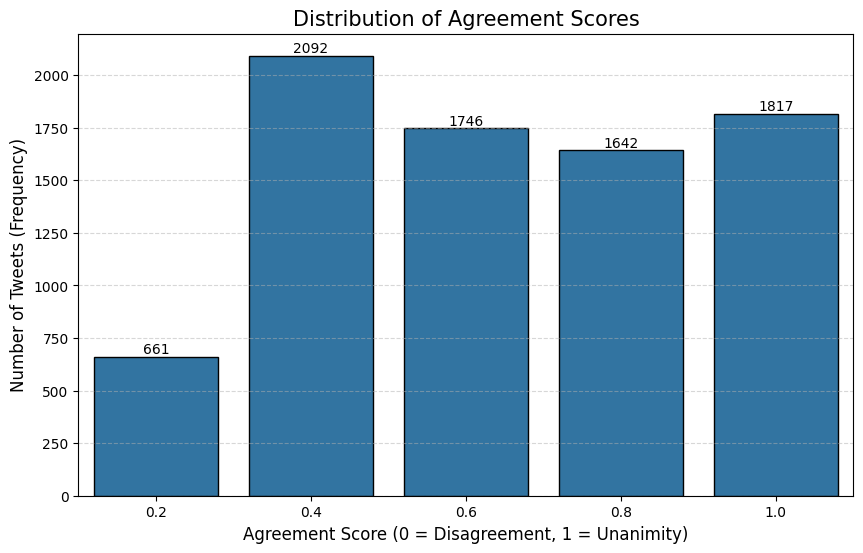

In [22]:
plot_agreement_histogram(df_all)

## 1.3 Splitting and Label Aggregation

We implemented a robust data loading pipeline to handle the JSON source files. The `split_dataset` function verifies the presence of the required files (`training.json`, `validation.json`, `test.json`) and loads them into separate pandas DataFrames.

This explicit file-based separation strategy was necessary because the initial raw data schema only provided a clear distinction between **TRAIN** and **DEV** splits. Consequently, relying on the specific source files was the only reliable method to correctly isolate the **TEST** set and preserve the integrity of the evaluation benchmarks.

Subsequently, the `process_task2_labels` function addresses the label aggregation for Task 2. This critical step involves:
1.  **Filtering:** Iterating through the annotator lists and removing any `'UNKNOWN'` entries, as these are not informative for training.
2.  **Majority Voting:** Applying a majority vote mechanism on the cleaned lists to determine the ground truth label for each tweet.
3.  **Pruning:** Discarding any instances where a clear majority could not be reached (ties) or where all annotations were removed (empty lists).

Finally, `summarize_splits` provides a concise statistical overview of each dataset split, ensuring data integrity before proceeding to the modeling phase.

In [23]:
train_df, dev_df, test_df  = split_dataset(path)

samples_train_before = train_df.shape[0]
samples_dev_before = dev_df.shape[0]
samples_test_before = test_df.shape[0]


summarize_splits(train_df, dev_df, test_df)

DATASET: TRAIN
Shape: 6920 rows  |  11 columns

Columns:
   - id_EXIST
   - lang
   - tweet
   - number_annotators
   - annotators
   - gender_annotators
   - age_annotators
   - labels_task1
   - labels_task2
   - labels_task3
   - split

Missing values per column:
id_EXIST             0
lang                 0
tweet                0
number_annotators    0
annotators           0
gender_annotators    0
age_annotators       0
labels_task1         0
labels_task2         0
labels_task3         0
split                0
dtype: int64 

Language distribution:
lang
es    3660
en    3260
Name: count, dtype: int64 

Average tweet length: 176.71 characters

Example entries:
100001    @TheChiflis Ignora al otro, es un capullo.El p...
100002    @ultimonomada_ Si comicsgate se parece en algo...
100003    @Steven2897 Lee sobre Gamergate, y como eso ha...
Name: tweet, dtype: object 

DATASET: DEV / VALIDATION
Shape: 726 rows  |  11 columns

Columns:
   - id_EXIST
   - lang
   - tweet
   - number_annota

Aggregating labels by majority vote. Items without a clear majority will be removed from the dataset.

In [24]:
train_df_en_es = process_task2_labels(train_df)
dev_df_en_es = process_task2_labels(dev_df)
test_df_en_es = process_task2_labels(test_df)

print(f"Samples w/o a clear majority in train: {samples_train_before-train_df_en_es.shape[0]}")
print(f"Samples w/o a clear majority in validation: {samples_dev_before - dev_df_en_es.shape[0]}")
print(f"Samples w/o a clear majority in test: {samples_test_before - test_df_en_es.shape[0]}")

Samples w/o a clear majority in train: 856
Samples w/o a clear majority in validation: 96
Samples w/o a clear majority in test: 32


## 1.4 Filtering English Language

Following the preprocessing phase, we applied a language filter to retain only English tweets (`lang == 'en'`), ensuring linguistic consistency for the subsequent NLP tasks.

We then visualized the composition of the resulting dataset across the standard splits. The pie chart below illustrates the proportion of samples allocated to the **Train**, **Dev** (Validation), and **Test** sets.

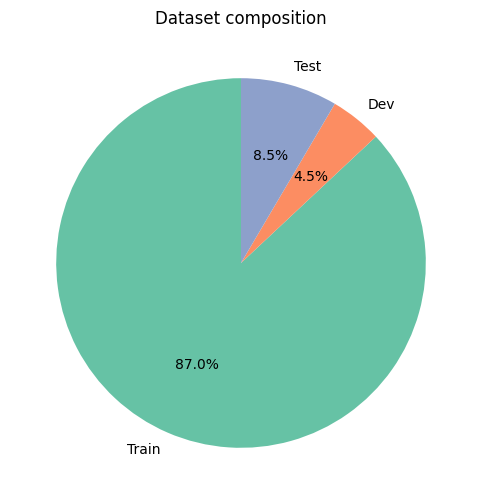

Train: 2,873 samples 
Dev: 150 samples 
Test: 280 samples


In [25]:
train_df = filter_english(train_df_en_es)
dev_df = filter_english(dev_df_en_es)
test_df = filter_english(test_df_en_es)

plot_dataset_pie(train_df, dev_df, test_df)

print(f"Train: {len(train_df):,} samples \nDev: {len(dev_df):,} samples \nTest: {len(test_df):,} samples")


## 1.5 Removing unwanted Colums

To streamline the dataset for the training process, we implemented the `filter_columns` function. This step reduces the dimensionality of the dataframe by discarding auxiliary metadata not strictly required for the classification task.

The final dataset retains only the following four essential columns:
*   `id_EXIST`: The unique identifier for each sample.
*   `lang`: The language code (used for filtering).
*   `tweet`: The raw text content to be analyzed.
*   `label`: The ground truth target variable derived from the majority voting process.

In [26]:
train_df = filter_columns(train_df)
dev_df = filter_columns(dev_df)
test_df = filter_columns(test_df)

print(f"Train shape: {train_df.shape} \nDev shape: {dev_df.shape} \nTest shape: {test_df.shape}")

Train shape: (2873, 4) 
Dev shape: (150, 4) 
Test shape: (280, 4)


## 1.6 Encoding the Labels

To prepare the dataset for the machine learning pipeline, we implemented the `encode_label` function. This step performs categorical encoding, transforming the textual class labels into a numerical format required for the computation of the loss function during model training.

The encoding schema was defined as follows:
*   **`-` (Non-sexist)** $\rightarrow$ `0`
*   **`DIRECT`** $\rightarrow$ `1`
*   **`JUDGEMENTAL`** $\rightarrow$ `2`
*   **`REPORTED`** $\rightarrow$ `3`


In [27]:
train_df_original = encode_label(train_df, mapping)
dev_df_original = encode_label(dev_df, mapping)
test_df_original = encode_label(test_df, mapping)

## 1.7 Structural Analysis and EDA

The comprehensive Exploratory Data Analysis (EDA) conducted in this section confirms that the dataset is robust and well-structured for the subsequent modeling phases. The rigorous preprocessing pipeline with label aggregation via majority voting, language filtering, and stratified splitting has yielded a consistent experimental setup. Specifically, the visualization metrics demonstrate that the class priors and sequence length distributions are preserved across the Train, Validation, and Test sets, eliminating the risk of distribution shift bias. Furthermore, the demographic analysis of the annotators and the inspection of conditional text lengths provide a layer of interpretability, ensuring that the ground truth is statistically reliable and that trivial heuristic features (such as sentence length) do not dominate the classification logic.

### 1.7.1 Labels Distribution per Split

We employed the `plot_label_distribution` function to verify the integrity of the dataset partitioning. A crucial requirement for reliable machine learning evaluation is that the Validation and Test sets must be statistically representative of the Training set.

**Observation:** The resulting bar chart demonstrates that the **class proportions are strictly preserved across all three splits** (Train, Validation, and Test). This confirms that the splitting strategy was stratified correctly, ensuring that the model is evaluated on a distribution that mirrors the training conditions.

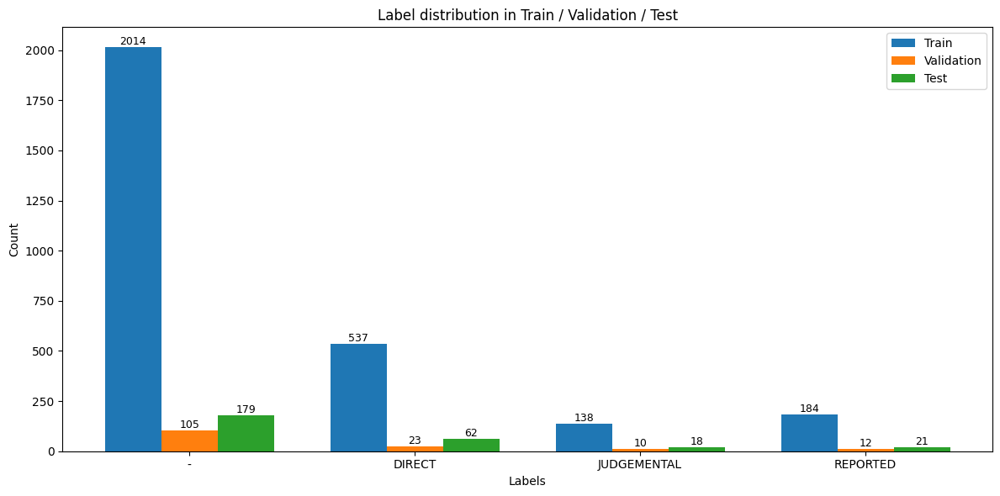

In [28]:
plot_label_distribution(train_df_original, dev_df_original, test_df_original, mapping=mapping_inverse)

### 1.7.2 Cross-Split Sequence Length Comparison

To detect potential distribution shifts between the training and evaluation data, we compared the tweet lengths (in terms of both token count and character count) across the splits using `plot_tweet_length_analysis`.

**Observation:** The normalized histograms reveal a **high degree of alignment** between the Train, Validation, and Test distributions. The absence of significant deviations suggests that the model will not encounter a "length bias" or out-of-distribution sequence lengths during the inference phase on the test set.

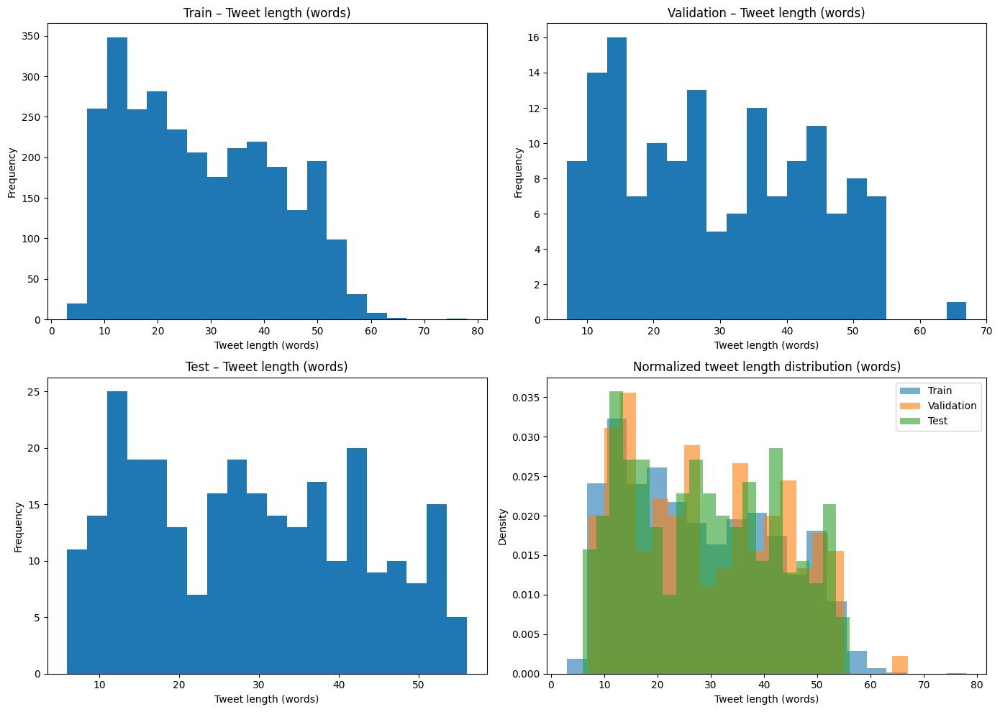

In [29]:
plot_tweet_length_analysis(train_df_original, dev_df_original, test_df_original, mode="words")

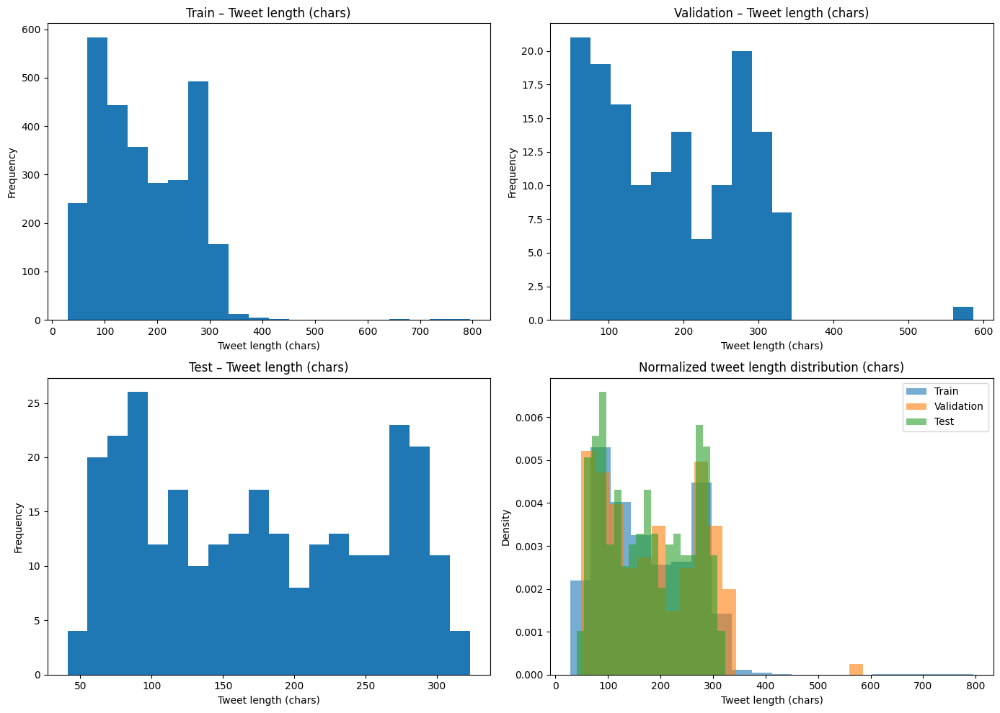

In [30]:
plot_tweet_length_analysis(train_df_original, dev_df_original, test_df_original, mode="chars")

### 1.7.3 Conditional Length Analysis by Class

Finally, we investigated the relationship between text length and the target categories using `plot_tweet_length_by_class_with_density`. This analysis aims to determine if sequence length acts as a latent feature that distinguishes specific classes (e.g., distinguishing complex "Reported" speech from shorter "Direct" attacks).

**Observation:**
The density plots allow us to inspect the overlap between classes. A significant overlap in the density curves indicates that **text length is not a trivial discriminator** for the classes, forcing the model to rely on semantic content rather than heuristic features like sentence length.

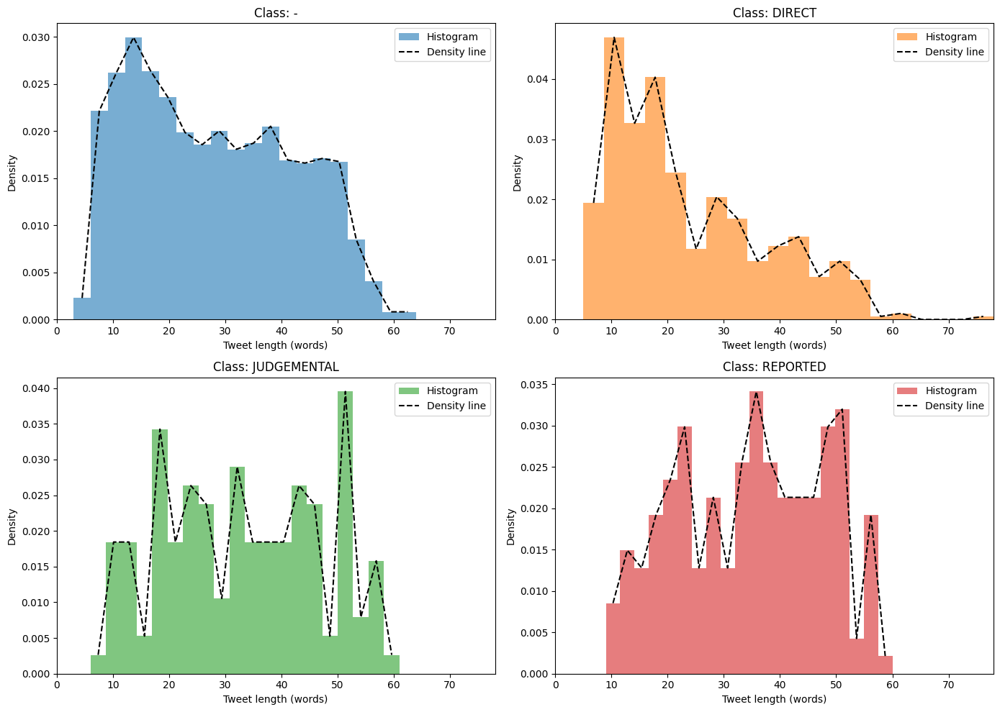

In [31]:
plot_tweet_length_by_class_with_density(train_df_original, 'label', mapping_inverse, mode='words')


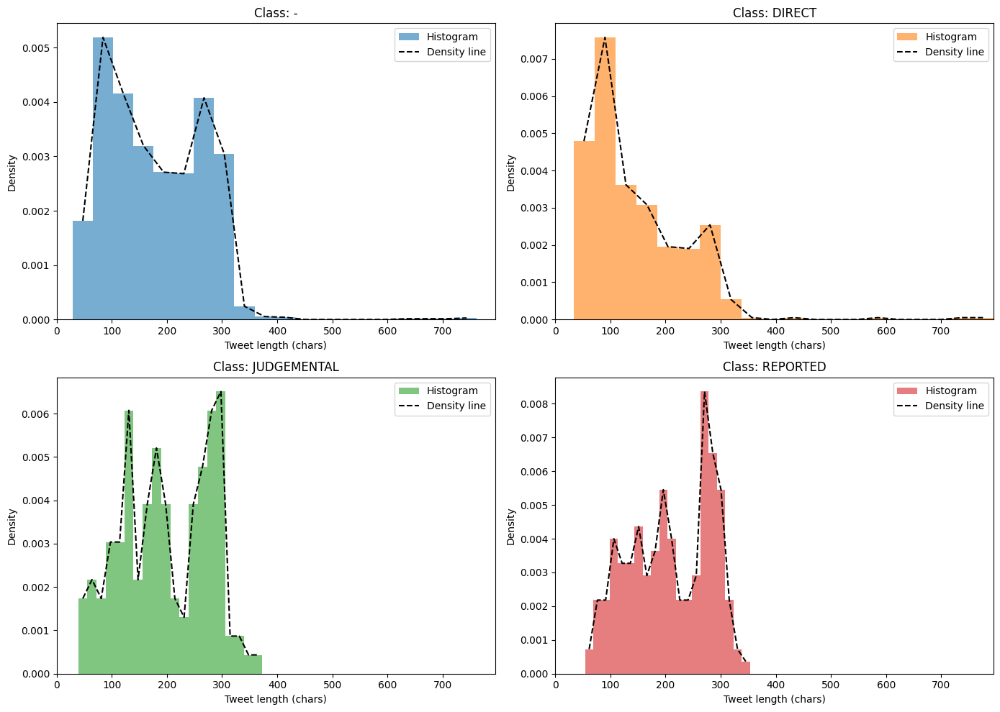

In [32]:
plot_tweet_length_by_class_with_density(train_df_original, 'label', mapping_inverse, mode='chars')

# [Task2 - 0.5 points] Data Cleaning

To ensure that the textual input is clean, standardized, and ready for embedding generation, we implemented a comprehensive preprocessing pipeline encapsulated in the `clean_tweets` function. Given the noisy nature of social media text (e.g., emojis, hashtags, mentions), this step is critical for reducing vocabulary sparsity and focusing the model's attention on semantic content.

The pipeline applies a sequential set of transformations to each tweet:
1.  **Noise Removal:** Specifically targeting non-linguistic elements such as emojis, hashtags (`#tag`), user mentions (`@user`), and URLs. We also strip special characters and standardize punctuation (e.g., removing curly quotes).
2.  **Case Normalization:** Converting all text to lowercase to treat "Sexism" and "sexism" as identical tokens.
3.  **Lemmatization:** Reducing words to their base or dictionary form (lemma).

***Lemmatization Strategy***

A key feature of our preprocessing is the support for **POS-aware Lemmatization** (Part-of-Speech aware). Standard lemmatization often treats every word as a noun (e.g., "meeting" might remain "meeting"). However, by first applying POS tagging, we can inform the `WordNetLemmatizer` of the word's grammatical role (verb, adjective, noun).

*   **Without POS:** The lemmatizer defaults to treating words as nouns.
*   **With POS (Selected Strategy):** We dynamically map NLTK POS tags to WordNet tags. This allows for more accurate reductions, such as converting "meeting" (verb) $\rightarrow$ "meet", while keeping "meeting" (noun) intact where appropriate.

We applied this `pos_aware=True` strategy to all dataset splits (Train, Validation, Test) to maximize lexical consistency. The table below (`examples_df`) showcases specific examples of how each transformation modifies the raw text.


In [33]:
train_df, examples_df = clean_tweets(train_df_original, show_examples=True, pos_aware=True)
test_df, _ = clean_tweets(test_df_original, show_examples=False, pos_aware=True)
val_df, _ = clean_tweets(dev_df_original, show_examples=False, pos_aware=True)

pd.set_option('display.max_colwidth', None)
examples_df

,Transformation,Before,After
0,Remove Emojis,"Writing a uni essay in my local pub with a coffee. Random old man keeps asking me drunk questions when I'm trying to concentrate &amp; ends with ""good luck, but you'll just end up getting married and not use it anyway"". #EverydaySexism is alive and well 🙃","Writing a uni essay in my local pub with a coffee. Random old man keeps asking me drunk questions when I'm trying to concentrate &amp; ends with ""good luck, but you'll just end up getting married and not use it anyway"". #EverydaySexism is alive and well"
1,Remove Hashtags,@UniversalORL it is 2021 not 1921. I dont appreciate that on two rides by myself your team member looked behind me and asked the man behind how many in my party. Not impressed #everydaysexism,@UniversalORL it is 2021 not 1921. I dont appreciate that on two rides by myself your team member looked behind me and asked the man behind how many in my party. Not impressed
2,Remove Mentions,"@GMB this is unacceptable. Use her title as you did for all the men interviewed. She is, in fact, senior to Angus #everydaysexism @TheWomensOrg https://t.co/JZF3a5E4eX","this is unacceptable. Use her title as you did for all the men interviewed. She is, in fact, senior to Angus #everydaysexism https://t.co/JZF3a5E4eX"
3,Remove URLs,"FFS! How about laying the blame on the bastard who murdered her? Novel idea, I know. https://t.co/GI5B45THvJ","FFS! How about laying the blame on the bastard who murdered her? Novel idea, I know."
4,Remove Curly Quotes,‘Making yourself a harder target’ basically boils down to ‘make sure they target someone else’ 🙃 https://t.co/VOpu09YAj6,Making yourself a harder target basically boils down to make sure they target someone else 🙃 https://t.co/VOpu09YAj6
5,Remove Special Characters,"According to a customer I have plenty of time to go spent the Stirling coins he wants to pay me with, in Derry. ""Just like any other woman, I'm sure of it."" #EveryDaySexism in retail.",According to a customer I have plenty of time to go spent the Stirling coins he wants to pay me with in Derry Just like any other woman Im sure of it EveryDaySexism in retail
6,Lemmatization,"So only 'blokes' drink beer? Sorry, but if you aren't a 'bloke' you drink wine apparently....... #EverydaySexism alive and well in @HayesAmbleside @MelissaCole @Shinybiscuit https://t.co/AP4GeusmOX","so only ' bloke ' drink beer ? sorry , but if you aren ' t a ' bloke ' you drink wine apparently ....... # everydaysexism alive and well in @ hayesambleside @ melissacole @ shinybiscuit http :// t . co / ap4geusmox"


# [Task 3 - 0.5 points] Text Encoding

**Text Encoding and Embedding Strategy**

In order to train a neural sexism classifier, the raw textual data must first be transformed into numerical vector representations. We adopted **GloVe (Global Vectors for Word Representation)** as our pre-trained embedding model to leverage existing semantic knowledge.

**Vocabulary Construction and OOV Handling**

A critical challenge in text encoding is handling **Out-Of-Vocabulary (OOV)** words present in our dataset but missing from the pre-trained GloVe model. Our vocabulary construction strategy strictly follows these guidelines:
1.  **Training Set Coverage:** All unique tokens found in the training set are explicitly added to our vocabulary.
2.  **Validation/Test Handling:** Tokens that appear *only* in the validation or test sets (and are not in the training vocabulary) are mapped to a special `<UNK>` token with a static embedding.

**OOV Embedding Strategies**

To assign vector representations to the OOV tokens found in the training set, we implemented and experimented with two distinct strategies:

1.  **Random Initialization:** A baseline approach where OOV tokens are assigned a random static embedding sampled from a uniform distribution ($U[-0.05, 0.05]$).
2.  **Context-Aware Initialization:** An advanced strategy where the embedding for an OOV token is derived by averaging the GloVe embeddings of its surrounding context words (neighbors within a window $k$). This allows the model to infer a semantic approximation based on how the word is used in the corpus.

For the primary model training described in the following sections, we utilized the **Random Initialization** strategy as it provided robust baseline performance. However, we also conducted specific experiments comparing it against the **Context-Aware** matrix to evaluate if semantic initialization yields better convergence or accuracy (results discussed in the final section).


## 3.1 Building Vocabulary

The first step in our encoding pipeline is the construction of a ***deterministic*** vocabulary using the `build_vocab` function. To strictly adhere to machine learning best practices and prevent **data leakage**, the vocabulary is built exclusively from the tokens found in the **Training set**.

The process involves:
1.  **Tokenization:** We use a `WhitespaceTokenizer` to split the text into tokens.
2.  **Special Token Initialization:** We reserve ID `0` for `<PAD>` (padding) and ID `1` for `<UNK>` (unknown words), ensuring that the model can handle variable length sequences and out-of-vocabulary terms during inference.
3.  **Deterministic Indexing:** All unique tokens from the training corpus are sorted alphabetically before being assigned an ID. This sorting step guarantees that the vocabulary index remains identical across different runs of the notebook.

Finally, the `evaluate_vocabulary` function performs sanity checks to verify the integrity of the mapping (bijectivity between tokens and IDs) and confirms the deterministic nature of the generation process by comparing two independent executions.

In [34]:
token2id, id2token, word_listing = build_vocab(train_df)
print(f'\n\n[Debug] Word -> Index vocabulary size: {len(token2id)}')
print(f'[Debug] Index -> Word vocabulary size: {len(id2token)}')

print(f'[Debug] Some words: {list(token2id.items())[1000:1010]}')

100%|██████████| 2873/2873 [00:00<00:00, 17184.48it/s]




[Debug] Word -> Index vocabulary size: 9870
[Debug] Index -> Word vocabulary size: 9870
[Debug] Some words: [('balise', 1000), ('balk', 1001), ('ball', 1002), ('ballsthats', 1003), ('ban', 1004), ('band', 1005), ('bandit', 1006), ('bang', 1007), ('banger', 1008), ('banknote', 1009)]


In [35]:
print("Vocabulary evaluation...")
evaluate_vocabulary(id2token, token2id, word_listing, train_df)
print("\nEvaluation completed!")

Vocabulary evaluation...


100%|██████████| 2873/2873 [00:00<00:00, 18730.39it/s]



Evaluation completed!


## 3.2 GloVe Embedding

The core of our text encoding strategy is implemented in the `build_embedding_matrix` function, which maps each vocabulary token to a dense vector representation. This function serves as a unified interface to initialize the embedding layer, supporting both standard GloVe lookup and advanced handling for OOV tokens.

The function operates based on the `oov_strategy` parameter:

1.  **Standard GloVe Initialization:** For any token present in the pre-trained GloVe model, the corresponding vector is directly retrieved and assigned to the matrix row.
2.  **`"random"` Strategy (Baseline):** If a token is OOV, it is initialized with a static random vector sampled from a uniform distribution ($U[-0.05, 0.05]$). This serves as a standard baseline where the model must learn the semantic meaning of the OOV term from scratch during training.
3.  **`"context"` Strategy (Advanced):** This method attempts to infer a semantic starting point for OOV tokens. It scans the training corpus, identifies the context window (neighbors within distance $k$) for each OOV word, and initializes its embedding as the average vector of its known neighbors. If an OOV word appears in contexts with no known neighbors, it falls back to random initialization.

Finally, the special `<UNK>` token (used for words seen only in validation/test) is always assigned a fixed random embedding to provide a neutral default representation.


In [36]:
embedding_dimension = 100

download_path = "glove-wiki-gigaword-{}".format(embedding_dimension)

GloVe_embedder = gloader.load(download_path)


[==================================================] 100.0% 128.1/128.1MB downloaded


In [37]:
embedding_matrix_random = build_embedding_matrix(GloVe_embedder, embedding_dimension, token2id, oov_strategy='random',
                                                 seed = 42)
print(f"Embedding matrix shape: {embedding_matrix_random.shape}")

Embedding matrix shape: (9870, 100)


## 3.3 OOV Analysis and Coverage Verification

Before constructing the final embedding matrix, it is crucial to quantify the alignment between our dataset's vocabulary and the pre-trained GloVe model. The `check_OOV_terms` function performs this diagnostic step by computing the set difference between the training vocabulary and the GloVe key space.

This analysis allows us to:
1.  **Quantify Vocabulary Coverage:** Determine the percentage of domain-specific terms (e.g., slang, misspellings, neologisms) that are missing from the pre-trained model.
2.  **Inspect OOV Terms:** Qualitatively assess the missing tokens to understand if they carry significant semantic weight (which might justify the use of the "context" initialization strategy) or if they are primarily noise.


In [38]:
oov_terms = check_OOV_terms(GloVe_embedder, word_listing)
oov_percentage = float(len(oov_terms)) * 100 / len(word_listing)

print(f"Total OOV terms: {len(oov_terms)} ({oov_percentage:.2f}%)")
print(f"Some OOV terms: {oov_terms[10:20]}")

Total OOV terms: 1840 (18.64%)
Some OOV terms: ['menwomen', 'feminismpapism', 'ikr', 'trilogywe', 'rapperradio', 'masqurading', 'empoweredpink', 'nuancebecause', 'outsidemoulana', 'jeonghan']


## 3.4 Embeddig Visualization

To qualitatively assess the quality of the generated embedding matrix and specifically to inspect how our OOV initialization strategies behave we implemented a flexible visualization pipeline. Since the embeddings reside in a high-dimensional space, we employ dimensionality reduction techniques to project them into lower-dimensional spaces (2D or 3D) for inspection.

The pipeline (`run_visualization`) supports dynamic projection using two primary methods:
1.  **SVD (Singular Value Decomposition):** A linear method that preserves global variance structure.
2.  **UMAP (Uniform Manifold Approximation and Projection):** A non-linear manifold learning technique that is particularly effective at preserving local neighborhood structures (clustering).


We executed the visualization targeting two specific groups of words to verify semantic coherence:

1.  **Semantic Clusters (Known Words):** We highlighted positive sentiment words such as `'good'`, `'love'`, and `'beautiful'`. As expected, these terms are projected in close proximity to each other in the vector space, confirming that the pre-trained GloVe structure effectively captures their semantic similarity.

2.  **OOV Initialization Behavior:** We also inspected specific Out-Of-Vocabulary terms like `'kendis'`, `'pregnantbc'`, and `'offuse'`.
    *   **In SVD projections**, these points nearly coincide, reflecting their shared statistical initialization properties.
    *   **In UMAP projections**, they form a distinct, tight cluster separate from the main semantic manifold. This indicates that while they lack specific semantic nuance (due to random or heuristic initialization), they are consistently handled as a coherent group of "unknown" entities, preventing them from randomly polluting established semantic clusters.


In [46]:
word_to_visualize = ['good', 'love', 'beautiful'] + random.sample(oov_terms, 3)

Running SVD reduction to 2D...
Annotating words in 2D: ['good', 'love', 'beautiful', 'johnleemushr', 'finna', 'resultus']


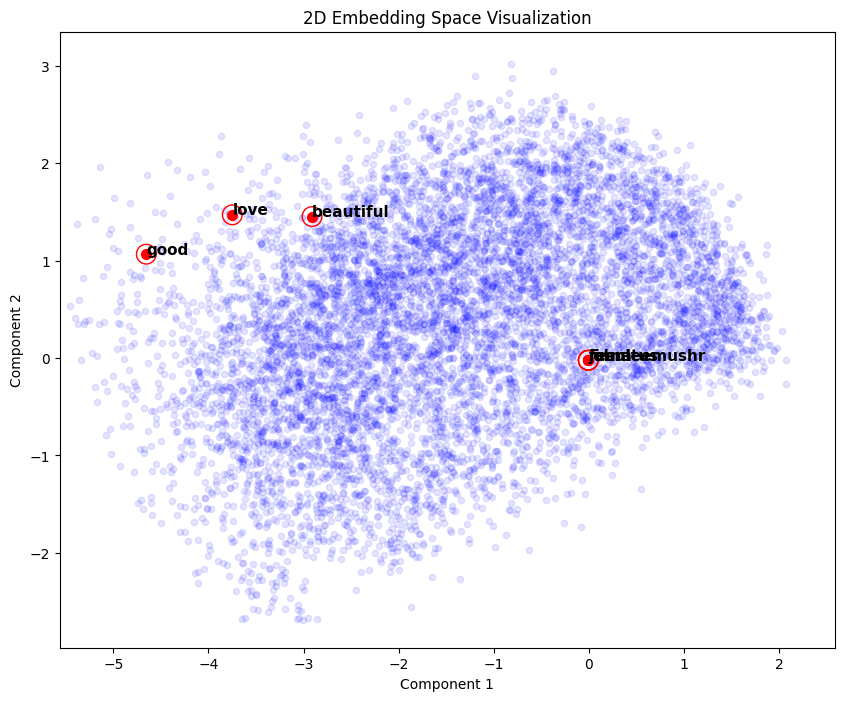

In [47]:
run_visualization('svd',  word_to_visualize, token2id, embedding_matrix_random, 2)

Running UMAP reduction to 2D...
Annotating words in 2D: ['good', 'love', 'beautiful', 'johnleemushr', 'finna', 'resultus']


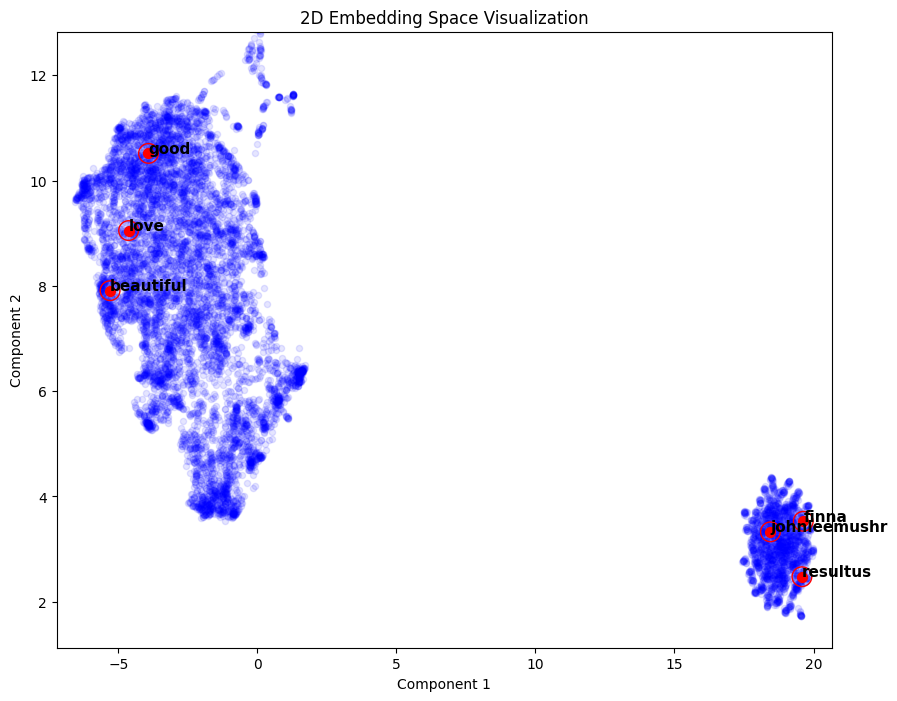

In [48]:
run_visualization('umap',  word_to_visualize, token2id, embedding_matrix_random, 2)

Running SVD reduction to 3D...
Annotating words in 3D: ['good', 'love', 'beautiful', 'johnleemushr', 'finna', 'resultus']


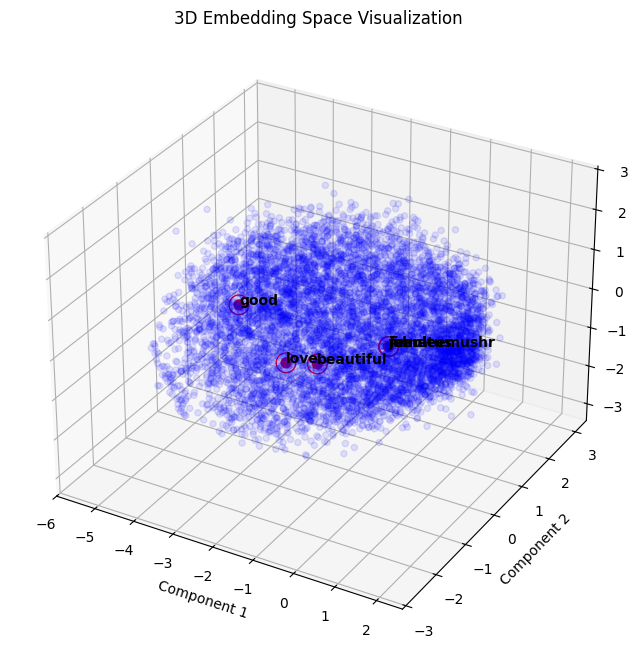

In [49]:
run_visualization('svd',  word_to_visualize, token2id, embedding_matrix_random, 3)

Running UMAP reduction to 3D...
Annotating words in 3D: ['good', 'love', 'beautiful', 'johnleemushr', 'finna', 'resultus']


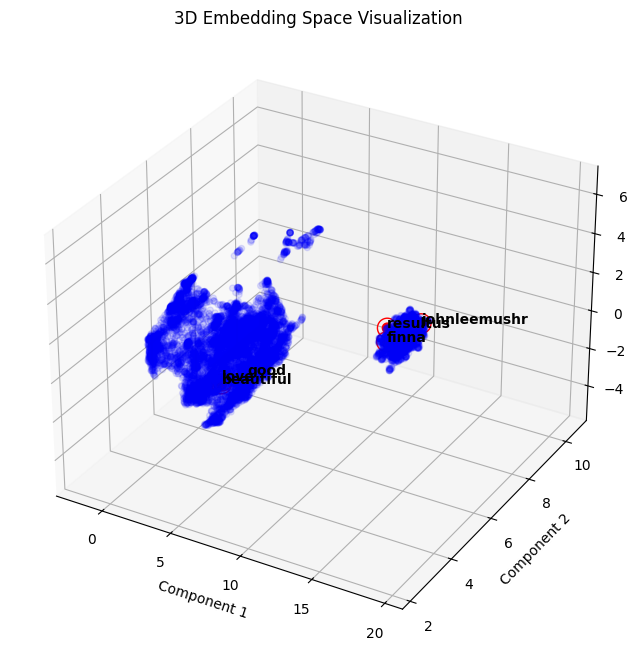

In [50]:
run_visualization('umap',  word_to_visualize, token2id, embedding_matrix_random, 3)

## 3.5 Analogies, Bias, Synonyms and Antonyms

### Semantic Analysis and Bias Evaluation

Following the construction of the embedding matrix, we conducted a series of qualitative tests to probe the semantic properties of the vector space. Since word embeddings are designed to capture relationships based on distributional hypothesis (words appearing in similar contexts share similar meanings), these tests verify whether our matrix effectively encodes linguistic regularities such as synonymy, analogy, and gender associations.

This section is divided into three analytical components:
1.  **Semantic Similarity & Analogies:** Testing the model's ability to retrieve synonyms and solve relational tasks (e.g., "A is to B as C is to ?").
2.  **Visualization of Relationships:** Using heatmaps to inspect the cosine similarity structure among selected word groups.
3.  **Bias Detection:** Quantifying potential gender biases encoded in the embeddings, a critical step for a task sensitive to sexism.

### 3.5.1 Vector Arithmetic and Nearest Neighbors

We implemented two fundamental utility functions to interact with the embedding space:
*   `print_top_similar`: This function performs a nearest-neighbor search using cosine similarity. Given a target word, it retrieves the top-$N$ words with the smallest angular distance in the vector space, effectively identifying synonyms or semantically related concepts.
*   `print_analogy`: This function tests the vector arithmetic capabilities of the embeddings by solving standard analogy tasks of the form $A : B :: C : ?$. It computes the target vector $\vec{d} = \vec{b} - \vec{a} + \vec{c}$ and finds the nearest vocaulary token to $\vec{d}$.


In [ ]:
print_top_similar(embedding_matrix_random, token2id, id2token, "mom", 10)

Top 10 words similar to 'mom':
  dad : 0.863
  grandmother : 0.756
  mother : 0.739
  aunt : 0.736
  kid : 0.723
  daddy : 0.722
  girl : 0.720
  baby : 0.699
  my : 0.696
  grandma : 0.692


In [ ]:
print_analogy(embedding_matrix_random, token2id, id2token, "king", "queen", "man")
print_analogy(embedding_matrix_random, token2id, id2token, "engineer", "man", "nurse")

Analogy: king -> queen :: man -> ?
  woman : 0.804
  girl : 0.735
  she : 0.682
  her : 0.659
  mother : 0.654
Analogy: engineer -> man :: nurse -> ?
  woman : 0.754
  girl : 0.727
  boy : 0.690
  child : 0.684
  mother : 0.684


### 3.5.2 Heatmap Visualization of Cosine Similarities

To visualize the pairwise relationships within a specific set of terms, we implemented `similarity_heatmap`. This tool computes a square matrix of cosine similarities for a given list of words and renders it as a color-coded heatmap.

This visualization is particularly useful for detecting semantic clusters. For instance, in the example provided (`"king", "queen", "man", "woman", "nurse", "engineer"`), we expect to observe high similarity scores within gender-related pairs and potentially distinct blocks for professions versus royalty terms.

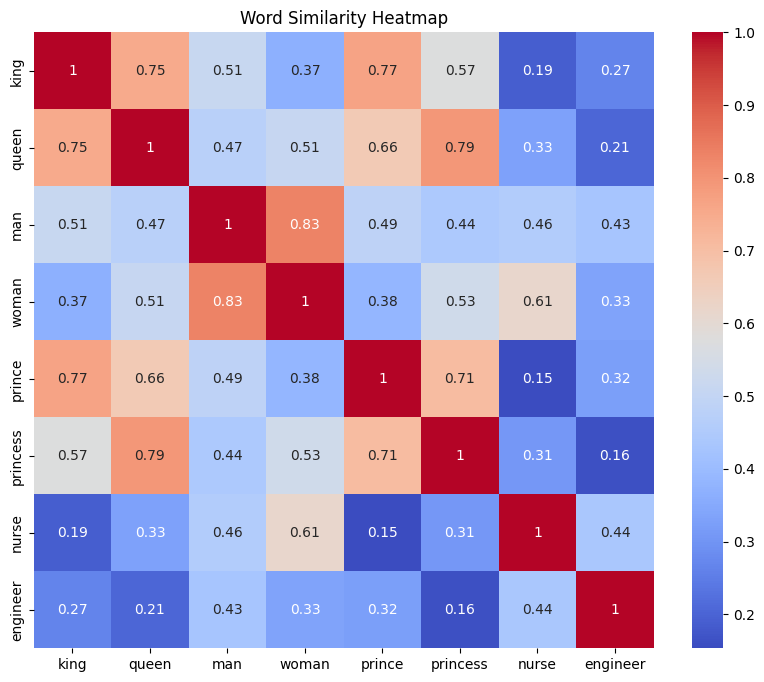

In [ ]:
words = ["king", "queen", "man", "woman", "prince", "princess", "nurse", "engineer"]
similarity_heatmap(embedding_matrix_random, token2id, words)

### 3.5.3 Quantifying Gender Bias in Embeddings

Given the nature of our task (Sexism Detection), it is imperative to investigate if the underlying word embeddings contain stereotypical biases. Pre-trained models like GloVe often reflect historical biases present in their training corpora.

We implemented two functions to measure this phenomenon:
*   `gender_bias_score`: Calculates the relative proximity of a target word (e.g., a profession) to a set of male versus female attribute words. A significant difference in similarity indicates a gendered association.
*   `group_bias_scores`: Generalizes this approach by computing the cosine similarity of a list of target words against the centroid of a specific attribute group (e.g., "female terms").

This analysis helps identify if neutral terms (like "nurse" or "engineer") are disproportionately aligned with a specific gender in the vector space, which could propagate bias into the downstream classification model.

In [ ]:
gender_bias_score(GloVe_embedder, "nurse")
gender_bias_score(GloVe_embedder, "engineer")


Word: nurse
  Male similarity avg: 0.418
  Female similarity avg: 0.569
Word: engineer
  Male similarity avg: 0.424
  Female similarity avg: 0.334


In [ ]:
ethnic_groups = ["black", "white", "asian", "african", "european",
                "latino", "hispanic", "arab", "muslim", "jewish"]

positive_words = ["good", "honest", "intelligent", "peaceful", "lawful"]
negative_words = ["bad", "violent", "criminal", "lazy", "terrorist"]

# Positive Bias
df_pos_bias = group_bias_scores(embedding_matrix_random, token2id, ethnic_groups, positive_words, col_name="Positive Association")

# Negative Bias
df_neg_bias = group_bias_scores(embedding_matrix_random, token2id, ethnic_groups, negative_words, col_name="Negative Association")

print("=== Ethnic Groups vs Positive Concepts ===")
display(df_pos_bias)

print("\n=== Ethnic Groups vs Negative Concepts ===")
display(df_neg_bias)

=== Ethnic Groups vs Positive Concepts ===


,Target Word,Positive Association
0,white,0.380715
1,black,0.368187
2,arab,0.355510
3,european,0.349472
4,african,0.346733
5,muslim,0.336910
6,jewish,0.315397
7,asian,0.253275



=== Ethnic Groups vs Negative Concepts ===


,Target Word,Negative Association
0,muslim,0.472921
1,black,0.471038
2,white,0.425888
3,jewish,0.410583
4,arab,0.381681
5,european,0.381416
6,asian,0.349455
7,african,0.327316


# [Task 4 - 1.0 points] Model definition

In this section, we define the neural network architectures and the training strategy. Following the project requirements, we implemented two distinct architectures based on Recurrent Neural Networks (RNNs):
1.  **Baseline Model:** A single Bidirectional LSTM layer followed by a Dense classification layer.
2.  **Stacked Model:** A deeper architecture adding a second Bidirectional LSTM layer to capture more complex dependencies.

#### Embedding Layer Strategy
Instead of pre-calculating static vectors for every input, we incorporated a Keras `Embedding` layer as the first layer of our models.
*   **Initialization:** This layer is initialized with the **embedding matrix** constructed in the previous section (containing GloVe vectors + Random OOV vectors).
*   **Fine-tuning:** Crucially, we set this layer to be **trainable**. This allows the model to fine-tune the pre-trained representations and adapt the OOV embeddings specifically for the task of sexism detection during backpropagation.




## 4.1 Sequence Length Analysis

Neural networks require input sequences of fixed length. To determine the optimal `maxlen` parameter for padding or truncating our tweets, we implemented `compute_optimal_seq_len`.

This function analyzes the statistical distribution of token counts across the training corpus to inform our choice. Selecting a cutoff based on the **95th percentile** (rather than simply taking the absolute maximum) is a robust strategy: it ensures that **95% of the data is preserved entirely intact**, while significantly reducing the computational cost and memory footprint by discarding the extreme outliers (the "long tail") that often contain noise or formatting errors rather than useful semantic content.

In [39]:
stats = compute_optimal_seq_len(train_df["tweet"])   # ONLY training set!

print(f"Optimal Sequence Length Analysis:")
print(f"  - Mean Length:       {stats['mean']:.2f}")
print(f"  - Median Length:     {stats['median']:.2f}")
print(f"  - 95th Percentile:   {stats['95percentile']:.2f}")
print(f"  - Max Length:        {stats['max']:.2f}")

max_len = int(stats['95percentile'])

Optimal Sequence Length Analysis:
  - Mean Length:       25.78
  - Median Length:     24.00
  - 95th Percentile:   49.00
  - Max Length:        62.00


## 4.2 Custom Metrics Tracking

Standard Keras metrics (like Accuracy) are often insufficient for imbalanced datasets or specific shared tasks. Since the primary evaluation metric for this competition is the **Macro F1 Score**, we implemented a custom callback, `MacroF1Logger`.

While Keras computes metrics batch-wise (which can be an approximation), this callback executes at the end of each epoch to compute the **exact global Macro F1 score** on the entire validation set. This allows us to monitor the *true* performance of the model during training and apply Early Stopping based on the metric that actually matters.

Additionally, `LearningRateLogger` tracks the optimizer's learning rate, which can be useful for verifying the behavior of dynamic schedulers.

In [40]:
class MacroF1Logger(tf.keras.callbacks.Callback):
    def __init__(self, train_data, val_data):
        super().__init__()
        self.X_train, self.y_train = train_data
        self.X_val, self.y_val = val_data

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        # Train F1
        y_pred_train = np.argmax(
            self.model.predict(self.X_train, verbose=0), axis=1
        )
        f1_train = f1_score(self.y_train, y_pred_train, average="macro")

        # Validation F1
        y_pred_val = np.argmax(
            self.model.predict(self.X_val, verbose=0), axis=1
        )
        f1_val = f1_score(self.y_val, y_pred_val, average="macro")

        logs["macro_f1"] = f1_train
        logs["val_macro_f1"] = f1_val

class LearningRateLogger(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        optimizer = self.model.optimizer

        # TensorFlow >= 2.9 (learning rate può essere variabile)
        if hasattr(optimizer.learning_rate, "numpy"):
            lr = optimizer.learning_rate.numpy()
        else:
            lr = tf.keras.backend.get_value(optimizer.learning_rate)

        logs["lr"] = lr

## 4.3 Baseline Model Definition

The `build_baseline_with_embedding` function defines our reference architecture. It is a compact Recurrent Neural Network designed to establish a performance baseline using the GloVe-initialized embeddings.

Key components of the architecture:
*   **Input Layer:** Accepts integer sequences of fixed length (`seq_len`).
*   **Embedding Layer:** Initializes with our custom `embedding_matrix`. We enable `mask_zero=True` to instruct the downstream LSTM layers to ignore padding tokens (`<PAD>`), ensuring that zero-padding does not distort the hidden states.
*   **Bi-LSTM Encoder:** A single **Bidirectional LSTM** layer with 128 units. This processes the sequence in both forward and backward directions, concatenating the final hidden states to produce a context-rich representation of the entire tweet.
*   **Classification Head:** A Dense layer with 4 units and `softmax` activation, corresponding to the 4 target classes of Task 2.

In [41]:
def build_baseline_with_embedding(seq_len, embedding_matrix, trainable = False):
    """
    Baseline model using a pretrained embedding layer.
    """

    inputs = layers.Input(shape=(seq_len,), name="input_ids")

    embedding = layers.Embedding(
        input_dim=embedding_matrix.shape[0],
        output_dim=embedding_matrix.shape[1],
        weights=[embedding_matrix],
        mask_zero=True,                 # masks <PAD> tokens automatically
        trainable=trainable,
        name="encoder_embedding"
    )(inputs)

    x = layers.Bidirectional(
        layers.LSTM(128, return_sequences=False)
    )(embedding)

    outputs = layers.Dense(4, activation="softmax")(x)

    model = models.Model(inputs, outputs)
    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model

## 4.4 Stacked Model Definition

The `build_stacked_with_embedding` function defines a deeper variant of our architecture, designed to capture more complex hierarchical dependencies in the text.

The primary architectural enhancement is the addition of a **second recurrent layer**:
1.  **First Bi-LSTM:** This layer is configured with `return_sequences=True`. Instead of outputting a single vector, it outputs the full sequence of hidden states for every time step, effectively transforming the input embeddings into a higher-level contextual sequence.
2.  **Second Bi-LSTM:** This layer consumes the sequence produced by the first layer and condenses it into a single vector representation (`return_sequences=False`), which is then fed into the classifier.

This "stacked" configuration allows the model to learn increasingly abstract features, potentially improving performance on difficult examples where simple keyword matching is insufficient.


In [42]:
def build_stacked_with_embedding(seq_len, embedding_matrix, trainable = False):
    """
    Stacked BiLSTM model using a pretrained embedding layer.
    """

    inputs = layers.Input(shape=(seq_len,), name="input_ids")

    embedding = layers.Embedding(
        input_dim=embedding_matrix.shape[0],
        output_dim=embedding_matrix.shape[1],
        weights=[embedding_matrix],
        mask_zero=True,
        trainable=trainable,            # set True for fine-tuning
        name="encoder_embedding"
    )(inputs)

    # First BiLSTM (returns full sequence)
    x = layers.Bidirectional(
        layers.LSTM(128, return_sequences=True)
    )(embedding)

    # Second BiLSTM
    x = layers.Bidirectional(
        layers.LSTM(128, return_sequences=False)
    )(x)

    outputs = layers.Dense(4, activation="softmax")(x)

    model = models.Model(inputs, outputs)
    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model


# [Task 5 - 1.0 points] Training and Evaluation

To ensure a robust and statistically significant assessment of our models, we adopted a multi-seed evaluation strategy. Neural networks are sensitive to weight initialization and data shuffling; therefore, reporting results from a single run can be misleading.

Our experimental protocol follows these steps:
1.  **Multiple Seeds:** We selected three distinct random seeds to repeat the training process.
2.  **Training:** Both the *Baseline* and *Stacked* models are trained on the training set for each seed.
3.  **Metrics:** We compute Precision, Recall, and Macro F1-score on the validation and test set.
4.  **Aggregation:** We report the mean and standard deviation for each metric to quantify model stability.


## 5.1 Preprocess the Datasets

Before feeding the data into the network, the raw text must be converted into fixed-size integer tensors. The `prepare_dataset` function handles this transformation pipeline:

1.  **Tokenization & Indexing:** Each tweet is tokenized and mapped to integer IDs using `text_to_ids`.
2.  **Strict Vocabulary Usage:** Crucially, the transformation uses the `token2id` vocabulary **constructed solely from the Training set**. Tokens in the Validation or Test sets that were not seen during training are strictly mapped to the `<UNK>` ID. This prevents **data leakage** and simulates a real-world scenario where the model encounters unseen words.
3.  **Padding/Truncating:** The sequences are padded (with zeros) or truncated to the calculated `optimal_seq_len` to ensure uniform input dimensions (`padding="post"`, `truncating="post"`).

In [55]:
X_train_ids, y_train = prepare_dataset(train_df, token2id, max_len)
X_val_ids,   y_val   = prepare_dataset(dev_df, token2id, max_len)
X_test_ids,  y_test  = prepare_dataset(test_df, token2id, max_len)

## 5.2 Baseline with Embedding Layer

### 5.2.1 Model Definition and Summary

In [ ]:
models_baseline_list = []

for _ in seeds:
    models_baseline_list.append(build_baseline_with_embedding(max_len, embedding_matrix=embedding_matrix_random, trainable = True))

models_baseline_list[0].summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_ids           │ (None, 49)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_embedding   │ (None, 49, 100)   │    987,000 │ input_ids[0][0]   │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal           │ (None, 49)        │          0 │ input_ids[0][0]   │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional       │ (None, 256)       │    234,496 │ encoder_embeddin… │
│ (Bidirectional)     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 4)         │      1,028 │ bidirectional[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,222,524 (4.66 MB)

 Trainable params: 1,222,524 (4.66 MB)

 Non-trainable params: 0 (0.00 B)

### 5.2.2 Model Restoration

The `load_model_weights` allows us to re-hydrate a compiled model architecture with the specific set of weights saved from disk.

Run only if you have some weigts avaiable.

In [ ]:
if not train_notebook:
    for i in range(len(seeds)):
        path = f"/content/drive/MyDrive/Weights-1/Baseline_{i+1}.weights.h5"
        load_model_weights(models_baseline_list[i], path)

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 20 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Weights loaded from: /content/drive/MyDrive/Weights-1/Baseline_1.weights.h5
Weights loaded from: /content/drive/MyDrive/Weights-1/Baseline_2.weights.h5
Weights loaded from: /content/drive/MyDrive/Weights-1/Baseline_3.weights.h5


### 5.2.3 Model Training

The `train_models` function orchestrates the robust training procedure required for the experiment. Instead of training a single instance, it iterates through a list of initialized models, each paired with a specific random seed.

For each iteration (seed), the function:
1.  **Enforces Determinism:** Sets the global random state via `set_global_seed` to ensure the specific run is reproducible.
2.  **Attaches Callbacks:** Initializes and attaches the `MacroF1Logger` (for metric tracking) and `LearningRateLogger` to the training process.
3.  **Executes Training:** Calls the standard Keras `.fit()` method using the training and validation data.
4.  **Persists Artifacts:** Saves the model weights immediately after training to a unique file (e.g., `baseline_1.weights.h5`), preserving the state of each specific seed.
5.  **Aggregates History:** Collects the training history objects to facilitate subsequent plotting and performance analysis.

In [ ]:
if train_notebook:
    histories = train_models(models_baseline_list, seeds, "Baseline Embedding LSTM", X_train_ids, y_train, X_val_ids, y_val, epochs=40, batch_size=128)

TRAINING: Baseline Embedding LSTM with Random Seed 111
Epoch 1/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - accuracy: 0.7237 - loss: 1.2830 - val_accuracy: 0.7200 - val_loss: 0.9725 - macro_f1: 0.5453 - val_macro_f1: 0.3302 - lr: 0.0010
Epoch 2/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.7999 - loss: 0.5306 - val_accuracy: 0.7067 - val_loss: 1.0135 - macro_f1: 0.6147 - val_macro_f1: 0.2950 - lr: 0.0010
Epoch 3/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.8381 - loss: 0.4140 - val_accuracy: 0.7067 - val_loss: 1.0556 - macro_f1: 0.7842 - val_macro_f1: 0.3054 - lr: 0.0010
Epoch 4/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.8926 - loss: 0.2976 - val_accuracy: 0.7067 - val_loss: 1.1607 - macro_f1: 0.8905 - val_macro_f1: 0.2925 - lr: 0.0010
Epoch 5/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.9312 - loss: 0.1971 - val_accuracy: 0.6867 - val_loss: 1.2803 - macro_f1: 0.9528 - val_macro_f1: 0.2847 - lr: 0.0010
Epoch 6/40
23/23 ━━━━━━━━━━━━━━━━━━

### 5.2.4 Training History

To comprehensively analyze the training behavior of our models across multiple random initializations, we implemented `plot_training_histories`. This function aggregates the training logs from all seeds and generates a dashboard of four subplots:

1.  **Loss:** Tracks the minimization of the objective function (Sparse Categorical Crossentropy) on both training and validation sets, helping to identify overfitting or underfitting.
2.  **Accuracy:** Monitors the standard classification accuracy.
3.  **Macro F1-score:** Visualizes the custom metric logged by our callback, providing the most reliable signal for model performance on the imbalanced validation set.
4.  **Learning Rate:** Tracks the evolution of the learning rate, allowing us to verify if schedulers are triggering correctly in response to validation plateaus.

Overlaying the curves from different seeds on the same axes enables us to assess the stability and variance of the model's convergence.

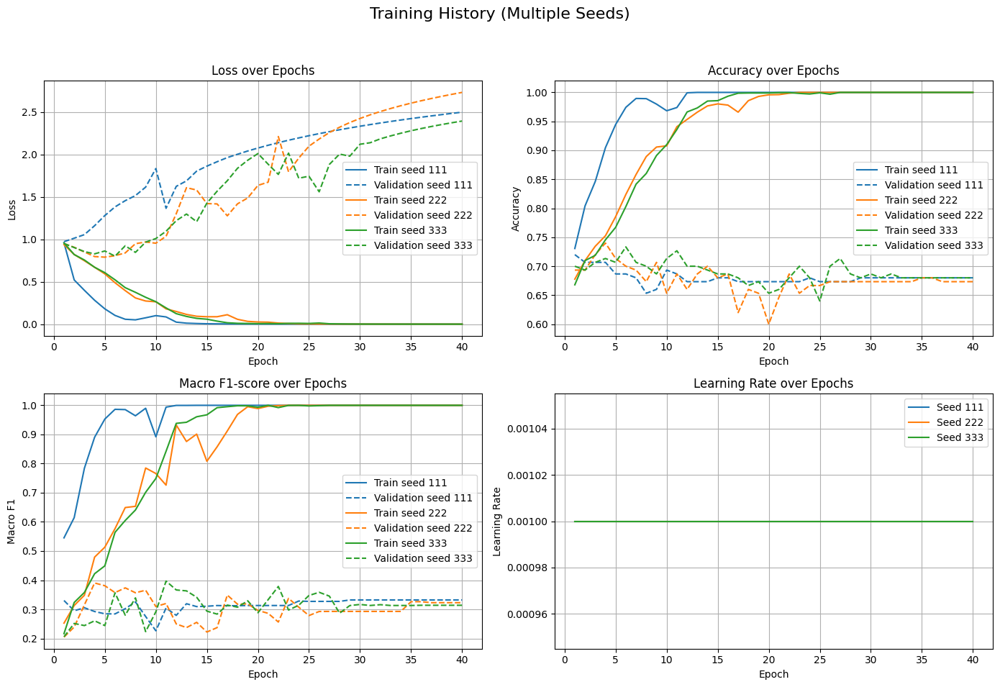

In [ ]:
if train_notebook:
  plot_training_histories(histories, seeds)

### 5.2.5 Model Evaluation (Test Set)

The `evaluate_models` function serves as the central evaluation engine for our experiments. It is designed to rigorously assess the generalization capabilities of our architectures by aggregating predictions across multiple training runs (seeds).

**Key Functionalities:**
1.  **Metric Computation:** For each seed, it computes standard classification metrics: Accuracy, Macro Precision, Macro Recall, and the critical **Macro F1-score**.
2.  **Statistical Aggregation:** Instead of relying on a single data point, the function calculates the **Mean** and **Standard Deviation** for every metric. This allows us to distinguish between significant improvements and random fluctuations caused by initialization noise.
3.  **Confusion Matrices**: It visualizes it for each seed, enabling a granular inspection of class-specific errors.

9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 172ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step
=== Evaluation Report: Baseline Embedding LSTM ===
Accuracy         : 0.6571 ± 0.0105
Macro F1         : 0.3862 ± 0.0204
Macro Precision  : 0.4282 ± 0.0326
Macro Recall     : 0.3710 ± 0.0151


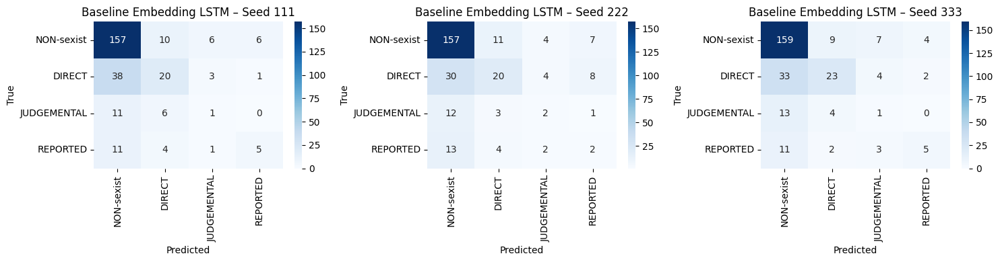

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.653571,0.646429,0.671429,0.657143,0.010514
Macro F1,0.389270,0.359742,0.409542,0.386185,0.020448
Macro Precision,0.432770,0.386165,0.465647,0.428194,0.032609
Macro Recall,0.373332,0.351506,0.388222,0.371020,0.015078


In [ ]:
metrics_baseline_test = evaluate_models(models_baseline_list, X_test_ids, y_test, seeds, class_names=class_names, model_name="Baseline Embedding LSTM", )

metrics_baseline_test

### 5.2.6 Model Evaluation (Validation Set)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
=== Evaluation Report: Baseline Embedding LSTM ===
Accuracy         : 0.6778 ± 0.0031
Macro F1         : 0.3230 ± 0.0074
Macro Precision  : 0.3907 ± 0.0320
Macro Recall     : 0.3129 ± 0.0026


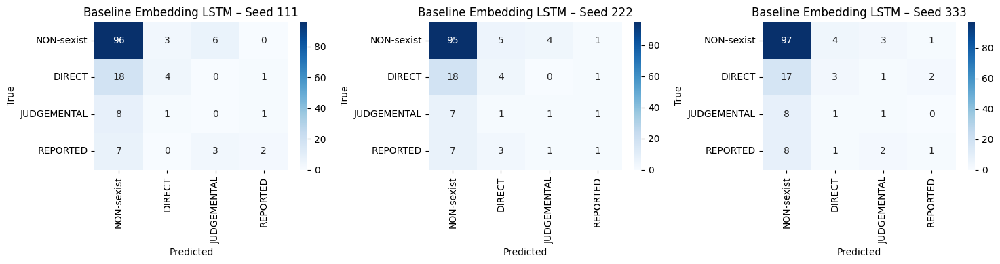

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.680000,0.673333,0.680000,0.677778,0.003143
Macro F1,0.332144,0.322797,0.313920,0.322954,0.007441
Macro Precision,0.436047,0.368098,0.368086,0.390743,0.032034
Macro Recall,0.313716,0.315502,0.309394,0.312871,0.002564


In [ ]:
metrics_baseline_validation = evaluate_models(models_baseline_list, X_val_ids, y_val, seeds, class_names=class_names, model_name="Baseline Embedding LSTM", )

metrics_baseline_validation

## 5.3 Training Stacked with Embedding Layer

In this section, we replicate the definition, training, and evaluation pipeline established for the Baseline model, applying it to the **Stacked Architecture**.

As detailed in the architecture definition, the Stacked model incorporates an additional Bidirectional LSTM layer. This increased depth significantly expands the model's parameter space, theoretically enabling it to capture more complex, hierarchical dependencies within the text. However, this higher capacity also introduces a greater risk of overfitting and increased computational cost. The rigorous multi-seed evaluation that follows is therefore critical to determine whether the added complexity translates into a statistically significant improvement in Macro F1-score compared to the simpler baseline.

### 5.3.1 Model Definition and Summary

In [ ]:
models_stacked_list = []

for _ in seeds:
    models_stacked_list.append(build_stacked_with_embedding(max_len, embedding_matrix=embedding_matrix_random, trainable = True))


models_stacked_list[0].summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_ids           │ (None, 49)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_embedding   │ (None, 49, 100)   │    987,000 │ input_ids[0][0]   │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_3         │ (None, 49)        │          0 │ input_ids[0][0]   │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_3     │ (None, 49, 256)   │    234,496 │ encoder_embeddin… │
│ (Bidirectional)     │                   │            │ not_equal_3[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_4     │ (None, 256)       │    394,240 │ bidirectional_3[… │
│ (Bidirectional)     │                   │            │ not_equal_3[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 4)         │      1,028 │ bidirectional_4[… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,616,764 (6.17 MB)

 Trainable params: 1,616,764 (6.17 MB)

 Non-trainable params: 0 (0.00 B)

### 5.3.2 Model Restoration

In [ ]:
if not train_notebook:
    for i in range(len(seeds)):
        path = f"/content/drive/MyDrive/Weights-1/Stacked_{i+1}.weights.h5"
        load_model_weights(models_stacked_list[i], path)

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 32 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Weights loaded from: /content/drive/MyDrive/Weights-1/Stacked_1.weights.h5
Weights loaded from: /content/drive/MyDrive/Weights-1/Stacked_2.weights.h5
Weights loaded from: /content/drive/MyDrive/Weights-1/Stacked_3.weights.h5


### 5.3.3 Model Training

In [ ]:
if train_notebook:
    histories = train_models(models_stacked_list, seeds, "Stacked Embedding LSTM", X_train_ids, y_train, X_val_ids, y_val, epochs=40, batch_size=128)

TRAINING: Stacked Embedding LSTM with Random Seed 111
Epoch 1/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - accuracy: 0.7002 - loss: 0.9892 - val_accuracy: 0.6933 - val_loss: 0.9175 - macro_f1: 0.2380 - val_macro_f1: 0.2047 - lr: 0.0010
Epoch 2/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - accuracy: 0.7056 - loss: 0.8177 - val_accuracy: 0.7067 - val_loss: 0.8298 - macro_f1: 0.3457 - val_macro_f1: 0.2810 - lr: 0.0010
Epoch 3/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.7287 - loss: 0.7291 - val_accuracy: 0.7267 - val_loss: 0.7954 - macro_f1: 0.4332 - val_macro_f1: 0.3701 - lr: 0.0010
Epoch 4/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7515 - loss: 0.6452 - val_accuracy: 0.7333 - val_loss: 0.8211 - macro_f1: 0.4736 - val_macro_f1: 0.3796 - lr: 0.0010
Epoch 5/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.7807 - loss: 0.5662 - val_accuracy: 0.7333 - val_loss: 0.9053 - macro_f1: 0.5193 - val_macro_f1: 0.3734 - lr: 0.0010
Epoch 6/40
23/23 ━━━━━━━━━━━━━━━━━

### 5.3.4 Training History

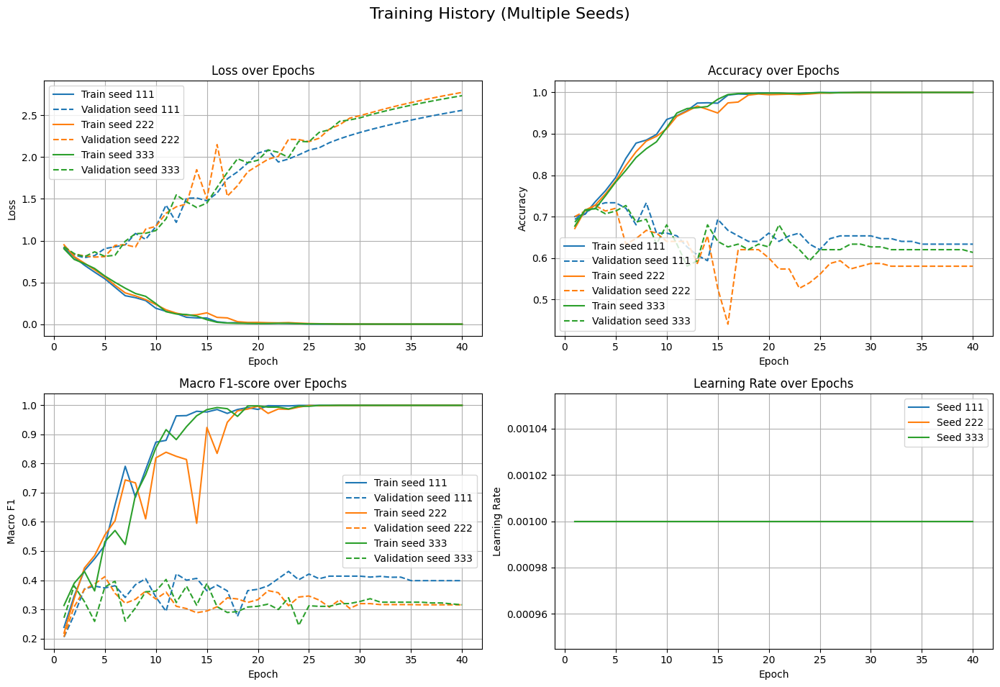

In [ ]:
if train_notebook:
    plot_training_histories(histories, seeds)

### 5.3.5 Model Evaluation (Test Set)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step
=== Evaluation Report: Stacked Embedding LSTM ===
Accuracy         : 0.6750 ± 0.0146
Macro F1         : 0.4230 ± 0.0117
Macro Precision  : 0.4531 ± 0.0186
Macro Recall     : 0.4094 ± 0.0077


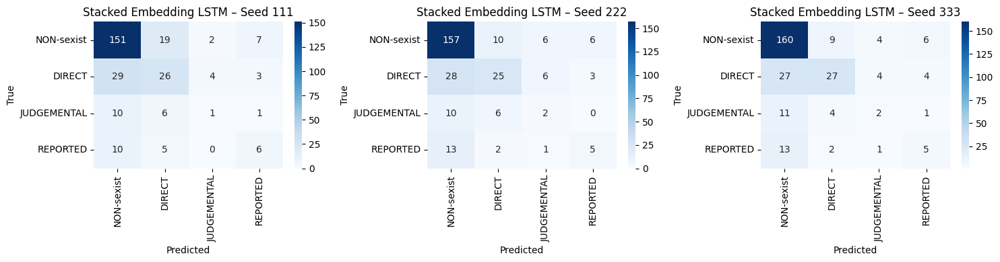

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.657143,0.675000,0.692857,0.675000,0.014580
Macro F1,0.408325,0.423622,0.436986,0.422978,0.011710
Macro Precision,0.428771,0.456670,0.473867,0.453103,0.018582
Macro Recall,0.401050,0.407382,0.419636,0.409356,0.007715


In [ ]:
metrics_stacked_test = evaluate_models(models_stacked_list, X_test_ids, y_test, seeds, class_names=class_names, model_name="Stacked Embedding LSTM", )

metrics_stacked_test

### 5.3.6 Model Evaluation (Validation Set)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
=== Evaluation Report: Stacked Embedding LSTM ===
Accuracy         : 0.6089 ± 0.0220
Macro F1         : 0.3431 ± 0.0391
Macro Precision  : 0.3517 ± 0.0359
Macro Recall     : 0.3426 ± 0.0404


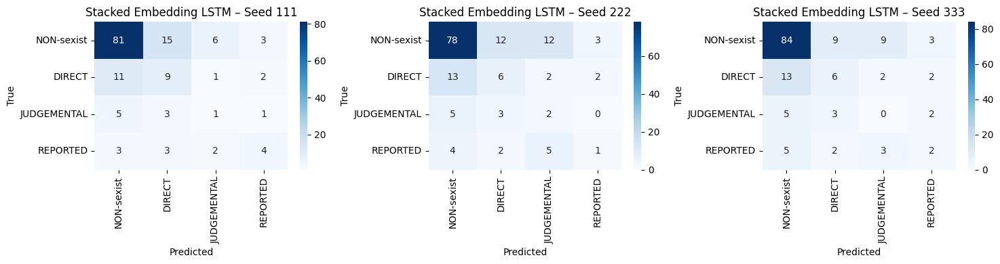

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.633333,0.580000,0.613333,0.608889,0.021999
Macro F1,0.398376,0.315497,0.315500,0.343124,0.039069
Macro Precision,0.402500,0.325694,0.326817,0.351670,0.035945
Macro Recall,0.399017,0.321765,0.306884,0.342555,0.040384


In [ ]:
metrics_stacked_val = evaluate_models(models_stacked_list, X_val_ids, y_val, seeds, class_names=class_names, model_name="Stacked Embedding LSTM", )

metrics_stacked_val

# [Task 6 - 1.0 points] Transformers

In this section, we transition from recurrent architectures (LSTMs) to the state-of-the-art Transformer paradigm. Specifically, we adopt **Twitter-roBERTa-base**, a pre-trained language model optimized for social media text.

This model is a specialized variant of RoBERTa (Robustly optimized BERT approach) that has been further pre-trained on a massive corpus of approximately 58 million tweets and fine-tuned on hate speech detection tasks. This domain-specific pre-training makes it exceptionally well-suited for our sexism detection task, as it already possesses a deep understanding of Twitter-specific linguistic nuances (hashtags, slang, informal grammar) and toxic content patterns.

**Experimental Pipeline:**
1.  **Tokenization:** We replace the whitespace tokenizer with the model-specific Byte-Level BPE tokenizer, ensuring compatibility with roBERTa's input requirements.
2.  **Fine-Tuning:** We utilize the Hugging Face `Trainer` API to fine-tune the model weights on our specific dataset, adapting its general hate-speech knowledge to our specific 4-class taxonomy.
3.  **Benchmarking:** Finally, we evaluate the fine-tuned model on the Test set using the identical set of metrics (Macro F1, Precision, Recall) used for the LSTM baselines, allowing for a direct and fair performance comparison.





## 6.1 Load the Model and the Tokenizer

We initialize the **Twitter-roBERTa** model using the `cardiffnlp/twitter-roberta-base-hate-latest` checkpoint.

A critical step in this initialization is the adaptation of the classification head. The original model was pre-trained for a binary task (Hate Speech vs. Not Hate Speech). Since our Task 2 involves a multi-class taxonomy with **4 distinct categories**, we instantiate the model with `num_labels=4`.

The flag `ignore_mismatched_sizes=True` is strictly necessary here: it instructs the library to discard the pre-trained weights of the final classification layer (which expect 2 outputs) and replace them with a new, randomly initialized layer with 4 outputs, while preserving all the pre-trained weights of the Transformer encoder body.


In [ ]:
MODEL_NAME = "cardiffnlp/twitter-roberta-base-hate-latest"
OUTPUT_DIR = "./results_hate_speech"

print(f"Loading Tokenizer and Model: {MODEL_NAME}")
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

models_transformer_list = []
for i in range(len(seeds)):
    models_transformer_list.append(AutoModelForSequenceClassification.from_pretrained(MODEL_NAME, num_labels=4, id2label=mapping_inverse, label2id=mapping, ignore_mismatched_sizes=True))

Loading Tokenizer and Model: cardiffnlp/twitter-roberta-base-hate-latest


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/351 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/280 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/888 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at cardiffnlp/twitter-roberta-base-hate-latest and are newly initialized because the shapes did not match:
- classifier.out_proj.weight: found shape torch.Size([2, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
- classifier.out_proj.bias: found shape torch.Size([2]) in the checkpoint and torch.Size([4]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at cardiffnlp/twitter-roberta-base-hate-latest and are newly initialized because the shapes did not match:
- classifier.out_proj.weight: found shape torch.Size([2, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
- classifier.out_proj.bias: found shape torch.Size([2]) in the checkpoint and torch.Size([4]) in th

## 6.2 Preprocess the Dataset

### 6.2.1 Tokenize the Datasets

Unlike the whitespace tokenization used for LSTMs, Transformer models require a specific subword tokenization scheme (Byte-Level BPE for RoBERTa). The `tokenize_function` applies this transformation to the raw tweets.

**Key Configuration:**
*   `truncation=True`: Ensures that any tweet exceeding the model's maximum context window (512 tokens) is automatically truncated to prevent runtime errors.
*   `padding=False`: We deliberately disable static padding at this stage. Instead, we delegate padding to the `DataCollator` during the training loop. This technique, known as **Dynamic Padding**, pads each batch only to the length of the longest sequence *in that specific batch*, significantly optimizing computational efficiency compared to padding the entire dataset to a fixed maximum length.


In [ ]:
# Convert Pandas DataFrames to Hugging Face Datasets
train_dataset = Dataset.from_pandas(train_df)
eval_dataset = Dataset.from_pandas(dev_df)
test_dataset = Dataset.from_pandas(test_df)

print("Tokenizing datasets...")
tokenized_train_dataset = train_dataset.map(tokenize_function, batched=True)
tokenized_eval_dataset = eval_dataset.map(tokenize_function, batched=True)
tokenized_test_dataset = test_dataset.map(tokenize_function, batched=True)

Tokenizing datasets...


Map:   0%|          | 0/2873 [00:00<?, ? examples/s]

Map:   0%|          | 0/150 [00:00<?, ? examples/s]

Map:   0%|          | 0/280 [00:00<?, ? examples/s]

### 6.2.2 Comparative Analysis of Raw vs. Tokenized Sequences

The `analyze_raw_vs_tokenized` function performs a quantitative comparison between the original textual data and its subword-tokenized representation produced by the RoBERTa tokenizer. This step is critical to understand how the BPE (Byte-Pair Encoding) algorithm expands the sequence length.

**Analytical Components:**
1.  **Descriptive Statistics:** It computes key percentiles (50th, 95th, 99th) for character counts, word counts, and subword token counts.
2.  **Truncation Risk:** It explicitly calculates the percentage of samples that exceed the model's maximum context window (`max_length=512`). A low percentage ensures that the truncation strategy defined earlier does not discard meaningful information.
3.  **Visualizations:**
    *   **Histograms:** Compare the frequency distributions of raw words versus subword tokens.
    *   **Scatter Plot:** Visualizes the correlation between word count and token count, revealing the "subword expansion factor" (slope).
    *   **Boxplots:** Highlight the shift in length distribution and the presence of outliers after tokenization.


=== Length Statistics ===
       Raw (chars)  Raw (words)  Tokenized
count      2873.00      2873.00    2873.00
mean        135.83        25.78      31.22
std          73.99        13.93      15.55
min           4.00         1.00       3.00
50%         126.00        24.00      29.00
75%         203.00        37.00      45.00
90%         247.80        46.00      54.00
95%         256.00        49.00      57.00
99%         265.00        54.00      63.00
max         277.00        62.00      78.00

Percentage of sequences reaching max_length (512): 0.00%


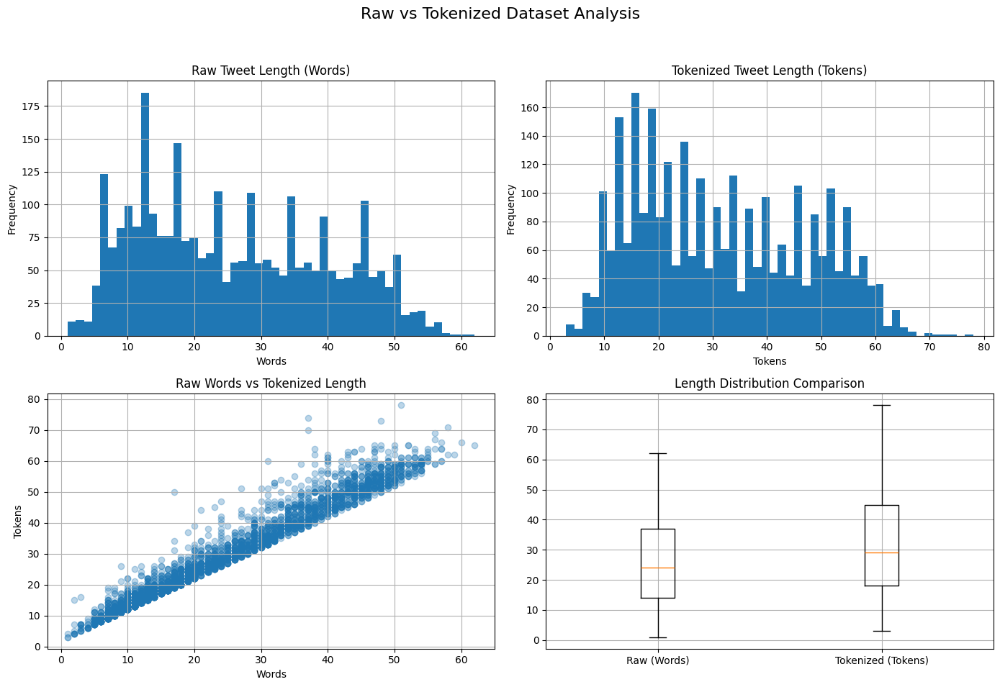

In [ ]:
stats = analyze_raw_vs_tokenized(raw_dataset=train_df, tokenized_dataset=tokenized_train_dataset,
                                 text_column="tweet", max_length=tokenizer.model_max_length)

## 6.3 Twitter-roBERTa-base for Hate Speech Detection

### 6.3.1 Model Summary

In [ ]:
summary(models_transformer_list[0])

Layer (type:depth-idx)                                            Param #
RobertaForSequenceClassification                                  --
├─RobertaModel: 1-1                                               --
│    └─RobertaEmbeddings: 2-1                                     --
│    │    └─Embedding: 3-1                                        38,603,520
│    │    └─Embedding: 3-2                                        394,752
│    │    └─Embedding: 3-3                                        768
│    │    └─LayerNorm: 3-4                                        1,536
│    │    └─Dropout: 3-5                                          --
│    └─RobertaEncoder: 2-2                                        --
│    │    └─ModuleList: 3-6                                       85,054,464
├─RobertaClassificationHead: 1-2                                  --
│    └─Linear: 2-3                                                590,592
│    └─Dropout: 2-4                                               --

### 6.3.2 Model Restoration

The `load_hf_trainers` function facilitates the reloading of previously fine-tuned models from disk. Instead of retraining from scratch, this utility iterates through the saved checkpoints (organized by seed), re-instantiates the `AutoModel` and `AutoTokenizer` from the local directory, and wraps them into a lightweight `Trainer` instance configured specifically for inference (evaluation) rather than training.

In [ ]:
base_path = '/content/drive/MyDrive/Weights-1'

if not train_dataset:
    hf_trainers = load_hf_trainers(base_path, "transformer", seeds)

Starting restoration of Trainers from: /content/drive/MyDrive/Weights-1
Loading seed 111... OK.
Loading seed 222... OK.
Loading seed 333... OK.

Total Trainers restored: 3


### 6.3.3 Model Training

This section defines the core components for fine-tuning the Transformer models robustly and transparently.

1.  **Metric Computation:** We implemented `compute_metrics` to integrate **Macro F1-score** and **Accuracy** into the Hugging Face evaluation loop, as the default behavior only tracks loss.
2.  **Custom Logging:** To facilitate detailed post-training analysis, we defined `MetricsHistoryCallback`. This custom callback intercepts training logs in real-time and stores the evolution of loss, metrics, and learning rates into a structured dictionary, enabling easy visualization later.
3.  **Execution Loop:** Finally, `train_models_transformer` orchestrates the multi-seed experiment. It enforces strict determinism via global seeding, executes the `.train()` routine for each seed configuration, and serializes the final model artifacts to disk for future inference.

In [ ]:
#Define Training Arguments
training_args = TrainingArguments(
    output_dir="test_dir",             # where to save model
    learning_rate=2e-5,
    per_device_train_batch_size=128,
    per_device_eval_batch_size=128,
    num_train_epochs=15,

    eval_strategy="epoch",             # when to report evaluation metrics/losses
    save_strategy="epoch",             # when to save checkpoint
    logging_strategy="epoch",
    metric_for_best_model="f1_macro",

    remove_unused_columns=True,
    load_best_model_at_end=True,
    report_to='none'                   # disabling wandb (default)
)


#DataCollator to pad the sequence
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

#Personalized callback to log F1-score
metrics_callback = MetricsHistoryCallback()

#Create trainers for each model
trainers = []
for i in range(len(seeds)):
    trainers.append(Trainer(model=models_transformer_list[i], args=training_args, train_dataset=tokenized_train_dataset,
                            eval_dataset=tokenized_eval_dataset, processing_class=tokenizer,
                            data_collator=data_collator, compute_metrics=compute_metrics, callbacks=[metrics_callback]))

In [ ]:
#Train the models
if train_notebook:
    train_models_transformer(trainers, seeds, "RoBERTa Hate Speech")

TRAINING: RoBERTa Hate Speech – Test Set with Random Seed 111


Epoch,Training Loss,Validation Loss,Accuracy,F1 Macro
1,0.825500,0.702913,0.786667,0.385973
2,0.614300,0.625558,0.786667,0.382518
3,0.528400,0.605935,0.773333,0.406835
4,0.457900,0.624764,0.773333,0.427991
5,0.380100,0.673649,0.786667,0.458559
6,0.320400,0.679969,0.786667,0.485187
7,0.274200,0.739011,0.786667,0.476488
8,0.226700,0.774655,0.773333,0.468883
9,0.203400,0.828467,0.786667,0.516406
10,0.183400,0.823197,0.760000,0.479264


Model seed 111 saved in ./final_model_seed_111
TRAINING: RoBERTa Hate Speech – Test Set with Random Seed 222


Epoch,Training Loss,Validation Loss,Accuracy,F1 Macro
1,0.834800,0.687792,0.780000,0.387649
2,0.645900,0.645318,0.773333,0.377127
3,0.547000,0.643580,0.780000,0.380622
4,0.456000,0.673502,0.773333,0.380380
5,0.395800,0.680065,0.793333,0.452269
6,0.343600,0.750644,0.773333,0.441701
7,0.286300,0.716866,0.800000,0.517398
8,0.260800,0.758464,0.773333,0.442732
9,0.227400,0.772056,0.780000,0.447511
10,0.195800,0.791149,0.780000,0.487267


Model seed 222 saved in ./final_model_seed_222
TRAINING: RoBERTa Hate Speech – Test Set with Random Seed 333


Epoch,Training Loss,Validation Loss,Accuracy,F1 Macro
1,0.872000,0.724848,0.793333,0.398822
2,0.645800,0.625882,0.780000,0.387649
3,0.533900,0.586553,0.793333,0.482890
4,0.454700,0.609619,0.786667,0.458559
5,0.384100,0.665043,0.800000,0.472576
6,0.339200,0.659728,0.793333,0.483349
7,0.295400,0.707340,0.806667,0.491772
8,0.241800,0.750188,0.786667,0.462874
9,0.214200,0.780169,0.780000,0.470120
10,0.194800,0.783772,0.780000,0.480155


Model seed 333 saved in ./final_model_seed_333
TRAINING OVER


### 6.3.4 Training History

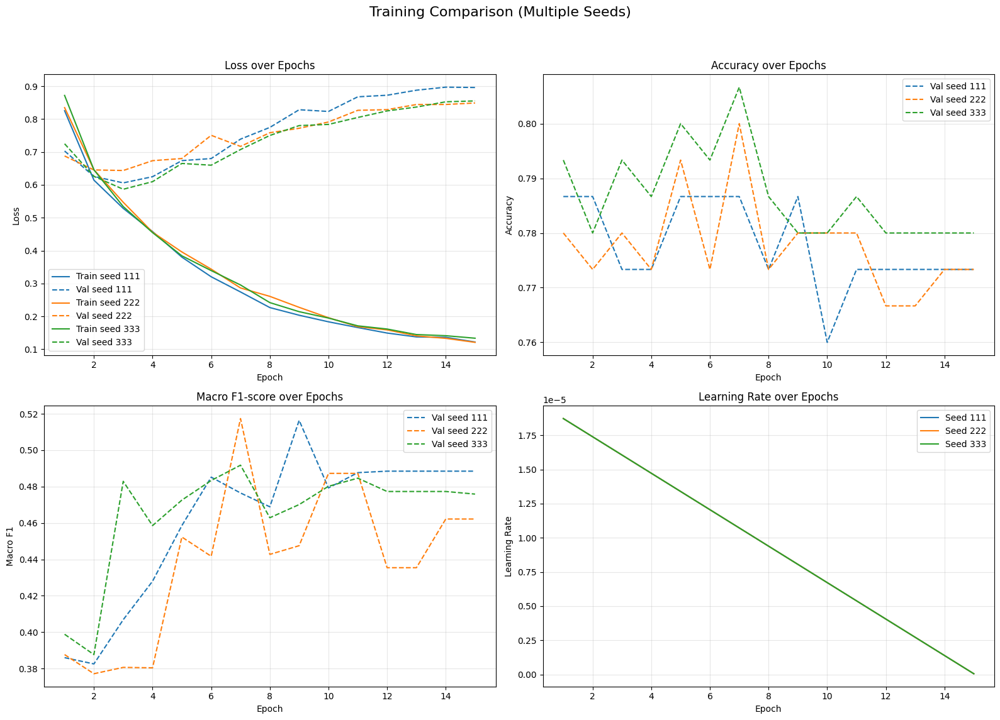

In [ ]:
plot_compare_trainers(trainers, seeds)

### 6.3.5 Model Evaluation (Test Set)

Starting evaluation for RoBERTa Hate Speech – Test Set...
  Evaluating seed 111...


  Evaluating seed 222...


  Evaluating seed 333...



=== Evaluation Report: RoBERTa Hate Speech – Test Set ===
--------------------------------------------------
Accuracy         : 0.7464 ± 0.0000
Macro F1         : 0.4811 ± 0.0140
Macro Precision  : 0.5288 ± 0.0456
Macro Recall     : 0.4781 ± 0.0070
--------------------------------------------------


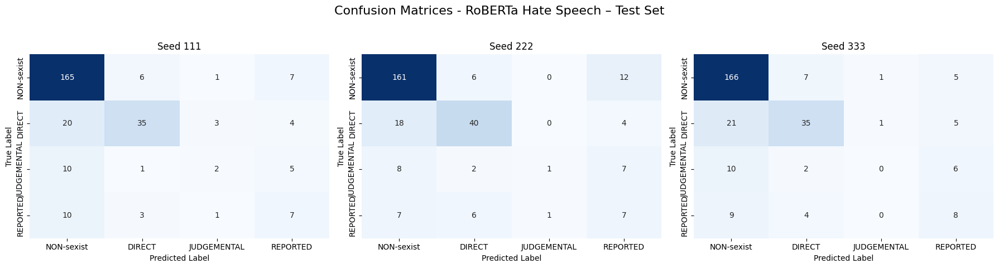

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.746429,0.746429,0.746429,0.746429,0.000000
Macro F1,0.497941,0.481859,0.463564,0.481121,0.014044
Macro Precision,0.543179,0.575993,0.467081,0.528751,0.045618
Macro Recall,0.482687,0.483373,0.468211,0.478090,0.006991


In [ ]:
metrics_transformer_test = evaluate_hf_trainers(trainers=hf_trainers, test_dataset=tokenized_test_dataset, seeds=seeds,
                                  class_names=class_names, model_name="RoBERTa Hate Speech – Test Set")

metrics_transformer_test

### 6.3.6 Model Evaluation (Validation Set)

Starting evaluation for RoBERTa Hate Speech – Test Set...
  Evaluating seed 111...


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


  Evaluating seed 222...


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


  Evaluating seed 333...


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)



=== Evaluation Report: RoBERTa Hate Speech – Test Set ===
--------------------------------------------------
Accuracy         : 0.7978 ± 0.0083
Macro F1         : 0.5085 ± 0.0119
Macro Precision  : 0.5340 ± 0.0265
Macro Recall     : 0.4997 ± 0.0040
--------------------------------------------------


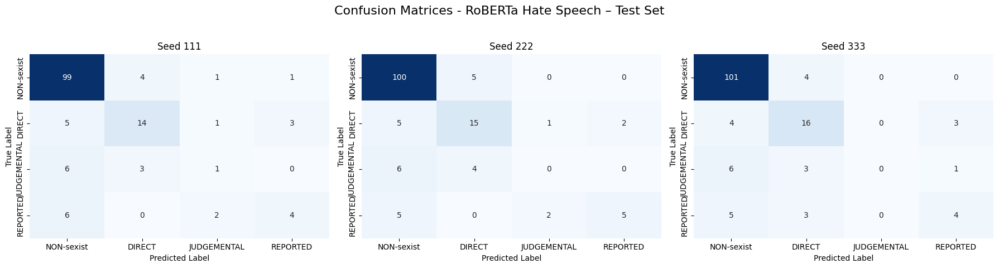

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.786667,0.800000,0.806667,0.797778,0.008315
Macro F1,0.516406,0.517398,0.491772,0.508525,0.011853
Macro Precision,0.555029,0.550339,0.496519,0.533962,0.026546
Macro Recall,0.496222,0.505305,0.497723,0.499750,0.003976


In [ ]:
metrics_transformer_val = evaluate_hf_trainers(trainers=hf_trainers, test_dataset=tokenized_eval_dataset, seeds=seeds,
                                  class_names=class_names, model_name="RoBERTa Hate Speech – Test Set")

metrics_transformer_val

# [Task 7 - 0.5 points] Error Analysis

The objective of this error analysis is to gain a deeper understanding of the types of mistakes made by the evaluated models and to identify recurring error patterns that negatively affect overall performance. Beyond reporting aggregate evaluation metrics, this analysis aims to investigate *why* certain predictions fail, with particular attention to linguistic, statistical, and model-related factors.

This comparison highlights the strengths and limitations of each architectural approach when applied to short, noisy texts such as tweets.

By systematically examining these errors, this section provides insights into the observed performance differences between models and motivates potential strategies to mitigate the identified weaknesses. The findings of this analysis also inform the selection of future improvements, including alternative loss functions, data balancing techniques, and model architectures better suited to capturing contextual and semantic information.


## 7.1 Creation and Evaluation of Ensembles

The function `evaluate_ensemble_confidence_selection` implements an ensemble evaluation framework based on multiple heterogeneous classification models, supporting both Keras/Scikit-learn and Hugging Face Transformer architectures.  
Its primary goal is to assess ensemble performance while providing detailed quantitative and qualitative diagnostic analyses.

For each model, class probability distributions are computed on the test set. From these probabilities, both the predicted class and a confidence score, defined as the maximum predicted probability, are extracted.  
The ensemble prediction is obtained through a confidence-based selection mechanism, whereby, for each input sample, the prediction of the model exhibiting the highest confidence is selected. This enables a dynamic, instance-level combination of models, allowing different classifiers to contribute depending on the characteristics of the input.

The ensemble performance is evaluated using standard global metrics, including accuracy and macro-averaged precision, recall, and F1-score, ensuring balanced assessment across all classes.  

To support interpretability and error analysis, multiple visualizations are generated. A global confusion matrix provides an overview of classification performance across all classes, highlighting common misclassification patterns.  
Additionally, per-class binary confusion matrices are computed and visualized, enabling a class-wise analysis of true positives, false positives, true negatives, and false negatives. For each class, precision, recall, and F1-score are explicitly reported, facilitating a more granular understanding of model behavior.

Finally, a structured tabular output is produced, containing the original text samples, true labels, individual model predictions, confidence scores, the ensemble prediction, and the selected model for each instance. This representation supports fine-grained inspection of individual decisions and systematic error analysis.



### 7.1.1 Baseline Model

**Test Set**

Detected framework: Keras/Sklearn
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

=== Evaluation Report: Baseline Ensemble ===
--------------------------------------------------
Accuracy         : 0.6643
Macro F1         : 0.4123
Macro Precision  : 0.4658
Macro Recall     : 0.3953
--------------------------------------------------


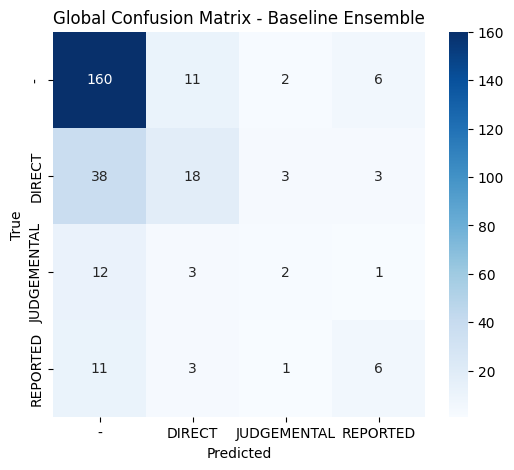

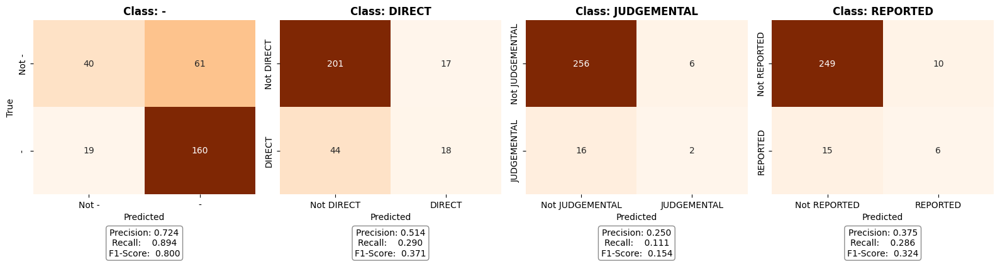

,tweet,true_label,model_1_scores,model_1_pred,model_1_confidence,model_2_scores,model_2_pred,model_2_confidence,model_3_scores,model_3_pred,model_3_confidence,ensemble_pred,selected_model
400178,1st day at the pool on a beautiful sunday in ny too bad few dare to go in due to the frigid water temp we last 45 min and figure we prove our point,-,"['0.986', '0.001', '0.013', '0.000']",-,0.986,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['1.000', '0.000', '0.000', '0.000']",-,1.000,-,Model 2
400180,same though the angst just come and go lonely xie lian will always break my frigid heart,-,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['1.000', '0.000', '0.000', '0.000']",-,1.000,-,Model 1
400181,fuck that cunt try to vote her out multiple time,DIRECT,"['0.932', '0.068', '0.000', '0.000']",-,0.932,"['0.494', '0.506', '0.000', '0.000']",DIRECT,0.506,"['0.602', '0.397', '0.000', '0.000']",-,0.602,-,Model 1
400182,u gotta say some shit like ill fuck that cunt dumb until you cant remember anything but my name you stupid slut,DIRECT,"['0.000', '1.000', '0.000', '0.000']",DIRECT,1.000,"['0.049', '0.950', '0.000', '0.000']",DIRECT,0.950,"['0.009', '0.991', '0.000', '0.000']",DIRECT,0.991,DIRECT,Model 1
400183,mmm fuck that cunt be hungry for this dick isnt it such a shame that you can lie all you want about not want this but your body never canhe say in her ear before he start kiss down her neck make sure to leave plenty of love mark on her pale skin,DIRECT,"['0.031', '0.969', '0.000', '0.000']",DIRECT,0.969,"['0.997', '0.003', '0.000', '0.000']",-,0.997,"['1.000', '0.000', '0.000', '0.000']",-,1.000,-,Model 3
400185,i mean i do but wouldnt it be fun to get gangbanged together,-,"['0.998', '0.002', '0.000', '0.000']",-,0.998,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['1.000', '0.000', '0.000', '0.000']",-,1.000,-,Model 2
400186,maybe something involve her get gangbanged,DIRECT,"['0.809', '0.190', '0.001', '0.000']",-,0.809,"['0.927', '0.068', '0.004', '0.000']",-,0.927,"['0.971', '0.028', '0.001', '0.000']",-,0.971,-,Model 3
400187,sex a in gender harassment be what they be infer,-,"['0.002', '0.000', '0.000', '0.997']",REPORTED,0.997,"['0.021', '0.003', '0.001', '0.975']",REPORTED,0.975,"['0.002', '0.045', '0.002', '0.950']",REPORTED,0.950,REPORTED,Model 1
400188,kabul islamic emirate of afghanistan have announce the end of coeducation in the country cite gender harassmentfemale student will attend university on monday wednesday and saturday while tuesday thursday and sunday be fix for male,REPORTED,"['0.003', '0.000', '0.000', '0.997']",REPORTED,0.997,"['0.915', '0.000', '0.003', '0.082']",-,0.915,"['0.809', '0.000', '0.000', '0.191']",-,0.809,REPORTED,Model 1
400189,appreciate be include along with on the uvalde gunman history of cyber gender harassment regrettably unshocking,-,"['0.240', '0.000', '0.000', '0.759']",REPORTED,0.759,"['0.014', '0.000', '0.000', '0.986']",REPORTED,0.986,"['0.002', '0.000', '0.002', '0.997']",REPORTED,0.997,REPORTED,Model 3


In [ ]:
metrics_baseline_ensemble, styled_baseline, raw_baseline, errors_baseline = evaluate_ensemble_confidence_selection(
    models=models_baseline_list,
    X_test=X_test_ids,
    y_test=y_test,
    tweets=test_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Baseline Ensemble"
)

styled_baseline


**Validation Set**

Detected framework: Keras/Sklearn
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

=== Evaluation Report: Baseline Ensemble ===
--------------------------------------------------
Accuracy         : 0.7000
Macro F1         : 0.3367
Macro Precision  : 0.4242
Macro Recall     : 0.3250
--------------------------------------------------


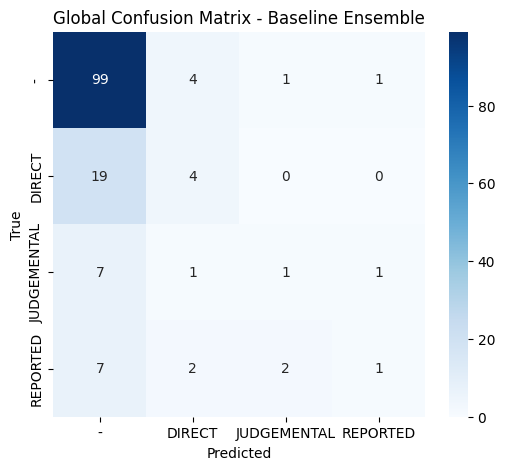

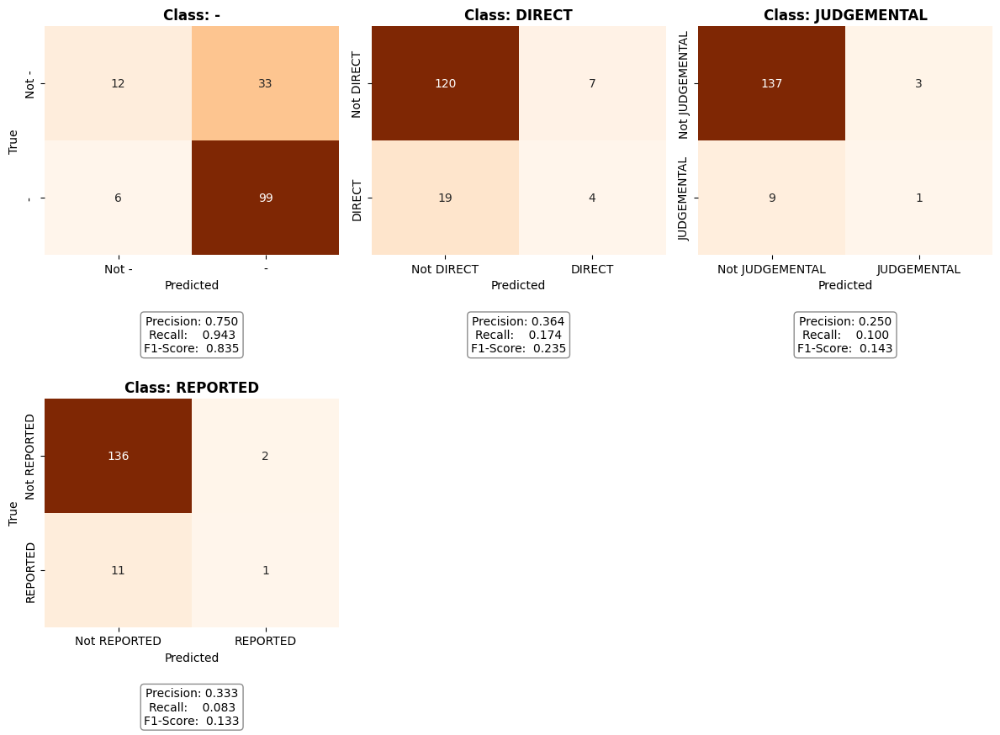

In [ ]:
_, _, _, _ = evaluate_ensemble_confidence_selection(
    models=models_baseline_list,
    X_test=X_val_ids,
    y_test=y_val,
    tweets=val_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Baseline Ensemble"
)

### 7.1.2 Stacked Model

**Test Set**

Detected framework: Keras/Sklearn
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

=== Evaluation Report: Stacked Ensemble ===
--------------------------------------------------
Accuracy         : 0.6857
Macro F1         : 0.4439
Macro Precision  : 0.4941
Macro Recall     : 0.4214
--------------------------------------------------


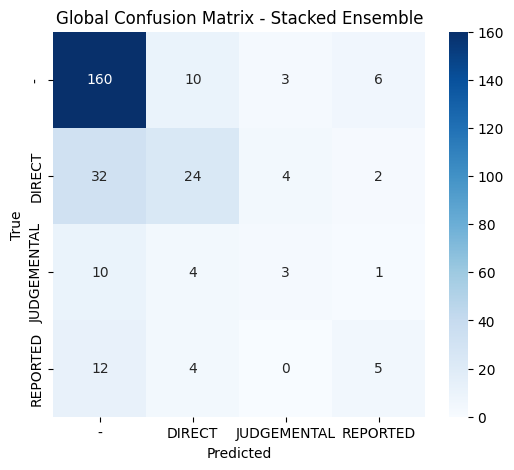

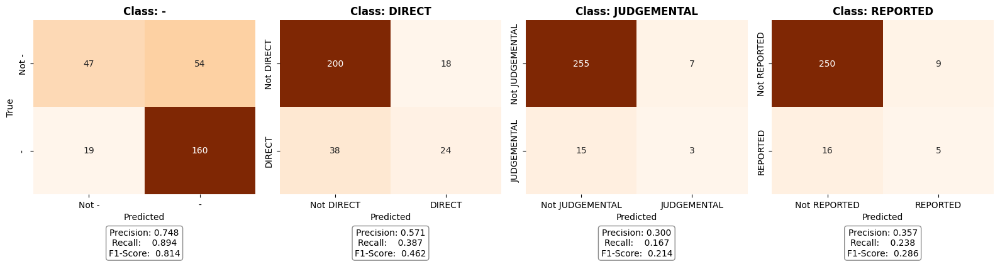

,tweet,true_label,model_1_scores,model_1_pred,model_1_confidence,model_2_scores,model_2_pred,model_2_confidence,model_3_scores,model_3_pred,model_3_confidence,ensemble_pred,selected_model
400178,1st day at the pool on a beautiful sunday in ny too bad few dare to go in due to the frigid water temp we last 45 min and figure we prove our point,-,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['1.000', '0.000', '0.000', '0.000']",-,1.000,-,Model 2
400180,same though the angst just come and go lonely xie lian will always break my frigid heart,-,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['0.999', '0.000', '0.000', '0.000']",-,0.999,-,Model 1
400181,fuck that cunt try to vote her out multiple time,DIRECT,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['0.001', '0.999', '0.000', '0.000']",DIRECT,0.999,"['0.513', '0.487', '0.000', '0.000']",-,0.513,-,Model 1
400182,u gotta say some shit like ill fuck that cunt dumb until you cant remember anything but my name you stupid slut,DIRECT,"['0.998', '0.002', '0.000', '0.000']",-,0.998,"['0.941', '0.059', '0.000', '0.000']",-,0.941,"['0.005', '0.995', '0.000', '0.000']",DIRECT,0.995,-,Model 1
400183,mmm fuck that cunt be hungry for this dick isnt it such a shame that you can lie all you want about not want this but your body never canhe say in her ear before he start kiss down her neck make sure to leave plenty of love mark on her pale skin,DIRECT,"['0.958', '0.042', '0.001', '0.000']",-,0.958,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['0.170', '0.817', '0.012', '0.000']",DIRECT,0.817,-,Model 2
400185,i mean i do but wouldnt it be fun to get gangbanged together,-,"['0.999', '0.001', '0.000', '0.000']",-,0.999,"['1.000', '0.000', '0.000', '0.000']",-,1.000,"['1.000', '0.000', '0.000', '0.000']",-,1.000,-,Model 2
400186,maybe something involve her get gangbanged,DIRECT,"['0.867', '0.132', '0.001', '0.000']",-,0.867,"['0.226', '0.772', '0.001', '0.001']",DIRECT,0.772,"['0.971', '0.021', '0.007', '0.001']",-,0.971,-,Model 3
400187,sex a in gender harassment be what they be infer,-,"['0.000', '0.000', '0.002', '0.998']",REPORTED,0.998,"['0.000', '0.000', '0.000', '0.999']",REPORTED,0.999,"['0.000', '0.000', '0.000', '1.000']",REPORTED,1.000,REPORTED,Model 3
400188,kabul islamic emirate of afghanistan have announce the end of coeducation in the country cite gender harassmentfemale student will attend university on monday wednesday and saturday while tuesday thursday and sunday be fix for male,REPORTED,"['0.000', '0.000', '0.000', '1.000']",REPORTED,1.000,"['0.019', '0.000', '0.000', '0.981']",REPORTED,0.981,"['0.000', '0.000', '0.010', '0.990']",REPORTED,0.990,REPORTED,Model 1
400189,appreciate be include along with on the uvalde gunman history of cyber gender harassment regrettably unshocking,-,"['0.000', '0.000', '0.000', '1.000']",REPORTED,1.000,"['0.921', '0.000', '0.000', '0.078']",-,0.921,"['0.000', '0.000', '0.000', '1.000']",REPORTED,1.000,REPORTED,Model 1


In [ ]:
metrics_stacked_ensemble, styled_stacked, raw_stacked, errors_stacked = evaluate_ensemble_confidence_selection(
    models=models_stacked_list,
    X_test=X_test_ids,
    y_test=y_test,
    tweets=test_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Stacked Ensemble"
)

styled_stacked

**Validation Set**

Detected framework: Keras/Sklearn
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 255ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 388ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 346ms/step

=== Evaluation Report: Stacked Ensemble ===
--------------------------------------------------
Accuracy         : 0.6133
Macro F1         : 0.3469
Macro Precision  : 0.3808
Macro Recall     : 0.3380
--------------------------------------------------


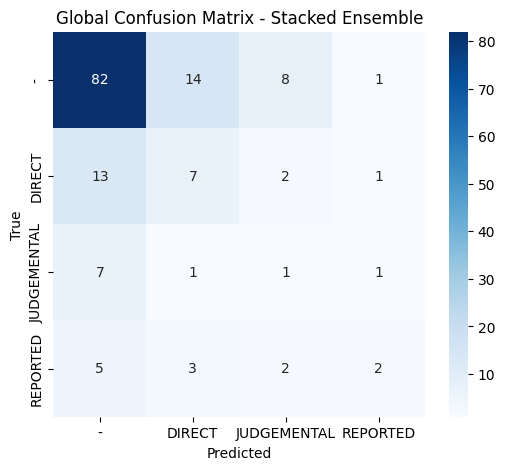

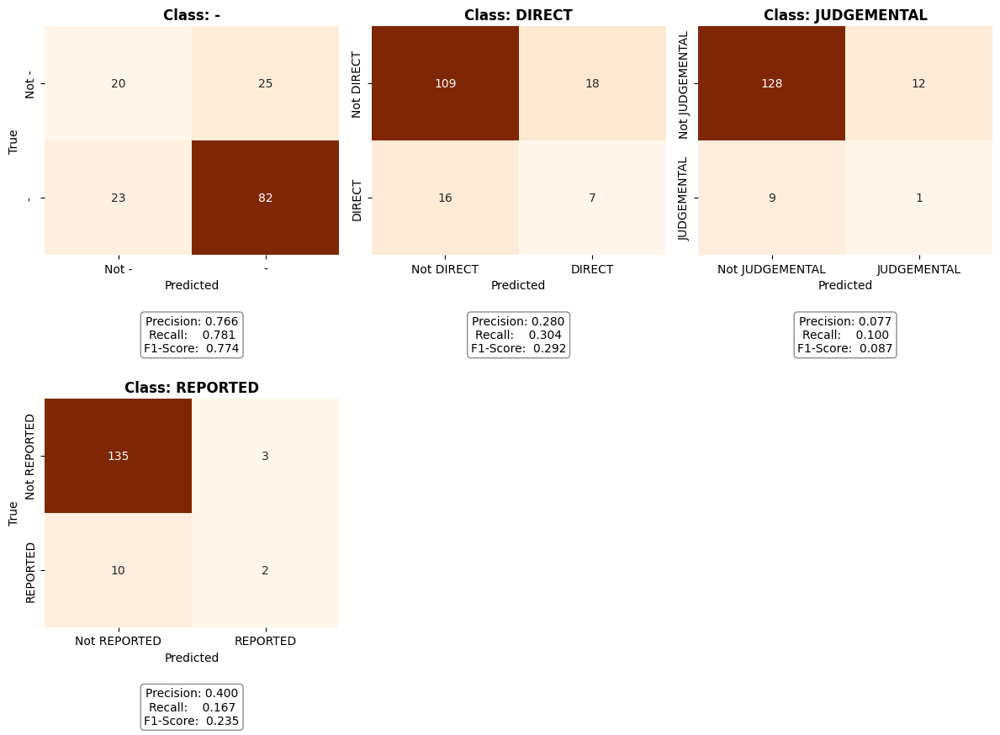

In [ ]:
_, _, _, _ = evaluate_ensemble_confidence_selection(
    models=models_stacked_list,
    X_test=X_val_ids,
    y_test=y_val,
    tweets=val_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Stacked Ensemble"
)

### 7.1.3 Transformer Model

**Test Set**

Detected framework: Hugging Face (Transformers Trainer)



=== Evaluation Report: Transformer Ensemble ===
--------------------------------------------------
Accuracy         : 0.7571
Macro F1         : 0.5162
Macro Precision  : 0.5667
Macro Recall     : 0.5027
--------------------------------------------------


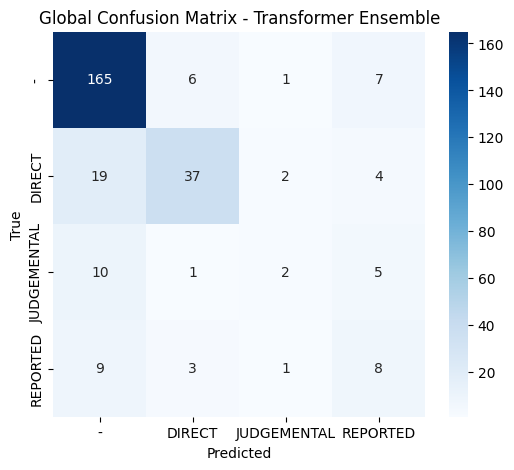

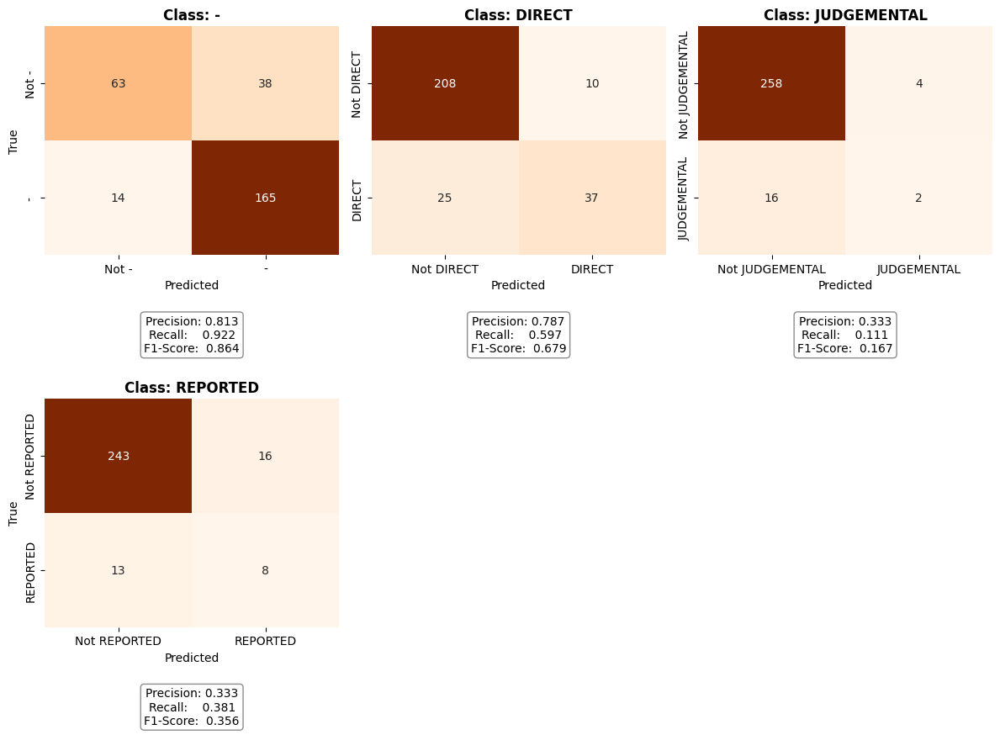

,tweet,true_label,model_1_scores,model_1_pred,model_1_confidence,model_2_scores,model_2_pred,model_2_confidence,model_3_scores,model_3_pred,model_3_confidence,ensemble_pred,selected_model
0,1st day at the pool on a beautiful sunday in ny too bad few dare to go in due to the frigid water temp we last 45 min and figure we prove our point,-,"['0.993', '0.003', '0.002', '0.002']",-,0.993,"['0.991', '0.004', '0.002', '0.003']",-,0.991,"['0.990', '0.005', '0.002', '0.003']",-,0.990,-,Model 1
1,same though the angst just come and go lonely xie lian will always break my frigid heart,-,"['0.990', '0.006', '0.002', '0.002']",-,0.990,"['0.987', '0.008', '0.002', '0.003']",-,0.987,"['0.988', '0.007', '0.002', '0.002']",-,0.988,-,Model 1
2,fuck that cunt try to vote her out multiple time,DIRECT,"['0.025', '0.944', '0.025', '0.006']",DIRECT,0.944,"['0.046', '0.886', '0.040', '0.028']",DIRECT,0.886,"['0.038', '0.899', '0.044', '0.020']",DIRECT,0.899,DIRECT,Model 1
3,u gotta say some shit like ill fuck that cunt dumb until you cant remember anything but my name you stupid slut,DIRECT,"['0.006', '0.968', '0.017', '0.009']",DIRECT,0.968,"['0.017', '0.941', '0.023', '0.018']",DIRECT,0.941,"['0.011', '0.936', '0.034', '0.019']",DIRECT,0.936,DIRECT,Model 1
4,mmm fuck that cunt be hungry for this dick isnt it such a shame that you can lie all you want about not want this but your body never canhe say in her ear before he start kiss down her neck make sure to leave plenty of love mark on her pale skin,DIRECT,"['0.010', '0.963', '0.020', '0.007']",DIRECT,0.963,"['0.016', '0.953', '0.018', '0.013']",DIRECT,0.953,"['0.008', '0.946', '0.030', '0.016']",DIRECT,0.946,DIRECT,Model 1
5,i mean i do but wouldnt it be fun to get gangbanged together,-,"['0.789', '0.198', '0.008', '0.006']",-,0.789,"['0.511', '0.455', '0.013', '0.021']",-,0.511,"['0.840', '0.142', '0.009', '0.009']",-,0.840,-,Model 3
6,maybe something involve her get gangbanged,DIRECT,"['0.004', '0.946', '0.038', '0.012']",DIRECT,0.946,"['0.013', '0.920', '0.034', '0.033']",DIRECT,0.920,"['0.013', '0.891', '0.061', '0.034']",DIRECT,0.891,DIRECT,Model 1
7,sex a in gender harassment be what they be infer,-,"['0.991', '0.004', '0.002', '0.002']",-,0.991,"['0.989', '0.005', '0.003', '0.003']",-,0.989,"['0.987', '0.008', '0.003', '0.003']",-,0.987,-,Model 1
8,kabul islamic emirate of afghanistan have announce the end of coeducation in the country cite gender harassmentfemale student will attend university on monday wednesday and saturday while tuesday thursday and sunday be fix for male,REPORTED,"['0.769', '0.002', '0.023', '0.206']",-,0.769,"['0.539', '0.010', '0.065', '0.386']",-,0.539,"['0.879', '0.006', '0.023', '0.092']",-,0.879,-,Model 3
9,appreciate be include along with on the uvalde gunman history of cyber gender harassment regrettably unshocking,-,"['0.160', '0.005', '0.214', '0.621']",REPORTED,0.621,"['0.051', '0.023', '0.260', '0.666']",REPORTED,0.666,"['0.595', '0.010', '0.068', '0.327']",-,0.595,REPORTED,Model 2


In [ ]:
metrics_transformer_ensemble, styled_transformer, raw_transformer, errors_transformer = evaluate_ensemble_confidence_selection(
    models=hf_trainers,
    X_test=tokenized_test_dataset,
    y_test=None,
    tweets=test_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Transformer Ensemble"
)

styled_transformer

**Validation Set**

Detected framework: Hugging Face (Transformers Trainer)


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)



=== Evaluation Report: Transformer Ensemble ===
--------------------------------------------------
Accuracy         : 0.7933
Macro F1         : 0.4867
Macro Precision  : 0.5065
Macro Recall     : 0.4845
--------------------------------------------------


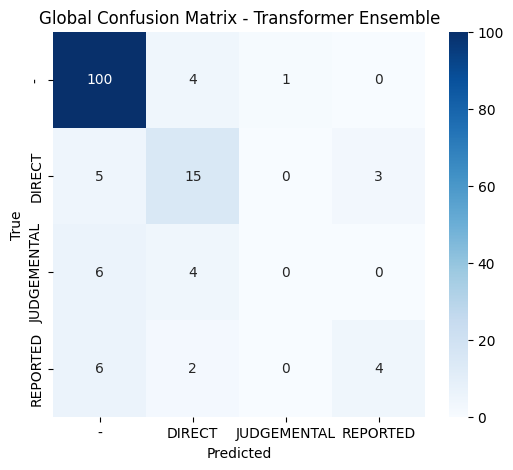

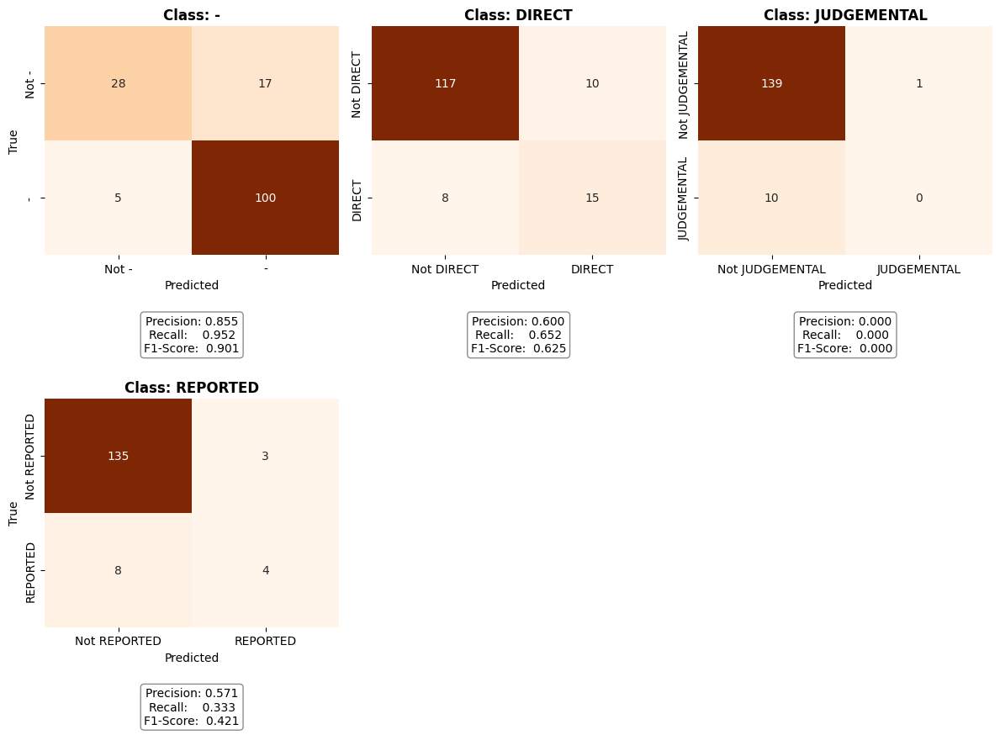

In [ ]:
_, _, _, _ = evaluate_ensemble_confidence_selection(
    models=hf_trainers,
    X_test=tokenized_eval_dataset,
    y_test=None,
    tweets=val_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Transformer Ensemble"
)

## 7.2 Class-wise Error Distribution

The `build_confusion_error_table` function transforms the raw confusion matrix into a high-level diagnostic DataFrame. For each ground-truth class, it calculates the **error rate** and identifies the **dominant misclassification pattern** (the class most frequently predicted incorrectly). By masking the diagonal (correct predictions) and locating the maximum value among the remaining logits, this function isolates specific semantic overlaps between classes, providing a clear view of where the model struggles most.

**Observation:** A granular inspection of misclassifications reveals a distinct asymmetry in error distribution across all architectures. For the majority class **"-"**, the primary confusion occurs with **DIRECT**, suggesting a recurring semantic ambiguity where neutral spans are mistaken for direct quotes. Conversely, the minority classes, **DIRECT**, **JUDGEMENTAL**, and **REPORTED**, are predominantly misclassified as **"-"**. This unidirectional collapse of rare labels into the majority category is highly indicative of frequency bias: the model minimizes global loss by defaulting to the most prevalent class when confidence is low, a behavior driven by the severe class imbalance in the training data.





**Baseline**

In [ ]:
error_table_baseline = build_confusion_error_table(confusion_matrix=errors_baseline["confusion_matrix"], label_mapping=mapping_inverse)

error_table_baseline


,True class,Most confused with,Error %
0,-,DIRECT,10.61
1,DIRECT,-,70.97
2,JUDGEMENTAL,-,88.89
3,REPORTED,-,71.43


**Stacked**

In [ ]:
error_table_stacked = build_confusion_error_table(confusion_matrix=errors_stacked["confusion_matrix"], label_mapping=mapping_inverse)

error_table_stacked

,True class,Most confused with,Error %
0,-,DIRECT,10.61
1,DIRECT,-,61.29
2,JUDGEMENTAL,-,83.33
3,REPORTED,-,76.19


**Transformer**

In [ ]:
error_table_transformer = build_confusion_error_table(confusion_matrix=errors_transformer["confusion_matrix"], label_mapping=mapping_inverse)

error_table_transformer

,True class,Most confused with,Error %
0,-,REPORTED,7.82
1,DIRECT,-,40.32
2,JUDGEMENTAL,-,88.89
3,REPORTED,-,61.90


## 7.3 Error Rate by Text Length

The `analyze_errors_by_length` function investigates whether the length of input sequences correlates with model failure. It operates by separating correct predictions from erroneous ones and computing length metrics (both raw **Word Count** and, if a tokenizer is provided, precise **Token Count**).

The analysis produces three key outputs:
1.  **Descriptive Statistics:** A statistical comparison (mean, std, min/max) of text lengths for correct vs. incorrect predictions to identify global trends.
2.  **Distribution Visualization:** Side-by-side **Boxplots** and **KDE (Kernel Density Estimation) plots** to visually detect if errors are concentrated in specific length regions (e.g., very short ambiguous tweets or very long truncated ones).
3.  **Binning Analysis:** A bar chart displaying the **Error Rate** across specific length intervals, filtering out statistically insignificant bins to isolate length-dependent performance drops.

**Observations:**
The error-rate breakdown by text length highlights a clear architectural difference in how sequence information is exploited. For both LSTM-based models, performance peaks for medium-length tweets (approximately 30–40 words) and then degrades as the sequence becomes longer. A plausible explanation is that, despite gating mechanisms, recurrent encoders can become increasingly sensitive to long-range dependencies, cumulative noise, and saturation effects in the hidden state when inputs grow, which may reduce their ability to preserve fine-grained cues needed for correct labeling. In addition, longer tweets are more likely to include multiple discourse phenomena (e.g., mixed reporting styles, topic shifts, or multiple quotation-like fragments), which can increase label ambiguity and amplify exposure to compounding errors in purely sequential representations.

In contrast, the transformer exhibits a comparatively stable error rate across token counts, consistent with the inductive bias of self-attention to model non-local interactions without relying on a single compressed recurrent state. This length-robust behavior may also be reinforced by pretraining on large-scale social-media text, which can yield representations that generalize more uniformly across varying input lengths and linguistic variability. Overall, these findings suggest that length acts as a stress test for recurrent architectures, where representational bottlenecks and long-range credit assignment are limiting, whereas the transformer’s attention-based encoding provides a more length-invariant mechanism for aggregating evidence across the sequence.


**Baseline**


=== Error Analysis: Text Length Impact ===

 Statistics for Word Count ---
                     count       mean        std  min   50%   max
Correct Predictions  186.0  26.586022  13.078376  4.0  27.0  55.0
Wrong Predictions     94.0  26.446809  14.579863  2.0  24.0  54.0
Mean Difference (Wrong - Correct): -0.14


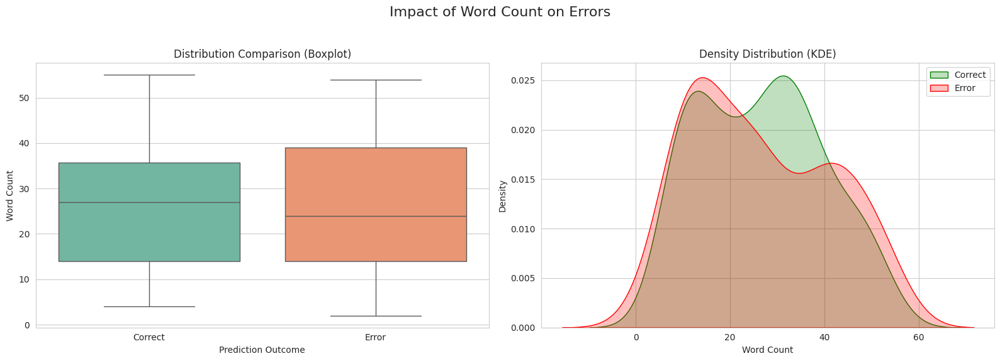


--- Error Rate by Length Buckets ---


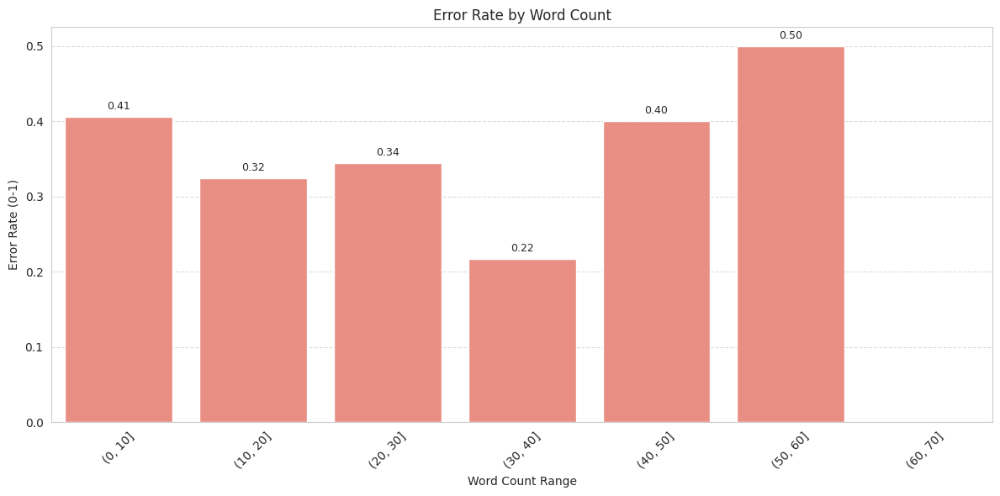

In [ ]:
analyze_errors_by_length(raw_baseline, errors_baseline, tokenizer=None)

**Stacked**



=== Error Analysis: Text Length Impact ===

--- Statistics for Word Count ---
                     count       mean        std  min   50%   max
Correct Predictions  192.0  26.098958  13.017733  2.0  26.0  55.0
Wrong Predictions     88.0  27.500000  14.750024  6.0  24.0  54.0
Mean Difference (Wrong - Correct): 1.40


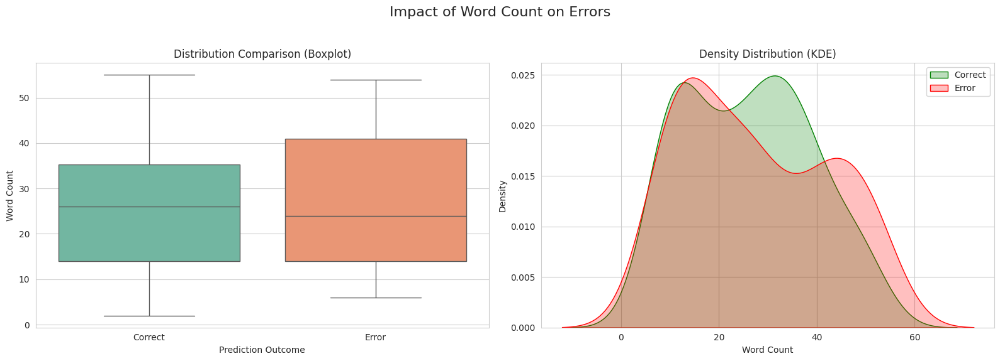


--- Error Rate by Length Buckets ---


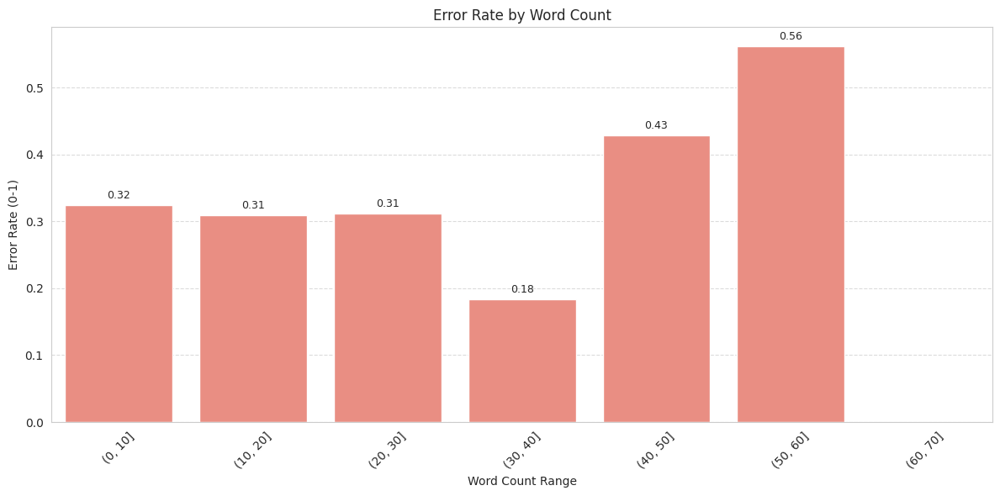

In [ ]:
analyze_errors_by_length(raw_stacked, errors_stacked, tokenizer=None)

**Transformer**


=== Error Analysis: Text Length Impact ===
Calculating token counts using the provided tokenizer...

--- Statistics for Word Count ---
                     count       mean        std  min   50%   max
Correct Predictions  212.0  26.254717  13.542324  4.0  26.0  55.0
Wrong Predictions     68.0  27.426471  13.738839  2.0  27.0  53.0
Mean Difference (Wrong - Correct): 1.17

--- Statistics for Token Count ---
                     count       mean        std  min   50%   max
Correct Predictions  212.0  31.698113  15.341095  7.0  30.0  68.0
Wrong Predictions     68.0  33.147059  15.062323  9.0  33.0  61.0
Mean Difference (Wrong - Correct): 1.45


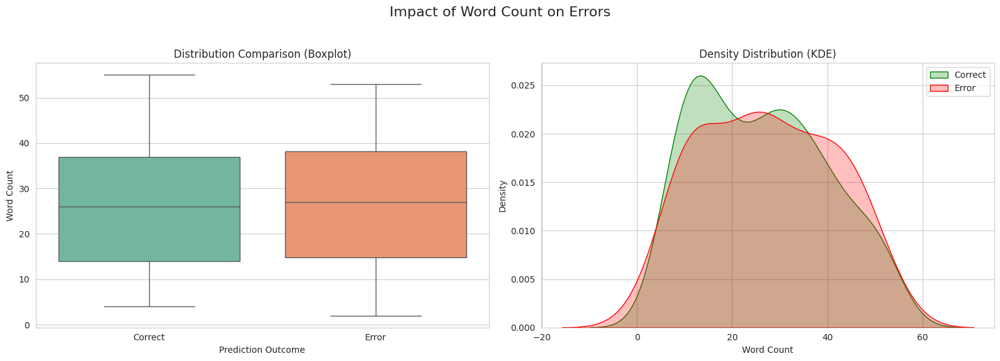

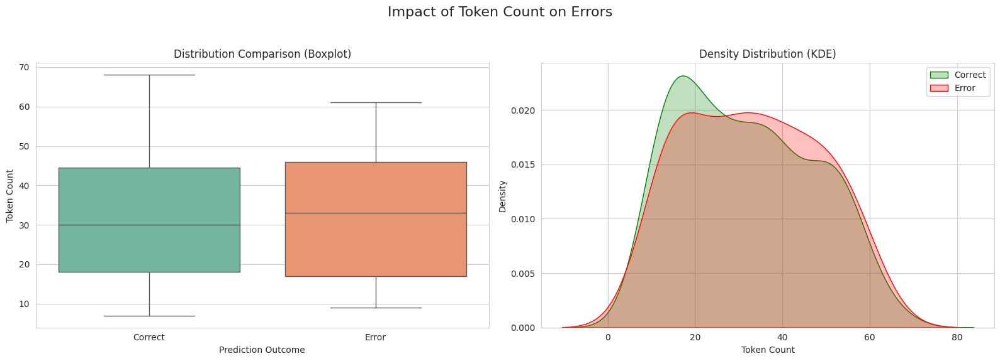


--- Error Rate by Length Buckets ---


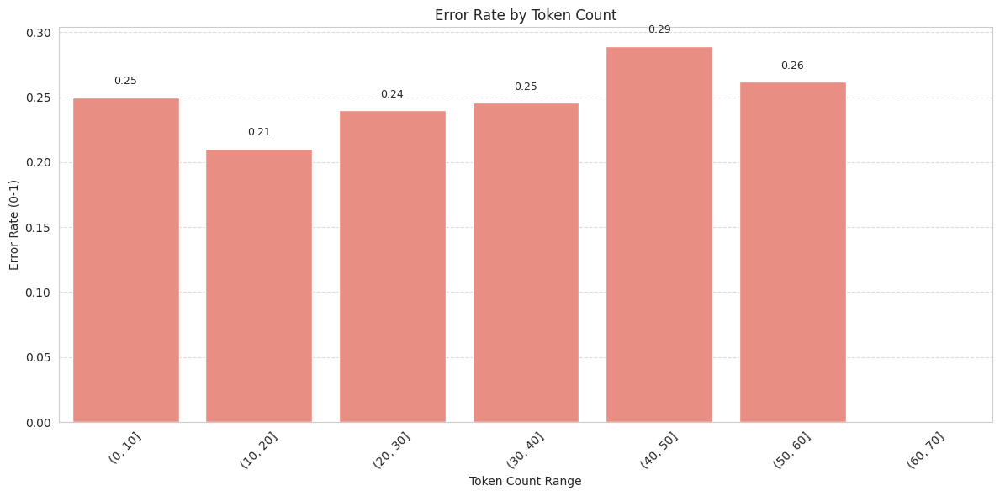

In [ ]:
analyze_errors_by_length(raw_transformer, errors_transformer, tokenizer=tokenizer)

## 7.4 Comparative Error and Disagreement Analysis

The `comparative_error_analysis` function performs a qualitative cross-examination of two distinct models. By aligning predictions and confidence scores sample-by-sample, it isolates critical instances of **divergence**, allowing for a granular investigation into how decision boundaries differ between architectures.

The analysis categorizes and samples instances from three diagnostic subsets:
1.  **Exclusive Success (Model A):** Cases where Model A predicts correctly while Model B fails.
2.  **Exclusive Success (Model B):** Cases where Model B predicts correctly while Model A fails.
3.  **Mutual Failure:** "Hard" instances where both models fail to identify the ground truth.

**Observation**

* **Baseline vs Stacked LSTM:** Exclusive successes for the Stacked LSTM frequently occur in cases where the Baseline over-triggers **DIRECT** on tweets whose gold label is "-" (e.g., informal declaratives and personal narration), suggesting the deeper recurrent encoder may be more conservative in assigning DIRECT by integrating broader context and attenuating spurious quote-like cues. Conversely, "Baseline-only" wins include flips between **REPORTED** and **DIRECT**, indicating that increased recurrent depth does not uniformly improve fine-grained discourse attribution and may increase sensitivity to local lexical patterns that resemble quoting.

* **Baseline LSTM vs Transformer:** Several "Transformer-only" successes align with the LSTM tendency to collapse minority labels into "-", where the Baseline predicts "-" for gold **DIRECT** instances that are expressed as attributed stance-like statements. In contrast, "Baseline-only" wins highlight that the Transformer can under-detect **REPORTED** in news-like, information-dense tweets (e.g., announcements), reverting to "-" when reporting signals are subtle or stylistically atypical relative to learned cues.

* **Stacked LSTM vs Transformer:** The Transformer’s exclusive successes often occur when the Stacked LSTM over-predicts **DIRECT** on gold "-" or **JUDGEMENTAL** instances, suggesting that self-attention may better separate evaluative stance from direct-quote cues when both are present. However, the Stacked LSTM also wins on multiple examples where the Transformer collapses minority labels (**DIRECT/JUDGEMENTAL/REPORTED**) into "-", reinforcing that a key residual failure mode is conservative majority-class defaulting under ambiguity.


In [ ]:
error_analysis_table = comparative_error_analysis(raw_a = raw_baseline, raw_b = raw_stacked,
                                                  model_a_name="Baseline LSTM",  model_b_name="Stacked LSTM",  n_samples_per_case=3)

error_analysis_table

,tweet,true_label,Baseline LSTM,Stacked LSTM,comment
0,isa hot girl summer now pop yall shit,-,DIRECT (0.781),- (0.948),Correctly classified by Stacked LSTM but misclassified by Baseline LSTM.
1,my baby call me mommy sha for the first time today twice yall dont understand how hype that make me baby girl have autism and get her to talk without be prompt have be a challenge shes come so far,-,DIRECT (0.991),- (0.999),Correctly classified by Stacked LSTM but misclassified by Baseline LSTM.
2,new vacancy alert eput be recruit for band 5 substance misuse nurse click on the link now if you be interested in apply for this post,-,REPORTED (0.868),- (1.000),Correctly classified by Stacked LSTM but misclassified by Baseline LSTM.
3,have i miss something or have phallocentrism become the late cult,JUDGEMENTAL,- (0.956),DIRECT (1.000),Incorrectly classified by both models
4,fuck that cunt try to vote her out multiple time,DIRECT,- (0.932),- (1.000),Incorrectly classified by both models
5,fuck sake be it possible to have a furry space thats not explicitly contentrestricted and doesnt immediately become yet another showcase for sizequeen phallocentrism,JUDGEMENTAL,- (1.000),- (1.000),Incorrectly classified by both models
6,woman before soy oil and corn syrupthose be just typical woman average back thenn,DIRECT,DIRECT (0.975),JUDGEMENTAL (0.971),Correctly classified by Baseline LSTM but misclassified by Stacked LSTM.
7,it be hard to be a woman you must think like a man act like a lady look like a young girl and work like a horse,REPORTED,REPORTED (0.727),DIRECT (1.000),Correctly classified by Baseline LSTM but misclassified by Stacked LSTM.
8,it not a trapper it a knee slapper drink a trapper by syc brewing co branden arthur memorial garden,-,- (0.999),DIRECT (0.992),Correctly classified by Baseline LSTM but misclassified by Stacked LSTM.


In [ ]:
error_analysis_table = comparative_error_analysis(raw_a = raw_baseline, raw_b = raw_transformer,
                                                  model_a_name="Baseline LSTM", model_b_name="Transformer", n_samples_per_case=3)

error_analysis_table

,tweet,true_label,Baseline LSTM,Transformer,comment
0,be a feminine masculine amp the whole range of human expression that fall outside those two stunt sexrolestereotypes gender in whatever body you be bear in but sexed body have ramification especially 4 female amp transgress those boundary be dangerous 4,-,JUDGEMENTAL (0.999),- (0.975),Correctly classified by Transformer but misclassified by Baseline LSTM.
1,new vacancy alert eput be recruit for band 5 substance misuse nurse click on the link now if you be interested in apply for this post,-,REPORTED (0.868),- (0.994),Correctly classified by Transformer but misclassified by Baseline LSTM.
2,they arent because when a woman be financially stable she believe she doesnt need a man,DIRECT,- (1.000),DIRECT (0.735),Correctly classified by Transformer but misclassified by Baseline LSTM.
3,ah here she be work hard to promote the patriarchy exploit the light music club girl like porn victim by make them drink tea eat cake and occasionally play cute song or something also trick young woman into like the show how dare she,JUDGEMENTAL,- (1.000),REPORTED (0.770),Incorrectly classified by both models
4,why do the white woman have to be bougie because she didnt want her child expose the conversationso be be we suppose to accept this a part of the black culture too,-,DIRECT (1.000),REPORTED (0.501),Incorrectly classified by both models
5,2 poker room the other fallacy i think you have be in term of your comparison to romance novel while you may be correct that there may be a difference in interest in your comparison there be no barrier for men to buy romance novel woman have to brace themselves for,JUDGEMENTAL,- (1.000),- (0.989),Incorrectly classified by both models
6,in movie and tv show of the 1950s and 1960s men would spank woman who have go astray or whatever remind u that all punishment must include a physical element as well,JUDGEMENTAL,JUDGEMENTAL (0.973),REPORTED (0.814),Correctly classified by Baseline LSTM but misclassified by Transformer.
7,wtfdont stress kimberly id treat a man the same way extremely poor effort to defend your grifting off vulnerable people,-,- (1.000),REPORTED (0.664),Correctly classified by Baseline LSTM but misclassified by Transformer.
8,kabul islamic emirate of afghanistan have announce the end of coeducation in the country cite gender harassmentfemale student will attend university on monday wednesday and saturday while tuesday thursday and sunday be fix for male,REPORTED,REPORTED (0.997),- (0.879),Correctly classified by Baseline LSTM but misclassified by Transformer.


In [ ]:
error_analysis_table = comparative_error_analysis(raw_a = raw_stacked, raw_b = raw_transformer,
                                                  model_a_name="Stacked LSTM", model_b_name="Transformer", n_samples_per_case=3)

error_analysis_table

,tweet,true_label,Stacked LSTM,Transformer,comment
0,they want woman to be mother so bad but cant even provide for them make it make sense,JUDGEMENTAL,DIRECT (0.941),JUDGEMENTAL (0.542),Correctly classified by Transformer but misclassified by Stacked LSTM.
1,uh theyre allow to call this out make you look like a cunt fortunately ill block you so fast you wont get your screenshot,-,DIRECT (0.999),- (0.896),Correctly classified by Transformer but misclassified by Stacked LSTM.
2,sex a in gender harassment be what they be infer,-,REPORTED (1.000),- (0.991),Correctly classified by Transformer but misclassified by Stacked LSTM.
3,go weak rn play the guitar manspreading i be on my knee,DIRECT,- (1.000),- (0.986),Incorrectly classified by both models
4,the question be do i wear the very short skirt that literally show my as with kneehighs or opt out for a short,-,DIRECT (1.000),DIRECT (0.840),Incorrectly classified by both models
5,yea back when i didnt even have one to slap unfortunate,DIRECT,- (1.000),- (0.988),Incorrectly classified by both models
6,kabul islamic emirate of afghanistan have announce the end of coeducation in the country cite gender harassmentfemale student will attend university on monday wednesday and saturday while tuesday thursday and sunday be fix for male,REPORTED,REPORTED (1.000),- (0.879),Correctly classified by Stacked LSTM but misclassified by Transformer.
7,dear fan can we not harass talented actor of color stop be racist douche nozzle this be why we cant have nice thing moses be a badass inquisitor and yall cant handle her badassary,JUDGEMENTAL,JUDGEMENTAL (0.998),- (0.990),Correctly classified by Stacked LSTM but misclassified by Transformer.
8,jealous plss talk about his new album u wrinkly slutbag,DIRECT,DIRECT (1.000),- (0.978),Correctly classified by Stacked LSTM but misclassified by Transformer.


## 7.5 Linguistic Robustness: Slang Impact Analysis
The `slang_error_rate_analysis` function quantitatively assesses the model's stability when processing informal or non-standard language. By filtering samples against a predefined lexicon of common internet slang and abbreviations, the function isolates a subset of "noisy" texts. It then computes the **conditional error rate** for this subset and compares it against the global error baseline. This analysis reveals whether the model's performance degrades in the presence of colloquialisms, indicating a potential vulnerability to lexical noise or out-of-distribution vocabulary.

**Observation:** The slang-focused robustness check shows a consistent degradation in performance when restricting evaluation to tweets containing slang: the error rate increases from 0.34 to 0.41 for the **Baseline**, from 0.31 to 0.38 for the **Stacked** LSTM, and from 0.24 to 0.28 for the **Transformer**. This pattern suggests that slang acts as a domain shift that perturbs lexical cues and increases surface-form variability, which is particularly challenging for GloVe-based LSTMs where non-standard spellings and informal constructions are more likely to be weakly represented (or mapped to an undifferentiated OOV embedding), reducing discriminative signal. Notably, the **Transformer** remains the most robust: although its error increases under slang, the absolute degradation is smaller than for the LSTM models, consistent with the hypothesis that contextual subword tokenization and pretraining on social-media text improve resilience to non-canonical language and spelling variation.


In [ ]:
SLANG = {
    "lol", "lmao", "wtf", "idk", "imo", "smh", "tbh",
    "u", "ur", "pls", "plz", "bc", "tho", "rn"
}

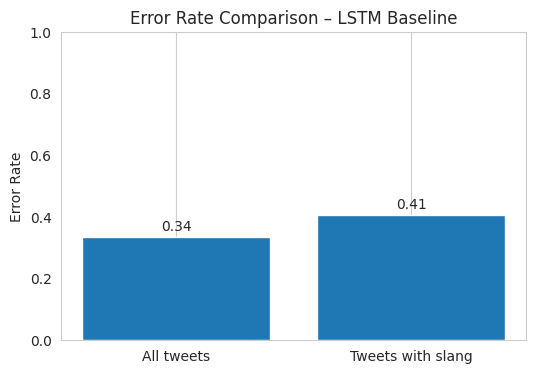

In [ ]:
baseline_slang_results = slang_error_rate_analysis(raw_df=raw_baseline, model_name="LSTM Baseline")

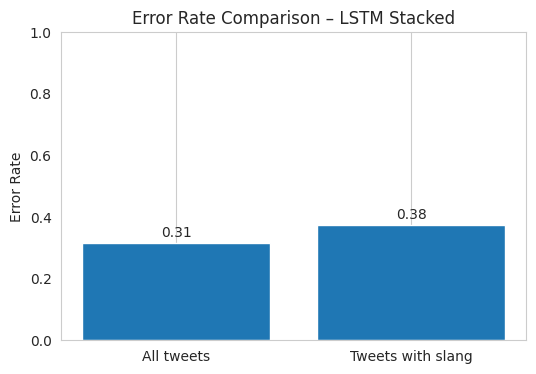

In [ ]:
stacked_slang_results = slang_error_rate_analysis(raw_df=raw_stacked,model_name="LSTM Stacked")

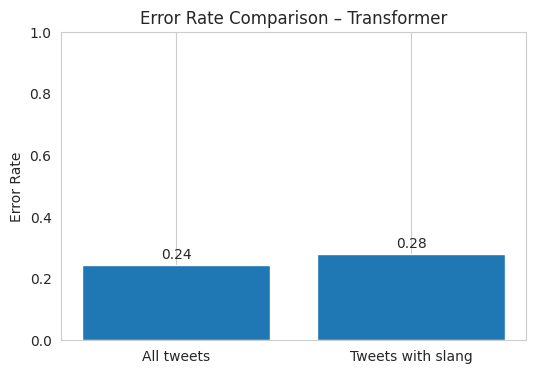

In [ ]:
transformer_slang_results = slang_error_rate_analysis(raw_df=raw_transformer, model_name="Transformer")

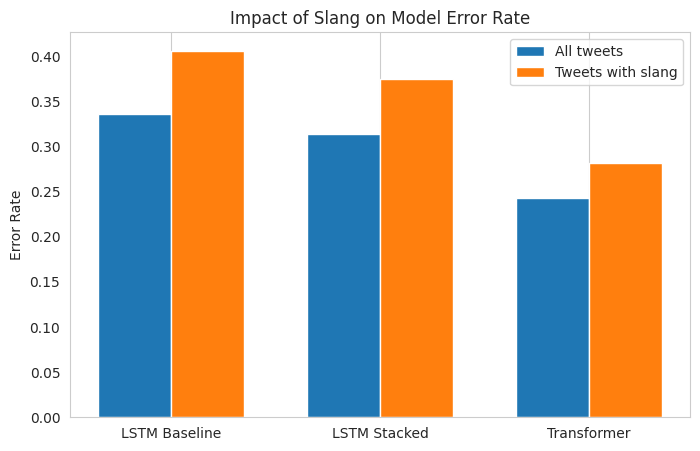

In [ ]:
results = [ baseline_slang_results, stacked_slang_results, transformer_slang_results]

labels = [r["model"] for r in results]
overall = [r["overall_error_rate"] for r in results]
slang = [r["slang_error_rate"] for r in results]

x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(8, 5))
plt.bar(x - width/2, overall, width, label="All tweets")
plt.bar(x + width/2, slang, width, label="Tweets with slang")

plt.xticks(x, labels)
plt.ylabel("Error Rate")
plt.title("Impact of Slang on Model Error Rate")
plt.legend()
plt.grid(axis="y")
plt.show()


##7.6 Impact of OOV Tokens
This section investigates the robustness of different architectures against vocabulary limitations. The `oov_count_error_analysis` function specifically correlates the density of **OOV** tokens, words represented as `<UNK>` in the LSTM's fixed vocabulary with prediction accuracy.

It is important to clarify that **we do not count OOV tokens for the Transformer**. Transformers utilize **subword tokenization algorithms**. When they encounter a rare word, they do not map it to a single `<UNK>` token; instead, they decompose it into known sub-units. Consequently, Transformers rarely produce "true" unknown tokens.

In this analysis, we use the **LSTM's OOV count** as a proxy for **lexical rarity**. We group tweets based on how many words were invisible to the LSTM, and then evaluate the Transformer on those same specific tweets. This approach allows us to answer: *"Can the Transformer's subword architecture successfully recover the meaning of rare words that completely blind the LSTM?"*


### 7.6.1 Error Rate vs. OOV Token Count

This analysis proceeds in three steps:
1.  **Quantification:** It computes the absolute count of OOV tokens for every input sample based on the LSTM's integer-encoded sequences.
2.  **Binning:** Samples are grouped into discrete buckets based on their "unknown" token count
3.  **Comparative Profiling:** It calculates the error rate for both the LSTM and the Transformer model within each bin.

**Observation:** The Error Rate vs. OOV Token Count analysis indicates that increasing lexical rarity (measured via the LSTM’s OOV count) degrades performance for **both** architectures, but with markedly different resilience profiles. For low to moderate OOV ranges, the Transformer consistently exhibits lower error rates than the LSTM on the *same* tweets, suggesting that subword tokenization effectively mitigates the information loss that occurs when the LSTM collapses rare words into a single **OOV** embedding. However, in the \[5, 7) OOV bin, the Transformer’s error briefly spikes and approaches or even exceeds the LSTM’s error, which may reflect cases where extreme lexical corruption or creative spelling yields subword segmentations that are themselves uninformative, limiting the benefits of subword modeling. At very high OOV counts, the Transformer’s error drops again and remains clearly below the LSTM’s, indicating that, on heavily corrupted or extremely slangy inputs, the LSTM’s fixed OOV representation saturates while the Transformer can still recover partial semantic cues from subword patterns, leading to more graceful degradation under severe lexical shift.

/tmp/ipython-input-2510149322.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_lstm.groupby("oov_bin").apply(
/tmp/ipython-input-2510149322.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped = df_lstm.groupby("oov_bin").apply(


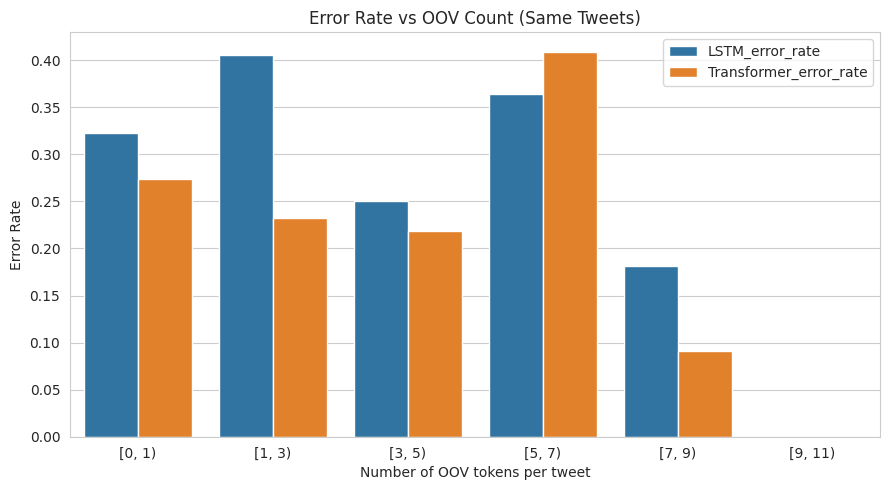

In [ ]:
stats_df, lstm_aug_df = oov_count_error_analysis(
    raw_lstm_df=raw_baseline,
    raw_transformer_df=raw_transformer,
    X_lstm_ids=X_test_ids,
)

plot_oov_count_error_comparison(stats_df)

### 7.6.2 Qualitative Analysis: Information Loss & Interpretability
The `analyze_human_interpretability` function bridges the gap between quantitative metrics and qualitative understanding. It is designed to visualize the **information loss** incurred by fixed-vocabulary models when encountering unknown terms.

The function performs the following operations:
1.  **Filtering:** It isolates samples containing a significant number of OOV tokens (defined by `min_unk_count`).
2.  **Stratification:** It samples instances from two distinct behavioral groups:
    *   **Wrong Predictions:** Cases where the loss of specific keywords (replaced by `<UNK>`) likely caused the classification error.
    *   **Correct Predictions:** Cases where the model successfully inferred the sentiment despite the missing lexical information (contextual robustness).


**Observation:**

* In the example *“ladies… dont let anyone body shame you… you be fat so what… you be beautiful…”* (True: `-`, Pred: `-`), the masked version still preserves the core pragmatic intent: an encouragement/affirmation message with a clear positive stance toward body image. Even though several content words are replaced, the remaining lexical anchors ("body shame", "fat", "beautiful", "confident") are sufficient for a human reader to reconstruct meaning, and the model’s correct prediction is consistent with the fact that the label decision can be driven by redundant, high-salience cues that survive masking.

* By contrast, the *REPORTED* instance *“the violent antifeminism of a far-right movement…”* (True: `REPORTED`, Pred: `-`) becomes substantially less interpretable after masking, because multiple high-information tokens that signal topic framing and reporting-style discourse are removed e.g., abstract political descriptors and relational phrases. In the masked input, the sentence degrades into a sequence of generic fragments which obscures the propositional structure and weakens the discourse cues that distinguish reporting from generic commentary. In this regime, even a human may struggle to confidently infer the intended communicative function, and the model’s collapse to the majority label `-` is consistent with a scenario where the remaining tokens no longer provide enough discriminative evidence for minority-class attribution.


In [ ]:
styled_df = analyze_human_interpretability(errors_baseline, X_test_ids, id2token,
                                           test_df["tweet"].tolist(), mapping_inverse,
                                           unk_id=1, min_unk_count=1, n_samples=5)

styled_df

,Group,Num <UNK>,True Label,Pred Label,Original Text,Model Input (Masked)
0,Wrong Prediction,1,REPORTED,-,call to clean up parliament laddish culture after mp porn shame via,call to clean up <UNK> laddish culture after mp porn shame via
1,Wrong Prediction,4,REPORTED,-,the violent antifeminism of a farright movement that see principally a vessel for breed a new white generation express itself in a fixation on a return to traditional gender rolesworth every minute to read take 5 min out of your sun,the violent <UNK> of a farright movement that see <UNK> a vessel for breed a new white generation express itself in a <UNK> on a return to traditional gender <UNK> every minute to read take 5 min out of your sun
2,Wrong Prediction,3,DIRECT,-,it just show how money rule the world im so disappoint that ripleys would even allow it out of the building and to let that reality skank get it be an incredible insult i be wait for an sub full of armed robber to overtake her in the end khloe look well,it just show how money rule the world im so disappoint that <UNK> would even allow it out of the building and to let that reality skank get it be an incredible insult i be wait for an sub full of armed <UNK> to <UNK> her in the end
3,Wrong Prediction,4,-,JUDGEMENTAL,be a feminine masculine amp the whole range of human expression that fall outside those two stunt sexrolestereotypes gender in whatever body you be bear in but sexed body have ramification especially 4 female amp transgress those boundary be dangerous 4,be a feminine masculine amp the whole range of human expression that fall outside those two <UNK> <UNK> gender in whatever body you be bear in but <UNK> body have <UNK> especially 4 female amp transgress those boundary be dangerous 4
4,Wrong Prediction,2,JUDGEMENTAL,-,fuck sake be it possible to have a furry space thats not explicitly contentrestricted and doesnt immediately become yet another showcase for sizequeen phallocentrism,fuck sake be it possible to have a furry space thats not explicitly <UNK> and doesnt immediately become yet another showcase for <UNK> phallocentrism
5,Correct Prediction,2,-,-,some people interpret tlj have a metanarrative deconstruction of luke star war whatever i mean it in that sense,some people interpret tlj have a metanarrative <UNK> of <UNK> star war whatever i mean it in that sense
6,Correct Prediction,4,-,-,ladiesdont let anyone body shame you in any wayyou be fat so whatyou be beautiful my dearbe confident in yourselfpeace,<UNK> let anyone body shame you in any wayyou be fat so <UNK> be beautiful my <UNK> confident in <UNK>
7,Correct Prediction,1,-,-,allnewtwice a many invest in which mean be twice a smart,<UNK> a many invest in which mean be twice a smart
8,Correct Prediction,4,-,-,some far right outlet might work to normalize fascism nationalism and nazism most main stream medium in western country portray nazism a an unwanted ideology and rightfully so,some far right outlet might work to normalize fascism nationalism and <UNK> most main stream medium in western country portray <UNK> a an <UNK> ideology and <UNK> so
9,Correct Prediction,2,-,-,veecon commencement speech by the man himself,<UNK> <UNK> speech by the man himself


## 7.7 Comparative Precision-Recall Analysis

The `plot_pr_curves_subplot` function generates a comparative 1x3 visualization to assess the trade-off between **Precision** and **Recall** across the three different modeling architectures.

For each architecture, the function:
1.  **Reconstructs Prediction Scores:** It retrieves the specific probability vectors associated with the model's final decisions. For ensemble-based inputs, it dynamically selects the probabilities from the "winning" sub-model for each sample.
2.  **Calculates Per-Class Metrics:** It computes the Precision-Recall curve and the Average Precision (AP) score for every class independently.
3.  **Visualizes Performance:** The side-by-side layout facilitates an immediate visual comparison of how each architecture handles the precision/recall trade-off, revealing which model maintains high precision at higher recall levels for specific sentiments.

**Observation:** The precision-recall curves highlight substantial class-dependent separability and further corroborate the impact of label imbalance. Across models, the majority class **"-"** exhibits the strongest P/R trade-off (high precision sustained over a wide recall range), yielding the highest average precision, which is expected given its dominance and the abundance of training signal. In contrast, the minority classes-especially **JUDGEMENTAL** and **REPORTED** show markedly lower precision at moderate-to-high recall, indicating that attempts to recover more true positives for these labels quickly introduce many false positives, i.e., the decision boundary for these categories is poorly supported and/or strongly overlapping with competing labels.


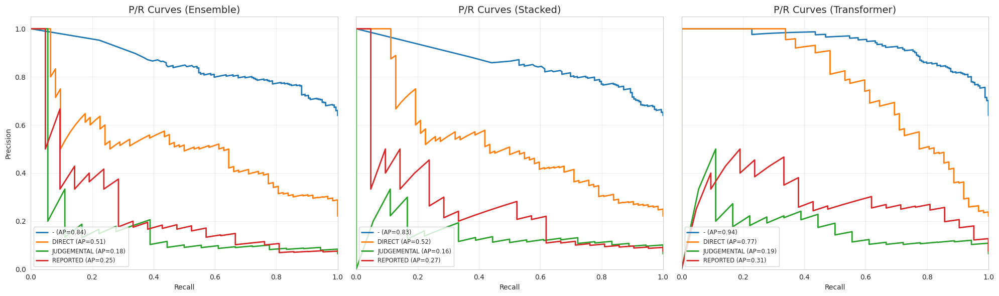

In [ ]:
plot_pr_curves_subplot([errors_baseline, errors_stacked, errors_transformer],
                       ["P/R Curves (Ensemble)", "P/R Curves (Stacked)", "P/R Curves (Transformer)"],
                       mapping_inverse)

## 7.8 Failure Mode Analysis: High-Confidence Errors
The `get_high_confidence_errors` function isolates the most critical classification failures i.e instances where the model was not only wrong but **highly confident** in its incorrect prediction.

For each ground-truth class, the function:
1.  **Extracts Error Confidences:** It retrieves the scalar confidence score associated with the false prediction (the "winning" score that triggered the selection).
2.  **Ranks by Severity:** It sorts the misclassified samples in descending order of confidence.
3.  **Retrieves Top-N Cases:** It returns the most egregious examples for each class.

**Observation:** A representative high-confidence failure is the tweet: *"yall be husband and wife and best friend… it awesome you keep each other laughing and smile"* (true label: **"-"**, predicted: **DIRECT**, confidence = 0.99998). A plausible explanation is that the baseline BiLSTM is over-relying on **surface-level conversational markers** (e.g., second-person address, colloquial discourse, and affective phrasing) that are statistically correlated with DIRECT in the training data, even though the utterance is not an explicit quote/reporting act under the gold annotation. Under severe class imbalance and imperfect label separability, these "shortcut" lexical cues can become highly weighted, producing *miscalibrated certainty* when the input strongly matches a learned prototype of DIRECT, despite lacking definitive structural signals that would disambiguate the class.


In [ ]:
top_errors = get_high_confidence_errors(error_analysis=errors_baseline, label_mapping=mapping_inverse, n_samples=3)

top_errors

Returned top 3 high-confidence errors for 4 classes.


,true_label,predicted_label,confidence,tweet
0,-,DIRECT,0.999982,yall be husband and wife and best friend you guy have so much fun it awesome you keep each other laughing and smile
1,-,DIRECT,0.999941,why do the white woman have to be bougie because she didnt want her child expose the conversationso be be we suppose to accept this a part of the black culture too
2,-,DIRECT,0.999927,uh theyre allow to call this out make you look like a cunt fortunately ill block you so fast you wont get your screenshot
3,DIRECT,-,1.000000,yea back when i didnt even have one to slap unfortunate
4,DIRECT,-,1.000000,eat out both hole and then slide my dick in you and pound you till you squirt
5,DIRECT,-,1.000000,most woman nowadays look like this with no makeup hard to find the good one under ton of makeup always go on a date to the beach lol
6,JUDGEMENTAL,-,1.000000,2 poker room the other fallacy i think you have be in term of your comparison to romance novel while you may be correct that there may be a difference in interest in your comparison there be no barrier for men to buy romance novel woman have to brace themselves for
7,JUDGEMENTAL,-,1.000000,can you confront your misogyny misandry be hardly a problem in the world by comparison and if it exist it a reaction to abuse
8,JUDGEMENTAL,-,0.999999,it probably more common then they say it be because most woman will either ignore it or chalk it up to some hormonal or some pp thing some woman will not even connect it and just stop breastfeeding
9,REPORTED,-,1.000000,the violent antifeminism of a farright movement that see principally a vessel for breed a new white generation express itself in a fixation on a return to traditional gender rolesworth every minute to read take 5 min out of your sun


# [Task 8 - 0.5 points] Report

This notebook contains the full implementation and detailed experimental procedures, while the accompanying report provides a concise summary of the key results and analyses, available [here](https://github.com/simoswish02/Sexism-Detection-on-Twitter---EXIST-2023-Task-2/blob/313534cc53c082d246e5ccf8cc98ff9cb8409fb2/Report.pdf).


#   9.  Experimental Conclusions and Technical Analysis



## 9.1 Performance Hierarchy and Architectural Progression
This study evaluated three distinct architectures, observing a clear progressive improvement in performance as model complexity and pre-training knowledge increased:

*   **Baseline (Bi-LSTM + GloVe):** The single-layer Bi-LSTM served as a foundational baseline, achieving an average Macro F1 of **0.386**. While effective at capturing sequential dependencies, it was limited by the fixed vocabulary of GloVe embeddings and a shallower architecture.
*   **Stacked (2-layer Bi-LSTM + GloVe):** Increasing the network depth allowed the model to learn more abstract representations of the text. This resulted in a noticeable improvement, raising the average Macro F1 to **0.423** (+3.7% absolute gain over baseline).
*   **Transformer (Twitter-RoBERTa):** The Transformer model demonstrated superior performance, achieving the highest average Macro F1 of **0.481**. This substantial leap (+5.8% over Stacked, +9.5% over Baseline) validates the efficacy of attention mechanisms over recurrent networks for this task.




## 9.2 The Bottleneck of Static Embeddings (GloVe) vs. Dynamic Tokenization
A critical factor differentiating the architectures was the input representation method. The LSTM models relied on **GloVe (100d)** pre-trained vectors, which introduced significant constraints:

*   **The Out-Of-Vocabulary Problem:** Twitter data is noisy and full of neologisms. Words present in our training set but missing from GloVe were mapped to **randomly initialized vectors**. This introduces noise, as the model attempts to learn geometric relationships for these random vectors from scratch with limited data.
*   **Static vs. Contextual:** GloVe is static; the word "bank" has the same vector regardless of context. Conversely, RoBERTa utilizes a **Byte-Pair Encoding (BPE)** tokenizer. This allows it to handle rare words by breaking them into sub-words (solving the OOV issue) and generating dynamic embeddings where the representation changes based on the surrounding sentence context.
*   **Domain-Specific Pre-training:** Unlike the LSTM models which were initialized with generic GloVe embeddings, this RoBERTa variant was pre-trained on a massive corpus of ~124 million tweets. This provides the model with an intrinsic understanding of platform-specific nuances (e.g. slang, sentence structure) before fine-tuning begins.

## 9.3 Impact of Text Preprocessing Pipeline
The preprocessing pipeline involved aggressive cleaning: removal of **hashtags, emojis, mentions, URLs, and special characters**, followed by **lemmatization**.

*   **For LSTMs:** This was a necessary step to reduce vocabulary sparsity and maximize the hit-rate with the fixed GloVe dictionary.
*   **Trade-off Analysis:** While this normalized the input, it likely discarded semantic signals. Emojis and hashtags often carry the primary sentiment payload in tweets. While the LSTMs benefited from the normalization, the RoBERTa model (which has an embedding for emojis and specific hashtags) might have performed even better if these features had been preserved, yet it still outperformed the baselines despite this information loss.



## 9.4 Ensemble Strategy: Confidence Maximization
Unlike traditional voting or averaging methods, we implemented a **"Most Confident" ensemble strategy**, selecting the prediction associated with the highest softmax probability across the three seeds.

*   **Mechanism:** This approach assumes that a model is "well-calibrated", meaning that when it is correct, it assigns a higher probability score compared to when it is guessing.
*   **Result:** This method proved highly effective, boosting the Transformer score to **0.5162** (vs the mean of 0.481). It suggests that the variance between seeds was not just random noise, but that different initializations converged on different local minima where they were "confident" about different subsets of the data. By picking the most confident prediction, we effectively filtered out weak classifications from individual seeds.



## 9.5 Intrinsic Task Difficulty and Subjectivity
Finally, it is crucial to contextualize these F1 scores (ranging from 0.41 to 0.51) within the nature of the task. Hate speech and sentiment classification are highly **interpretative tasks**.

*   **Human Baseline:** In literature,  [*Waseem, Z. (2016). "Are You a Racist or Am I Seeing Things? Annotator Influence on Hate Speech Detection on Twitter"*](https://aclanthology.org/W16-5618/), inter-annotator agreement for subjective tasks like hate speech detection varies significantly, often ranging between 0.60 and 0.80 (Cohen’s Kappa). This indicates that a 'perfect' score of 1.0 is unattainable even for humans due to the ambiguity of language (sarcasm, lack of context, or cultural differences).
*   **Conclusion:** The models are not just fighting architectural limitations but also the "noise" inherent in the ground truth labels. An F1 score of 0.51 is a strong result given that the theoretical ceiling is likely far below 1.0 due to this inherent subjectivity.

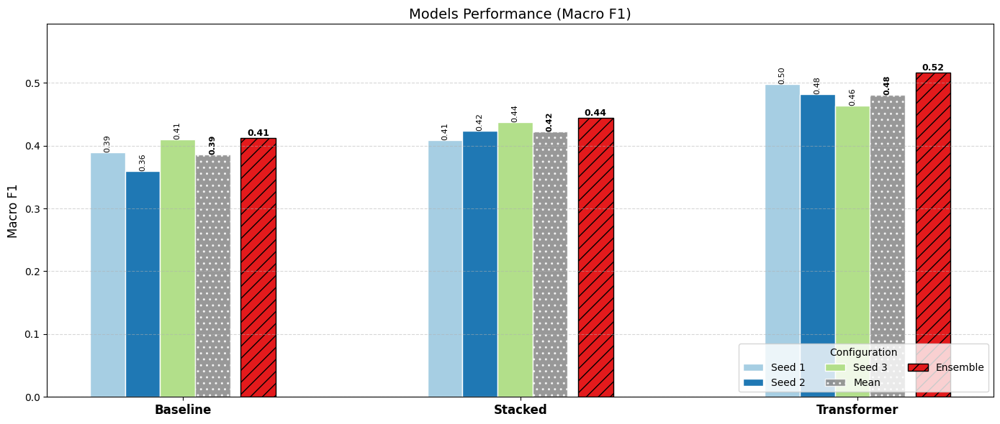

In [ ]:
all_models_dfs = {
    "Baseline": metrics_baseline_test,
    "Stacked": metrics_stacked_test,
    "Transformer": metrics_transformer_test
}

all_ensembles = {
    "Baseline": metrics_baseline_ensemble,
    "Stacked": metrics_stacked_ensemble,
    "Transformer": metrics_transformer_ensemble
}

plot_comparative_f1(all_models_dfs, all_ensembles, metric_name="Macro F1")

# 10. Exstensions

Beyond the core requirements of the assignment, we conducted additional exploratory analyses to investigate more advanced aspects of model design and training. The first extension focuses on the treatment of **out-of-vocabulary** words in embedding-based models. While the main experiments relied on random initialization for embeddings not covered by GloVe, we explored a simple **context-based** strategy in which OOV embeddings are inferred from surrounding known words. Although naive, this approach aims to provide a more informed initialization than purely random assignment.

A second extension targets performance improvements with respect to the macro F1-score. To this end, we experimented with a l**ess aggressive** and more transformer-oriented text preprocessing pipeline, better aligned with the characteristics of modern Twitter data. In addition, we investigated advanced training strategies, including **label smoothing**, **class reweighting**, and **dropout**, to mitigate class imbalance and improve generalization. These extensions are intended as exploratory analyses rather than definitive solutions, and their effects are discussed in detail in the following subsections.

## 10.1 Embedding Matrix with Context
In this section, we investigate an alternative strategy for handling OOV words by constructing the embedding matrix based on the local context of each OOV token, rather than assigning random vectors. This approach aims to exploit co-occurrence information within the training corpus to generate embeddings that are more semantically aligned with known words, providing a potentially more informative initialization for downstream classification models.


### 10.1.1 Context-Based Embedding Matrix Construction

The embedding matrix is constructed by combining pre-trained word vectors with a strategy for handling OOV terms. While in the standard setting OOV embeddings are initialized randomly, this section explores an alternative **context-based approach** that leverages local distributional information extracted from the training corpus.

Formally, let **V** be the vocabulary induced from the dataset and let $$E ∈ ℝ^{|V| × d}$$ denote the embedding matrix, where **d** is the embedding dimensionality. For any word **w ∈ V** that is present in the pre-trained embedding model, its corresponding row in **E** is initialized with the associated pre-trained vector. A single shared embedding is used for the special **<UNK>** token.

For OOV words, a context-based initialization strategy is optionally applied. Given an OOV token **w** occurring at position **i** in a tokenized sentence, its local context is defined as a symmetric window of size **k**, i.e.:

$$
C_i(w) = \{ w_j \mid j \in [i - k, i + k],\ j \neq i \}
$$

Only context words that are present in the pre-trained embedding space are considered. For each occurrence of **w**, the mean of the embeddings of its valid context words is computed. These context-based representations are accumulated across all occurrences of **w** in the corpus and averaged to obtain a single embedding:

$$
\mathbf{e}_w = \frac{1}{N} \sum_{n=1}^{N} \left( \frac{1}{|C_n(w)|} \sum_{v \in C_n(w)} \mathbf{e}_v \right)
$$

where **N** denotes the number of observed contexts for which at least one valid neighbor embedding is available.

If an OOV word never co-occurs with known words within the defined window, its embedding is initialized randomly. Although this strategy is intentionally simple and does not rely on external resources or additional training, it provides a more informed initialization than purely random assignment by exploiting local semantic regularities in the data.

Finally, a qualitative inspection of the embedding space through two-dimensional projections shows that context-based OOV embeddings are no longer concentrated in a single isolated cluster, as observed with random initialization, but are more evenly distributed among in-vocabulary words. This suggests that the proposed strategy yields embeddings that are better aligned with the global structure of the semantic space.

In [43]:
embedding_matrix_with_context = build_embedding_matrix(GloVe_embedder, embedding_dimension, token2id, oov_strategy='context',
                                                       df = train_df, text_column = 'tweet', k=5)

print(f"Embedding matrix shape: {embedding_matrix_with_context.shape}")


Embedding matrix shape: (9870, 100)


Running SVD reduction to 2D...
Annotating words in 2D: ['good', 'love', 'beautiful', 'johnleemushr', 'finna', 'resultus']


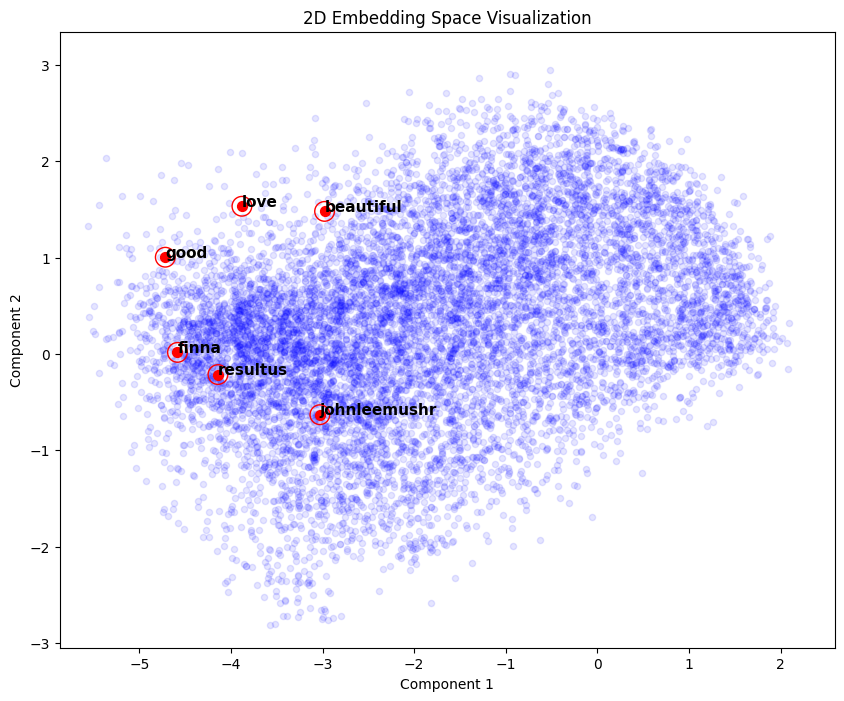

In [51]:
run_visualization('svd',  word_to_visualize, token2id, embedding_matrix_with_context, 2)

Running UMAP reduction to 2D...
Annotating words in 2D: ['good', 'love', 'beautiful', 'johnleemushr', 'finna', 'resultus']


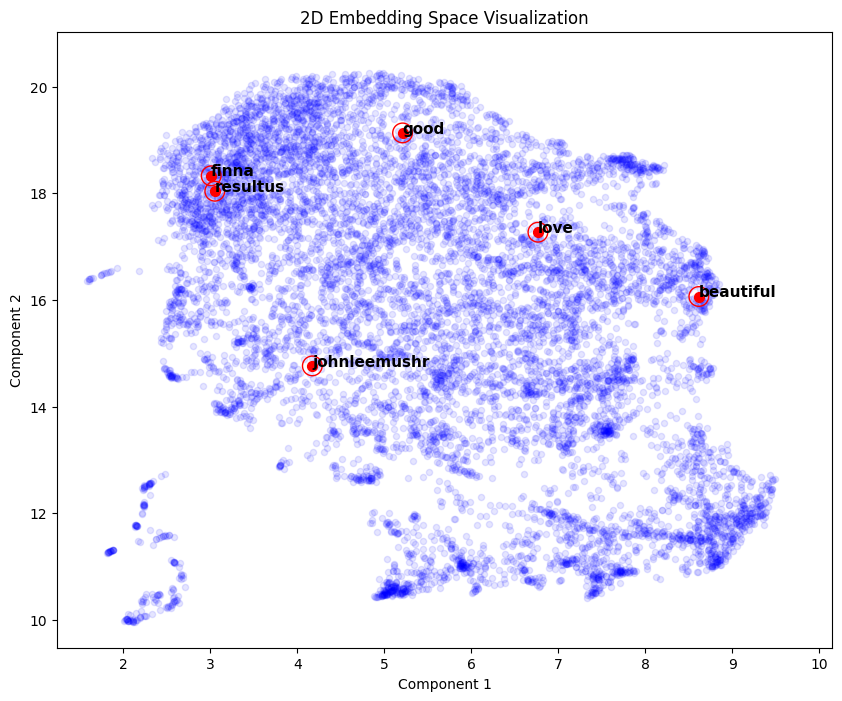

In [76]:
run_visualization('umap',  word_to_visualize, token2id, embedding_matrix_with_context, 2)

### 10.1.2 Baseline

In [56]:
models_baseline_list_context = []

for _ in seeds:
    models_baseline_list_context.append(build_baseline_with_embedding(max_len, embedding_matrix=embedding_matrix_with_context, trainable = True))

In [57]:
if train_notebook:
    histories = train_models(models_baseline_list_context, seeds, "Context Baseline Embedding LSTM", X_train_ids, y_train, X_val_ids, y_val, epochs=40, batch_size=128)

TRAINING: Context Baseline Embedding LSTM with Random Seed 111
Epoch 1/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.5932 - loss: 1.0297 - val_accuracy: 0.7000 - val_loss: 0.9575 - macro_f1: 0.2439 - val_macro_f1: 0.2255 - lr: 0.0010
Epoch 2/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.7141 - loss: 0.8244 - val_accuracy: 0.7000 - val_loss: 0.8999 - macro_f1: 0.3076 - val_macro_f1: 0.2417 - lr: 0.0010
Epoch 3/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.7292 - loss: 0.7635 - val_accuracy: 0.7133 - val_loss: 0.8427 - macro_f1: 0.3334 - val_macro_f1: 0.2616 - lr: 0.0010
Epoch 4/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.7405 - loss: 0.6959 - val_accuracy: 0.7467 - val_loss: 0.8083 - macro_f1: 0.4589 - val_macro_f1: 0.3839 - lr: 0.0010
Epoch 5/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.7796 - loss: 0.5983 - val_accuracy: 0.7267 - val_loss: 0.8462 - macro_f1: 0.4822 - val_macro_f1: 0.3246 - lr: 0.0010
Epoch 6/40
23/23 ━━━━━━━━━━

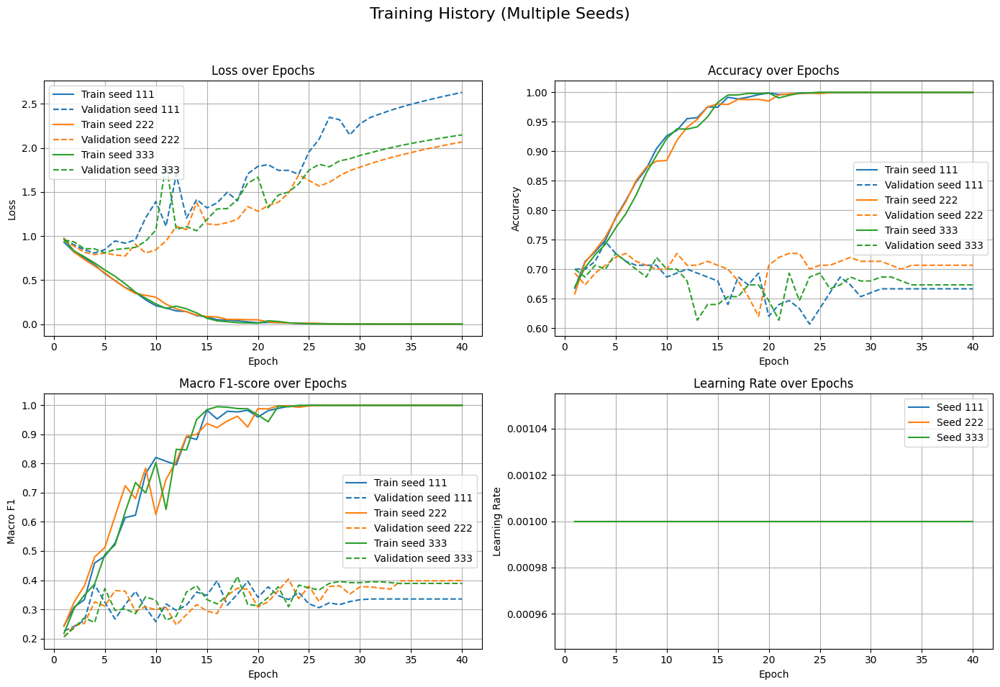

In [58]:
if train_notebook:
  plot_training_histories(histories, seeds)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
=== Evaluation Report: Context Baseline Embedding LSTM ===
Accuracy         : 0.6440 ± 0.0194
Macro F1         : 0.3852 ± 0.0258
Macro Precision  : 0.4175 ± 0.0340
Macro Recall     : 0.3738 ± 0.0231


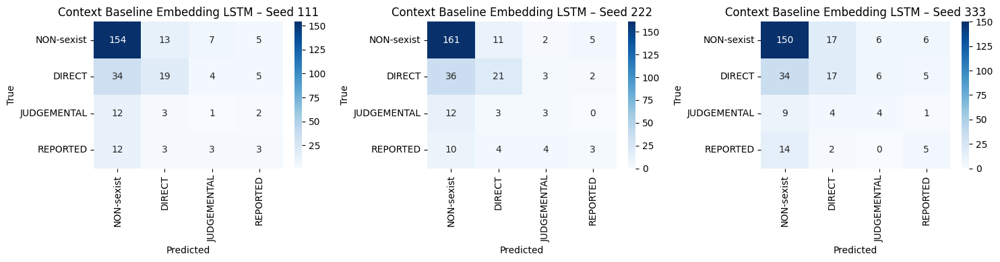

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.632143,0.671429,0.628571,0.644048,0.019416
Macro F1,0.348749,0.404609,0.402247,0.385202,0.025794
Macro Precision,0.373270,0.455905,0.423439,0.417538,0.033993
Macro Recall,0.341300,0.386919,0.393125,0.373781,0.023107


In [68]:
context_metrics_baseline_test = evaluate_models(models_baseline_list_context, X_test_ids, y_test, seeds, class_names=class_names, model_name="Context Baseline Embedding LSTM", )

context_metrics_baseline_test

Detected framework: Keras/Sklearn
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

=== Evaluation Report: Baseline Ensemble with Context ===
--------------------------------------------------
Accuracy         : 0.6607
Macro F1         : 0.3860
Macro Precision  : 0.4423
Macro Recall     : 0.3709
--------------------------------------------------


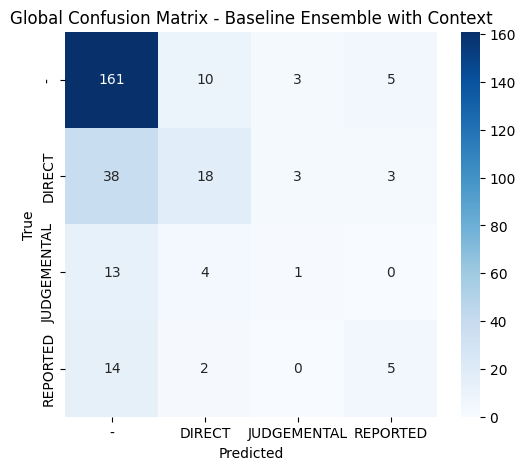

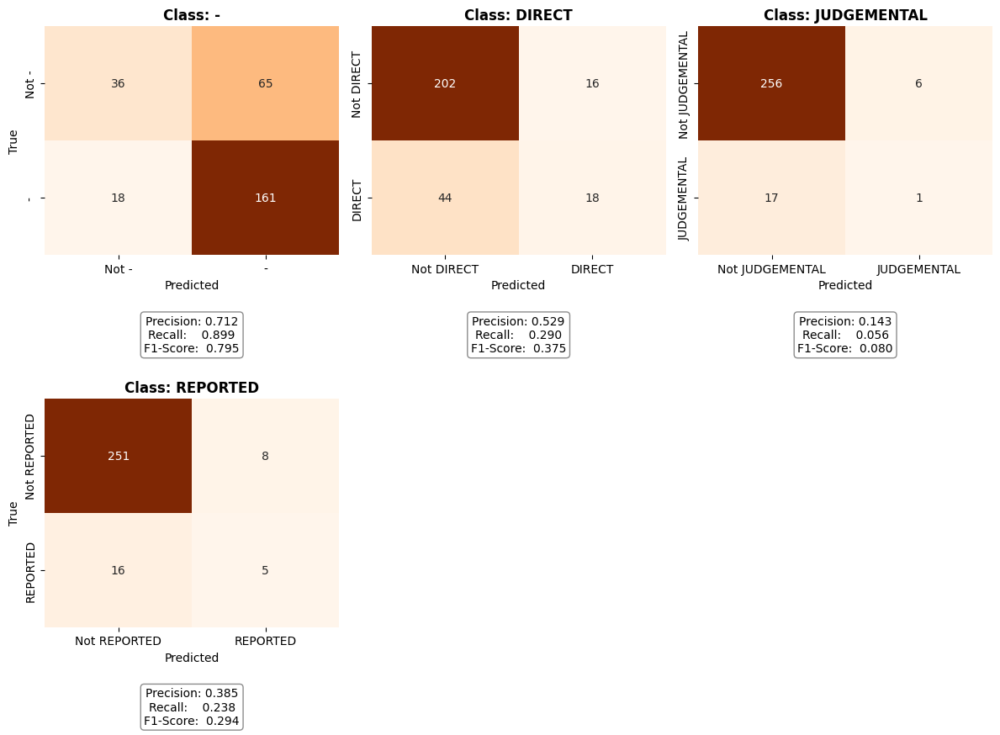

In [69]:
metrics_baseline_ensemble_context, _, _, _ = evaluate_ensemble_confidence_selection(
    models=models_baseline_list_context,
    X_test=X_test_ids,
    y_test=y_test,
    tweets=test_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Baseline Ensemble with Context"
)

### 10.1.3 Stacked

In [61]:
models_stacked_list_context = []

for _ in seeds:
    models_stacked_list_context.append(build_stacked_with_embedding(max_len, embedding_matrix=embedding_matrix_with_context, trainable = True))

In [62]:
if train_notebook:
    histories = train_models(models_stacked_list_context, seeds, "Context Stacked Embedding LSTM", X_train_ids, y_train, X_val_ids, y_val, epochs=40, batch_size=128)

TRAINING: Context Stacked Embedding LSTM with Random Seed 111
Epoch 1/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - accuracy: 0.5920 - loss: 1.0288 - val_accuracy: 0.7000 - val_loss: 0.9285 - macro_f1: 0.2411 - val_macro_f1: 0.2059 - lr: 0.0010
Epoch 2/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.7151 - loss: 0.8226 - val_accuracy: 0.7133 - val_loss: 0.8505 - macro_f1: 0.3779 - val_macro_f1: 0.3076 - lr: 0.0010
Epoch 3/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7225 - loss: 0.7331 - val_accuracy: 0.7200 - val_loss: 0.8186 - macro_f1: 0.4182 - val_macro_f1: 0.3173 - lr: 0.0010
Epoch 4/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 0.7547 - loss: 0.6443 - val_accuracy: 0.7133 - val_loss: 0.8543 - macro_f1: 0.4665 - val_macro_f1: 0.3080 - lr: 0.0010
Epoch 5/40
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7788 - loss: 0.5735 - val_accuracy: 0.7267 - val_loss: 0.8099 - macro_f1: 0.5212 - val_macro_f1: 0.3423 - lr: 0.0010
Epoch 6/40
23/23 ━━━━━━━━━━

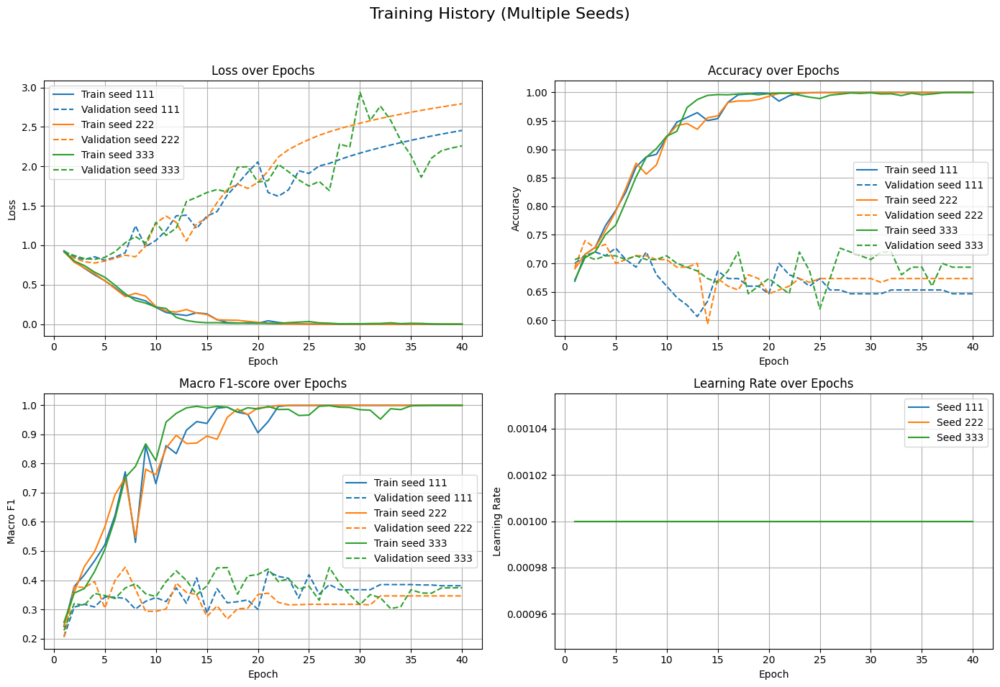

In [63]:
if train_notebook:
  plot_training_histories(histories, seeds)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
=== Evaluation Report: Context Stacked Embedding LSTM ===
Accuracy         : 0.6690 ± 0.0034
Macro F1         : 0.4091 ± 0.0253
Macro Precision  : 0.4594 ± 0.0175
Macro Recall     : 0.3928 ± 0.0221


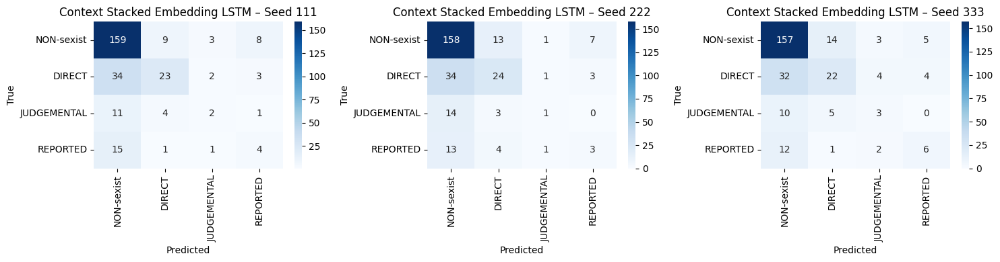

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.671429,0.664286,0.671429,0.669048,0.003367
Macro F1,0.408426,0.378545,0.440385,0.409118,0.025251
Macro Precision,0.461912,0.436921,0.479471,0.459435,0.017459
Macro Recall,0.390206,0.367048,0.421079,0.392777,0.022133


In [74]:
context_metrics_stacked_test = evaluate_models(models_stacked_list_context, X_test_ids, y_test, seeds, class_names=class_names, model_name="Context Stacked Embedding LSTM", )

context_metrics_stacked_test

Detected framework: Keras/Sklearn
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

=== Evaluation Report: Stacked Ensemble with Context ===
--------------------------------------------------
Accuracy         : 0.6786
Macro F1         : 0.4212
Macro Precision  : 0.4825
Macro Recall     : 0.4009
--------------------------------------------------


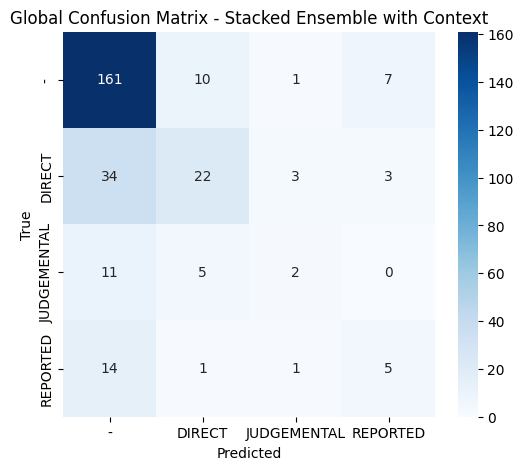

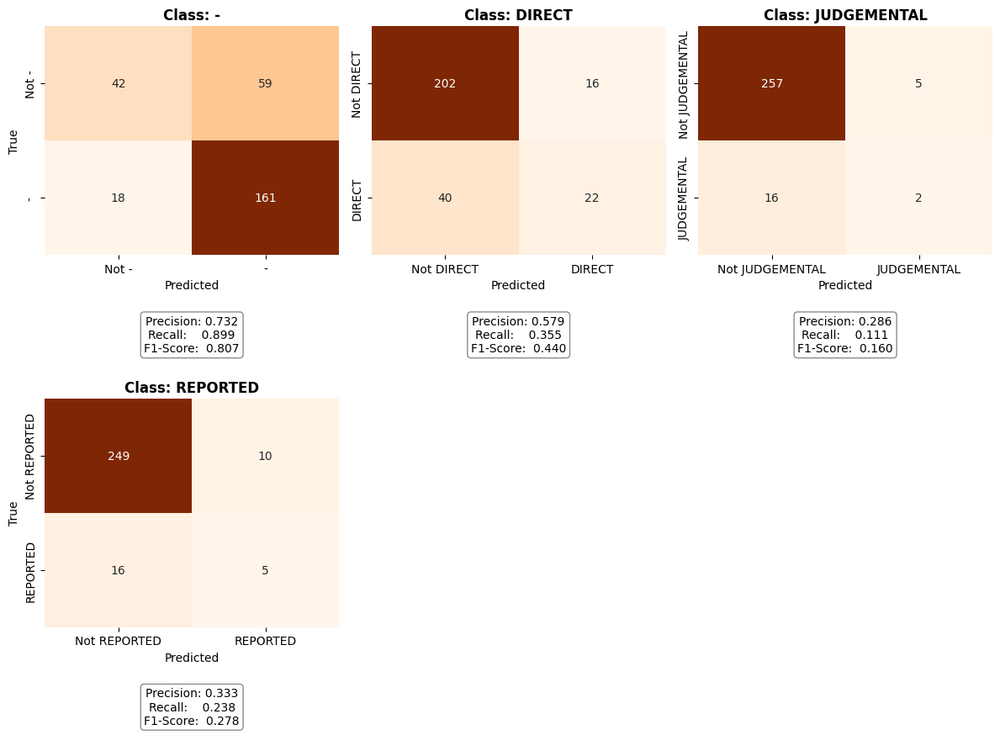

In [75]:
metrics_stacked_ensemble_context, _, _, _ = evaluate_ensemble_confidence_selection(
    models=models_stacked_list_context,
    X_test=X_test_ids,
    y_test=y_test,
    tweets=test_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Stacked Ensemble with Context"
)

### 10.1.4 Comparison and Conclusions


Despite the qualitative improvement observed in the embedding space visualization, the context-based embedding matrix resulted in a consistent but modest decrease in performance (approximately 2-3 percentage points across all metrics) compared to random initialization. A primary explanation is the limited size of the training dataset, which may be insufficient to capture reliable semantic representations for OOV words. Since the proposed method relies on local co-occurrence statistics, sparse observations can lead to noisy or unstable embeddings that do not generalize well.

Additionally, the context-based strategy assumes that neighboring words provide meaningful semantic cues for OOV tokens. In short and noisy texts such as tweets, local context is often limited, informal, or semantically ambiguous. As a result, the averaged context vectors may encode weak or misleading signals, particularly for slang, misspellings, or domain-specific expressions that do not follow regular syntactic patterns.

Finally, the aggregation strategy itself is intentionally naive, as it treats all contextual occurrences equally and ignores positional, syntactic, or frequency-based weighting. More sophisticated approaches, such as subword-based embeddings or jointly learning OOV representations during training, are likely better suited to address this issue.

In conclusion, while the context-based initialization produces embeddings that are better distributed in the latent space, this structural improvement does not directly translate into better downstream performance in the current setting. These findings suggest that the effectiveness of context-based OOV handling is highly dependent on data scale and quality, and that larger corpora or more advanced modeling techniques would be required for this approach to yield consistent performance gains.


**Baseline**

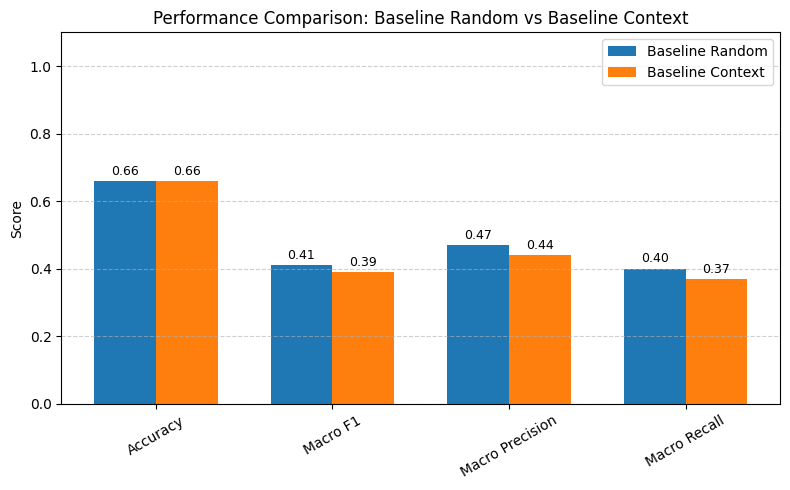

In [80]:
plot_metrics_comparison(metrics_baseline_ensemble, metrics_baseline_ensemble_context, model_a_name="Baseline Random",  model_b_name="Baseline Context")

**Stacked**

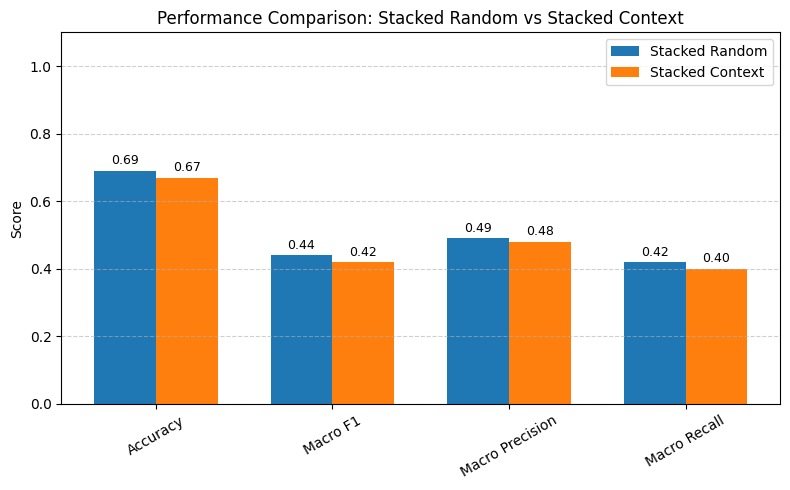

In [82]:
plot_metrics_comparison(metrics_stacked_ensemble, metrics_stacked_ensemble_context, model_a_name="Stacked Random", model_b_name="Stacked Context")

## 10.2 Advanced Training Strategies
In this section, we explore strategies to further improve the macro F1-score of the transformer-based model, Twitter-RoBERTa, which has demonstrated superior performance in previous experiments. By employing more advanced preprocessing and training techniques, we aim to enhance the model's sensitivity to minority classes and its overall class-balanced performance, thereby building upon the strongest baseline identified in earlier evaluations.


### 10.2.1 New Pre-Processing Strategy

The original preprocessing pipeline was designed to support embedding-based recurrent models and focused on strong normalization of the input text. This included the removal of emojis, hashtags, user mentions, URLs, special characters, and quote symbols, followed by lemmatization. While effective in reducing vocabulary size and sparsity for static embedding models, this approach inevitably discards a substantial amount of semantic and pragmatic information that is often central to meaning in social media text.

In contrast, the revised preprocessing strategy adopts a transformer-oriented perspective, aligning more closely with the pre-training assumptions of RoBERTa-based models. Instead of removing key textual elements, the new pipeline preserves their semantic content through controlled normalization. URLs and user mentions are replaced with canonical placeholders `http` and `@user`, allowing the model to retain information about their presence without overfitting to specific instances. Hashtags are preserved by removing only the `#` symbol, thus maintaining the lexical content that often conveys topical or emotional cues.

Importantly, this pipeline avoids lemmatization and aggressive character filtering. Transformer models rely on subword tokenization and contextual embeddings, which are designed to handle morphological variation, informal spelling, and non-standard language. Preserving surface-level variability enables the model to exploit its pre-trained knowledge of social media discourse, including slang, abbreviations, and expressive constructs. HTML entity decoding is additionally applied to ensure textual consistency without altering linguistic structure.


In [ ]:
train_df_roberta = preprocess_dataframe_roberta(train_df_original, column_name='tweet')
dev_df_roberta = preprocess_dataframe_roberta(dev_df_original, column_name='tweet')
test_df_roberta = preprocess_dataframe_roberta(test_df_original, column_name='tweet')

In [ ]:
# Convert Pandas DataFrames to Hugging Face Datasets
train_dataset_roberta = Dataset.from_pandas(train_df_roberta)
eval_dataset_roberta = Dataset.from_pandas(dev_df_roberta)
test_dataset_roberta = Dataset.from_pandas(test_df_roberta)

print("Tokenizing datasets...")
tokenized_train_dataset_roberta = train_dataset_roberta.map(tokenize_function, batched=True)
tokenized_eval_dataset_roberta = eval_dataset_roberta.map(tokenize_function, batched=True)
tokenized_test_dataset_roberta = test_dataset_roberta.map(tokenize_function, batched=True)

Tokenizing datasets...


Map:   0%|          | 0/2873 [00:00<?, ? examples/s]

Map:   0%|          | 0/150 [00:00<?, ? examples/s]

Map:   0%|          | 0/280 [00:00<?, ? examples/s]

### 10.2.2 Class Reweighting

To address class imbalance in the training data, class weights are computed using a balanced heuristic, which assigns higher importance to under-represented classes. Intuitively, each class is weighted inversely to its frequency in the training set, so that rare classes contribute more strongly to the optimization objective.

In the provided implementation, class weights are first computed from the training labels and converted into a PyTorch tensor. These weights are then incorporated into a weighted cross-entropy loss by extending the HuggingFace `Trainer` class. During training, the custom `compute_loss` method retrieves the model logits and applies a `CrossEntropyLoss` function parameterized by the class-specific weights. As a result, the loss contribution of each training example is scaled according to the frequency of its class.

From an optimization perspective, class reweighting modifies the learning signal such that errors on minority classes are penalized more heavily than errors on majority classes. This is particularly important in imbalanced multi-class settings, where standard cross-entropy loss is dominated by frequent classes. In such cases, a model may achieve high accuracy while performing poorly on minority categories, leading to misleading conclusions.

In the context of sexism detection, class imbalance is especially problematic because minority classes often correspond to more subtle or indirect forms of sexist content. Without reweighting, the model tends to underfit these classes, resulting in low recall and macro F1-score. By explicitly compensating for skewed class distributions, class reweighting encourages the model to learn more balanced decision boundaries.


In [106]:
class WeightedLossTrainer(Trainer):
    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=None):
        labels = inputs.get("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        # Move weights to the same device as the model (e.g., GPU)
        weights = class_weights_tensor.to(model.device)

        # Define the Weighted Cross Entropy Loss
        loss_fct = nn.CrossEntropyLoss(weight=weights)

        # Compute loss
        loss = loss_fct(logits.view(-1, self.model.config.num_labels), labels.view(-1))

        return (loss, outputs) if return_outputs else loss

In [107]:
# Calculate class weights based on the training data labels
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_df["label"]),
    y=train_df["label"]
)

# Convert to a Float Tensor
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

print(f"Computed Class Weights: {class_weights}")


Computed Class Weights: [0.3566286  1.33752328 5.20471014 3.90353261]


### 10.2.3 Label Smoothing and Dropout

**Label smoothing** is a regularization technique that softens the target labels used during training. Instead of assigning a probability of 1 to the correct class and 0 to all others, the target distribution is slightly smoothed by redistributing a small portion of the probability mass to the non-target classes. This discourages the model from becoming overconfident in its predictions and improves generalization, particularly in tasks with noisy or ambiguous labels such as sexism detection.

**Dropout** is a widely used regularization method that randomly deactivates a subset of neurons during training. By preventing units from relying excessively on specific activations, dropout reduces co-adaptation between neurons and encourages the model to learn more robust and distributed representations. This is especially beneficial in deep architectures, where overfitting can arise due to high model capacity.

In [ ]:
models_transformer_list = []

dropout_prob = 0.4  #<--- here the DROPOUT

print("Loading models with custom Dropout configuration...")

for i in range(len(seeds)):
    # 1. Load the default configuration
    config = AutoConfig.from_pretrained(
        MODEL_NAME,
        num_labels=4,
        id2label=mapping_inverse,
        label2id=mapping
    )

    # 2. Modify configuration to add Dropout
    config.classifier_dropout = dropout_prob

    # 3. Load model with the modified config
    models_transformer_list.append(
        AutoModelForSequenceClassification.from_pretrained(
            MODEL_NAME,
            config=config,
            ignore_mismatched_sizes=True
        )
    )


Loading models with custom Dropout configuration...


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at cardiffnlp/twitter-roberta-base-hate-latest and are newly initialized because the shapes did not match:
- classifier.out_proj.weight: found shape torch.Size([2, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
- classifier.out_proj.bias: found shape torch.Size([2]) in the checkpoint and torch.Size([4]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at cardiffnlp/twitter-roberta-base-hate-latest and are newly initialized because the shapes did not match:
- classifier.out_proj.weight: found shape torch.Size([2, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
- classifier.out_proj.bias: found shape torch.Size([2]) in the checkpoint and torch.Size([4]) in th

In [ ]:
# Define Training Arguments
training_args = TrainingArguments(
    output_dir=OUTPUT_DIR,
    learning_rate=2e-5,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    num_train_epochs=5,

    eval_strategy="epoch",
    save_strategy="epoch",
    logging_strategy="epoch",
    metric_for_best_model="f1_macro",

    remove_unused_columns=True,
    load_best_model_at_end=True,
    report_to='none',

    label_smoothing_factor=0.1,   #<--- here the LABEL SMOOTHING
)

# DataCollator to pad the sequence
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

# Personalized callback to log F1-score
metrics_callback = MetricsHistoryCallback()


### 10.2.4 Model Training

In [ ]:
# Create trainers for each model
trainers = []

for i in range(len(seeds)):
    # Note: We are using WeightedLossTrainer instead of the standard Trainer
    trainers.append(WeightedLossTrainer(
        model=models_transformer_list[i],
        args=training_args,
        train_dataset=tokenized_train_dataset_roberta,
        eval_dataset=tokenized_eval_dataset_roberta,
        processing_class=tokenizer,
        data_collator=data_collator,
        compute_metrics=compute_metrics,
        callbacks=[metrics_callback]
    ))


In [ ]:
train_models_transformer(trainers, seeds, "RoBERTa Hate Speech – Advanced Training")

TRAINING: RoBERTa Hate Speech – Advanced Training with Random Seed 111


Epoch,Training Loss,Validation Loss,Accuracy,F1 Macro
1,1.234500,1.046723,0.746667,0.550082
2,0.942500,1.011987,0.773333,0.546247
3,0.790400,1.109458,0.826667,0.639223
4,0.626600,1.078278,0.806667,0.629003
5,0.506700,1.196414,0.833333,0.656385


Model seed 111 saved in ./final_model_seed_111
TRAINING: RoBERTa Hate Speech – Advanced Training with Random Seed 222


Epoch,Training Loss,Validation Loss,Accuracy,F1 Macro
1,1.211800,1.083771,0.753333,0.525846
2,0.999000,1.025666,0.680000,0.503689
3,0.826100,1.079862,0.726667,0.567455
4,0.679600,1.260748,0.800000,0.611465
5,0.558400,1.197503,0.766667,0.582118


Model seed 222 saved in ./final_model_seed_222
TRAINING: RoBERTa Hate Speech – Advanced Training with Random Seed 333


Epoch,Training Loss,Validation Loss,Accuracy,F1 Macro
1,1.232600,1.033873,0.766667,0.551546
2,0.959300,1.072110,0.833333,0.633374
3,0.776000,1.014673,0.773333,0.599747
4,0.623800,1.085831,0.833333,0.670104
5,0.526300,1.102324,0.826667,0.676578


Model seed 333 saved in ./final_model_seed_333
TRAINING OVER


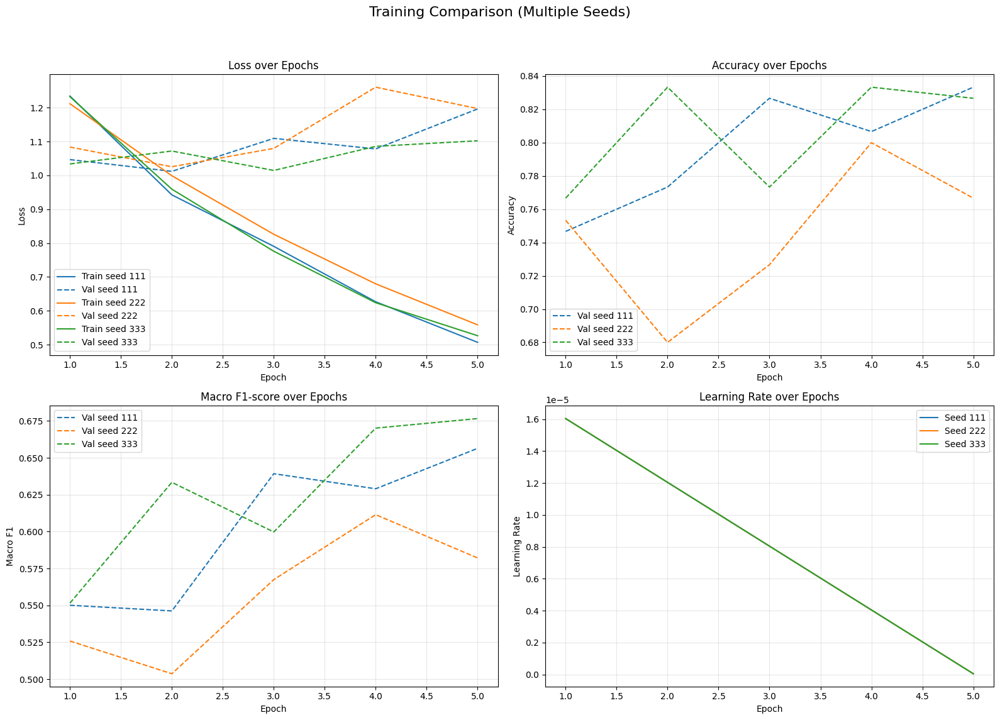

In [ ]:
plot_compare_trainers(trainers, seeds)

Starting evaluation for RoBERTa Hate Speech – Advanced...
  Evaluating seed 111...


  Evaluating seed 222...


  Evaluating seed 333...



=== Evaluation Report: RoBERTa Hate Speech – Advanced ===
--------------------------------------------------
Accuracy         : 0.7095 ± 0.0171
Macro F1         : 0.5142 ± 0.0227
Macro Precision  : 0.5056 ± 0.0204
Macro Recall     : 0.5343 ± 0.0269
--------------------------------------------------


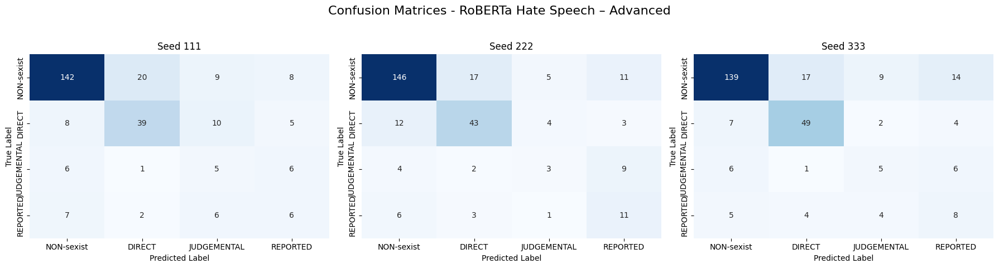

,Seed 111,Seed 222,Seed 333,Mean,Std
Accuracy,0.685714,0.725000,0.717857,0.709524,0.017087
Macro F1,0.482161,0.528053,0.532317,0.514177,0.022705
Macro Precision,0.476716,0.521221,0.518873,0.505603,0.020449
Macro Recall,0.496455,0.549917,0.556397,0.534256,0.026860


In [ ]:
metrics_transformer_advanced_test = evaluate_hf_trainers(trainers=trainers, test_dataset=tokenized_test_dataset_roberta, seeds=seeds,
                                  class_names=class_names, model_name="RoBERTa Hate Speech – Advanced")

metrics_transformer_advanced_test

Detected framework: Hugging Face (Transformers Trainer)



=== Evaluation Report: Transformer Ensemble Advanced ===
--------------------------------------------------
Accuracy         : 0.7179
Macro F1         : 0.5381
Macro Precision  : 0.5250
Macro Recall     : 0.5590
--------------------------------------------------


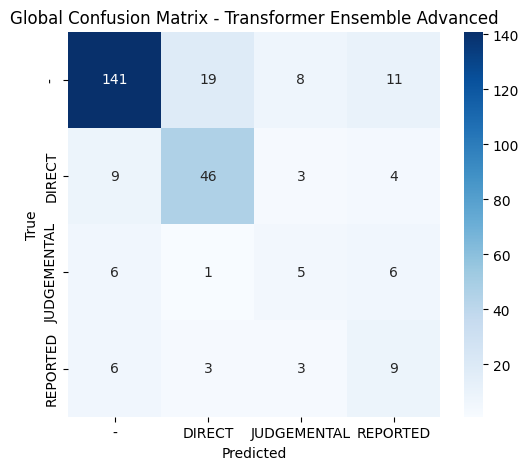

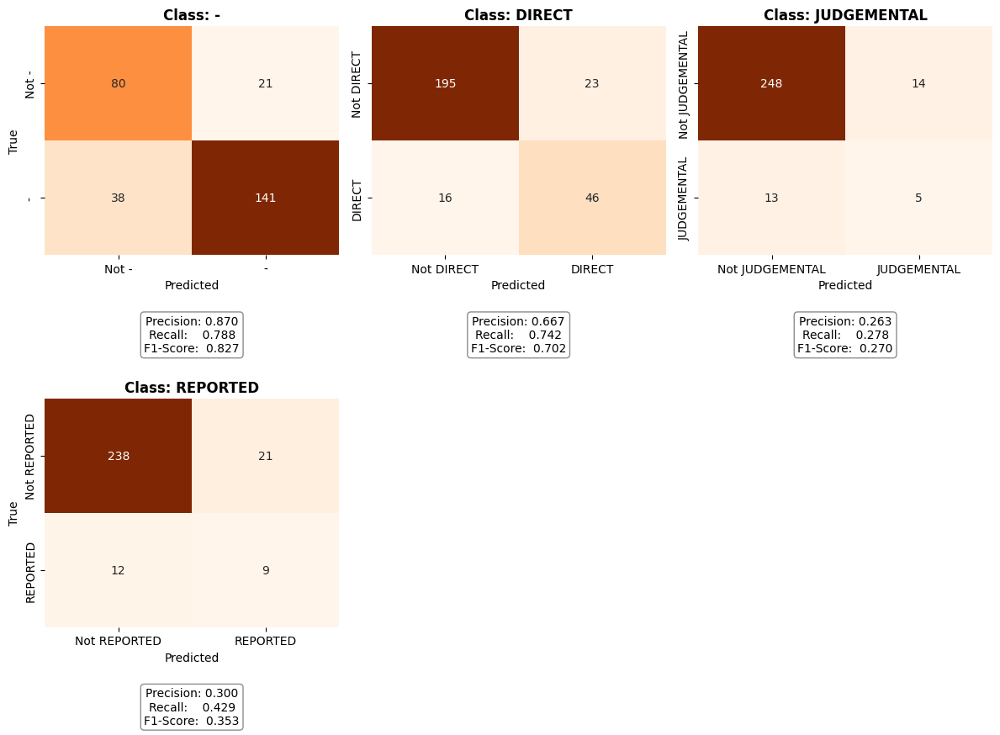

,tweet,true_label,model_1_scores,model_1_pred,model_1_confidence,model_2_scores,model_2_pred,model_2_confidence,model_3_scores,model_3_pred,model_3_confidence,ensemble_pred,selected_model
0,1st day at the pool on a beautiful sunday in ny too bad few dare to go in due to the frigid water temp we last 45 min and figure we prove our point,-,"['0.952', '0.028', '0.010', '0.010']",-,0.952,"['0.944', '0.022', '0.014', '0.020']",-,0.944,"['0.962', '0.022', '0.009', '0.007']",-,0.962,-,Model 3
1,same though the angst just come and go lonely xie lian will always break my frigid heart,-,"['0.946', '0.026', '0.012', '0.017']",-,0.946,"['0.926', '0.039', '0.012', '0.023']",-,0.926,"['0.965', '0.021', '0.008', '0.006']",-,0.965,-,Model 3
2,fuck that cunt try to vote her out multiple time,DIRECT,"['0.018', '0.865', '0.099', '0.018']",DIRECT,0.865,"['0.032', '0.846', '0.089', '0.033']",DIRECT,0.846,"['0.045', '0.913', '0.028', '0.015']",DIRECT,0.913,DIRECT,Model 3
3,u gotta say some shit like ill fuck that cunt dumb until you cant remember anything but my name you stupid slut,DIRECT,"['0.012', '0.904', '0.066', '0.017']",DIRECT,0.904,"['0.023', '0.888', '0.063', '0.026']",DIRECT,0.888,"['0.022', '0.912', '0.045', '0.021']",DIRECT,0.912,DIRECT,Model 3
4,mmm fuck that cunt be hungry for this dick isnt it such a shame that you can lie all you want about not want this but your body never canhe say in her ear before he start kiss down her neck make sure to leave plenty of love mark on her pale skin,DIRECT,"['0.013', '0.944', '0.034', '0.009']",DIRECT,0.944,"['0.023', '0.916', '0.041', '0.020']",DIRECT,0.916,"['0.022', '0.940', '0.026', '0.012']",DIRECT,0.940,DIRECT,Model 1
5,i mean i do but wouldnt it be fun to get gangbanged together,-,"['0.044', '0.912', '0.021', '0.023']",DIRECT,0.912,"['0.034', '0.926', '0.021', '0.018']",DIRECT,0.926,"['0.046', '0.923', '0.017', '0.013']",DIRECT,0.923,DIRECT,Model 2
6,maybe something involve her get gangbanged,DIRECT,"['0.013', '0.924', '0.051', '0.012']",DIRECT,0.924,"['0.021', '0.906', '0.049', '0.023']",DIRECT,0.906,"['0.020', '0.936', '0.032', '0.013']",DIRECT,0.936,DIRECT,Model 3
7,sex a in gender harassment be what they be infer,-,"['0.347', '0.019', '0.223', '0.411']",REPORTED,0.411,"['0.629', '0.024', '0.067', '0.281']",-,0.629,"['0.548', '0.083', '0.281', '0.088']",-,0.548,-,Model 2
8,kabul islamic emirate of afghanistan have announce the end of coeducation in the country cite gender harassmentfemale student will attend university on monday wednesday and saturday while tuesday thursday and sunday be fix for male,REPORTED,"['0.734', '0.029', '0.040', '0.198']",-,0.734,"['0.423', '0.022', '0.041', '0.514']",REPORTED,0.514,"['0.209', '0.016', '0.084', '0.690']",REPORTED,0.690,-,Model 1
9,appreciate be include along with on the uvalde gunman history of cyber gender harassment regrettably unshocking,-,"['0.136', '0.010', '0.048', '0.806']",REPORTED,0.806,"['0.159', '0.015', '0.042', '0.784']",REPORTED,0.784,"['0.020', '0.009', '0.074', '0.897']",REPORTED,0.897,REPORTED,Model 3


In [ ]:
metrics_transformer_advance_ensemble, styled_transformer, raw_transformer, errors_transformer = evaluate_ensemble_confidence_selection(
    models=trainers,
    X_test=tokenized_test_dataset_roberta,
    y_test=None,
    tweets=test_df['tweet'],
    label_mapping=mapping_inverse,
    model_name="Transformer Ensemble Advanced"
)

styled_transformer

### 10.2.5 Comparison and Conclusion

A quantitative comparison between the standard transformer ensemble and the variant incorporating advanced preprocessing and training strategies reveals a clear shift in performance characteristics. The standard ensemble achieved higher overall accuracy (0.76) and macro precision (0.57), reflecting conservative predictions biased toward majority classes. In contrast, the advanced configuration attained a higher macro F1-score (0.54 vs. 0.52), corresponding to an absolute improvement of approximately 2%. This improvement is primarily attributable to an increase in macro recall (0.56 vs. 0.50), which indicates enhanced sensitivity to minority classes. The use of class reweighting during training explicitly amplifies the contribution of under-represented categories to the loss function, thereby encouraging the model to allocate more representational capacity to these classes.

The observed decrease in overall accuracy and precision is consistent with the expected trade-off between conservative, majority-class-biased predictions and balanced performance across all classes. These results demonstrate that advanced preprocessing, coupled with regularization and class reweighting, can systematically improve class-balanced metrics such as macro F1 and recall. This trade-off is particularly desirable in imbalanced multi-class settings, where evaluation metrics that treat all classes equally provide a more faithful measure of model effectiveness than raw accuracy.



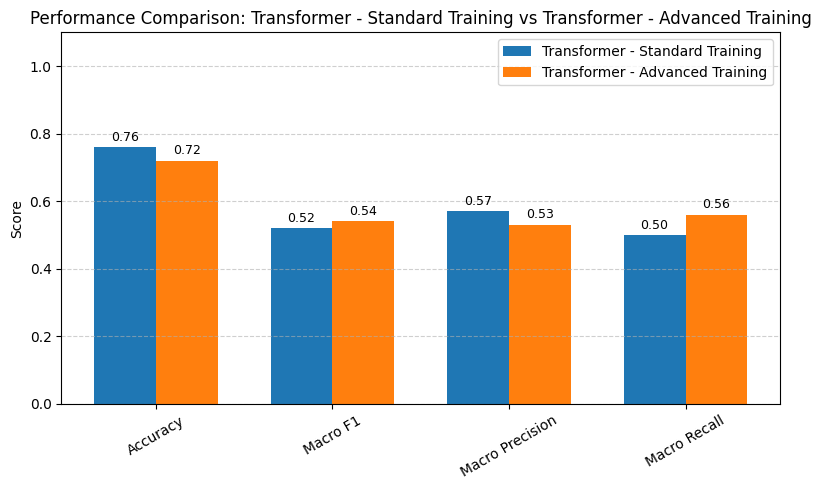

In [84]:
plot_metrics_comparison(metrics_transformer_ensemble, metrics_transformer_advance_ensemble, model_a_name="Transformer - Standard Training",  model_b_name="Transformer - Advanced Training")